In [1]:
import numpy as np
import plotly as py
import plotly.graph_objects as go
import pandas as pd
import time
import traceback

In [2]:
# plots curve and datapoints from coords
def plotter(arr_y, arr_x=None, *coords):
    fig = go.Figure()
    fig.add_trace(go.Scatter(y=arr_y, x=arr_x))
    if coords:
        fig.add_trace(go.Scatter(x=[i[0] for i in coords],
                                 y=[i[1] for i in coords], 
                                 mode='markers'))
    fig.update_layout(
        showlegend=False,
        margin={'t': 30, 'b': 20, 'l': 0, 'r':0}
    )

    
    py.offline.iplot(fig)

In [3]:
data = pd.read_csv('20211104_2-duomenys.csv')
data = data.drop(columns=["Unnamed: 21", "Unnamed: 22"])

In [4]:
def peak_finder(arr, neighbors):
    '''sudetingesnis bet universalus variantas'''
    # kad gautųsi centras prie porinio sk ++
    if neighbors % 2 != 1: neighbors += 1
    peaks_detected = []
    starting_point = neighbors
    for i in range(int(len(arr)/neighbors)):        
        # pretendentas yra iš užduoto diapazono maksimali vertė
        pretendent = np.argmax(arr[starting_point: starting_point + neighbors]) + starting_point        
        # slenkame diapazoną taip, kad pretendentas atsidurtų centre,
        pretendent_range = arr[pretendent - int(neighbors/2): pretendent + int(neighbors/2)]        
        # jeigu pretendentas ir būdamas centre yra argmaxas,
        # fiksuojame piką
        pretendent_range_argmax = np.argmax(pretendent_range)
        if pretendent_range_argmax == neighbors // 2:
            peaks_detected.append([pretendent, arr[pretendent]])
            break
        starting_point += neighbors
        
        
    return peaks_detected

In [5]:
arrays = []
for col in data.columns:
    arr = data[col].to_numpy()
    arrays.append(arr)

0. -1000mbar.csv


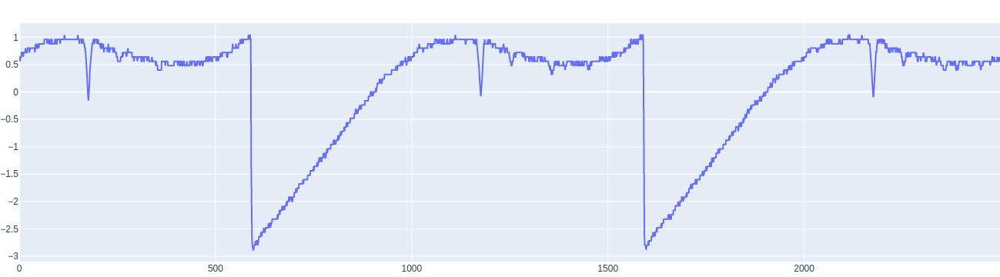

1. -1002mbar.csv


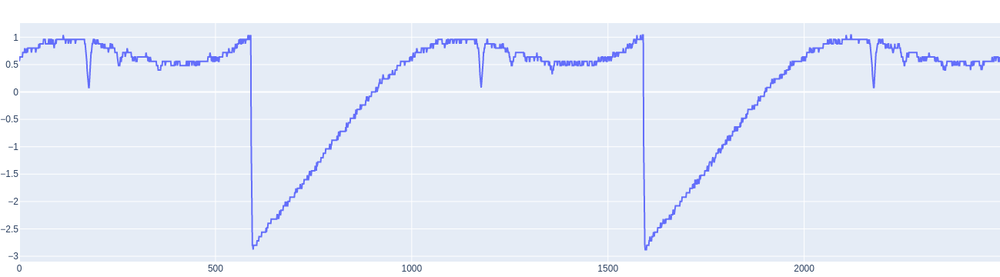

2. -1003mbar.csv


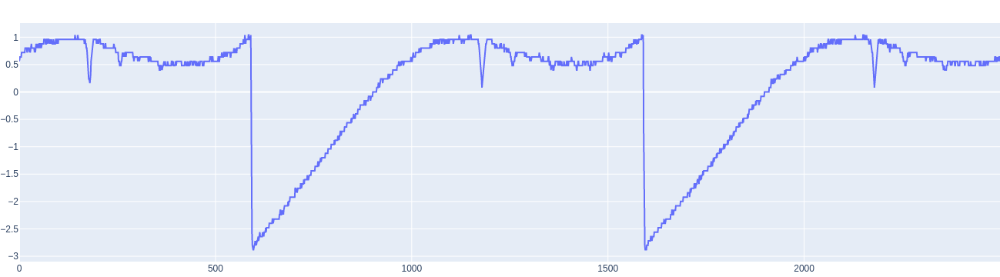

3. -1005mbar.csv


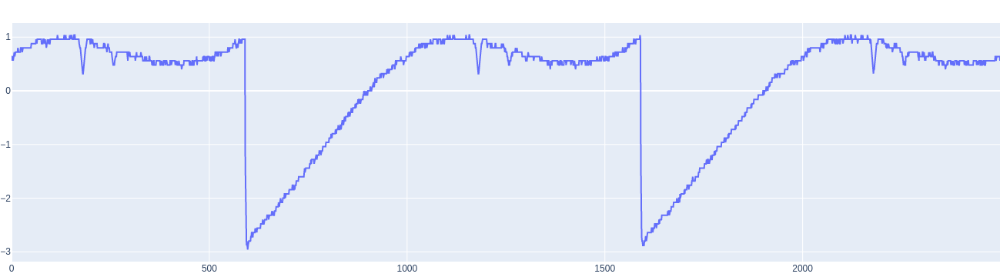

4. -1007mbar.csv


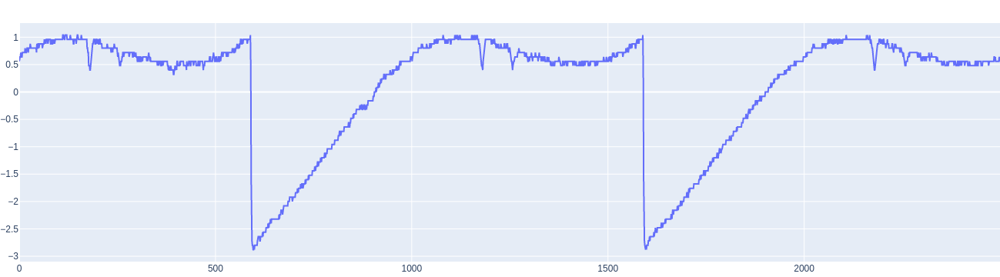

5. -183mbar.csv


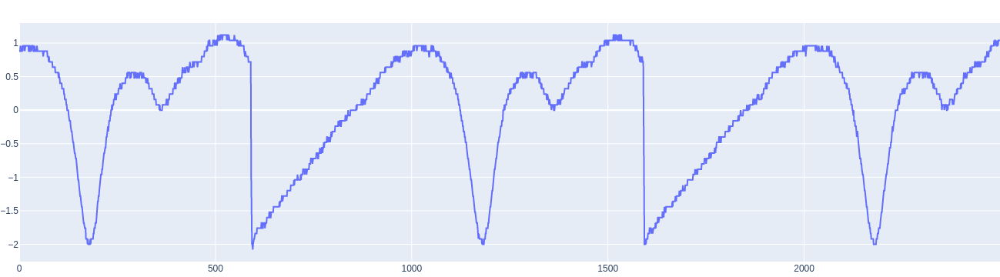

6. -260mbar.csv


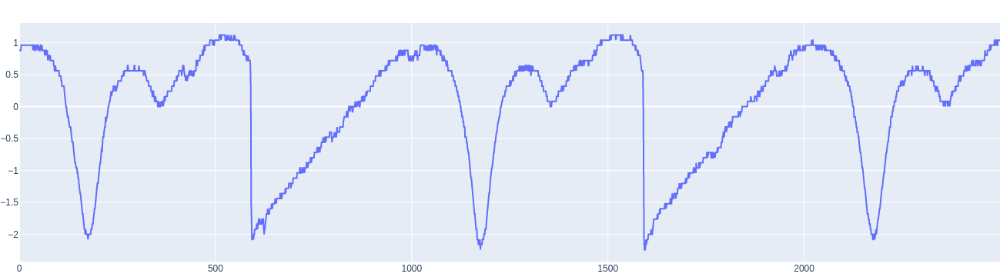

7. -391mbar.csv


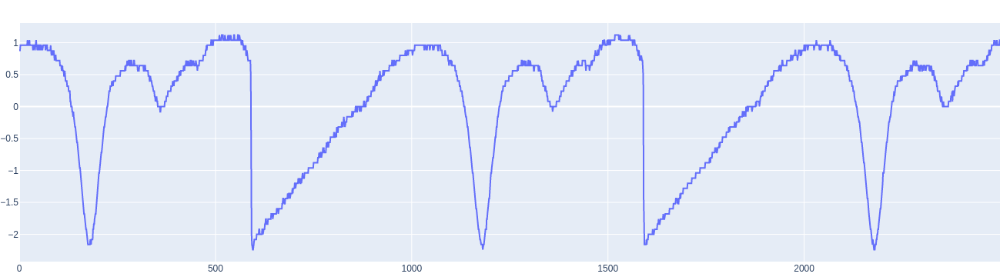

8. -500mbar.csv


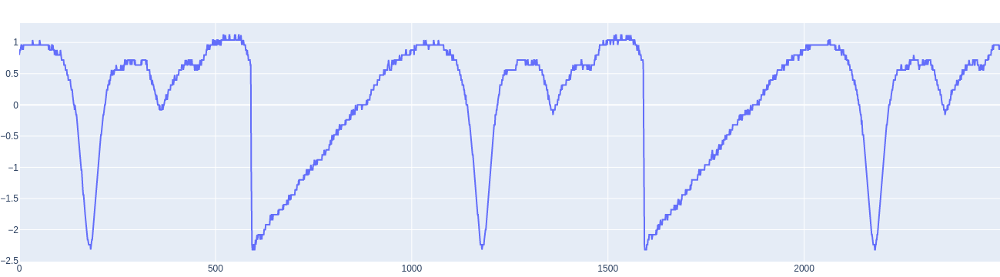

9. -590mbar.csv


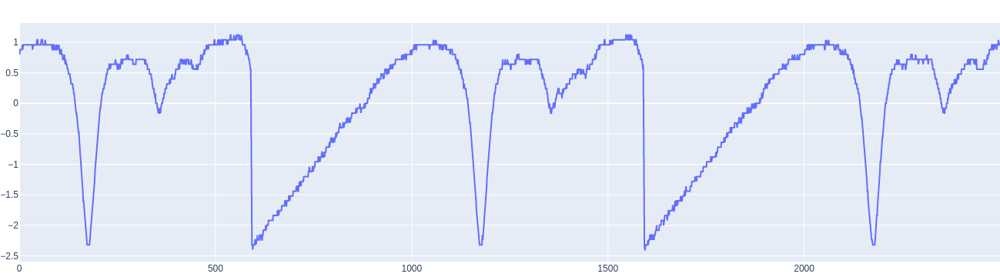

10. -664mbar.csv


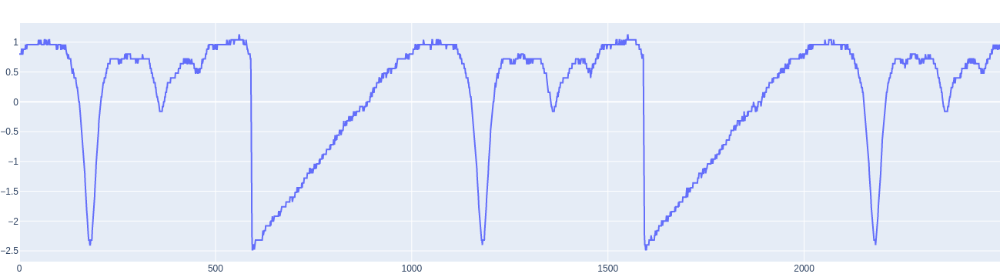

11. -725mbar.csv


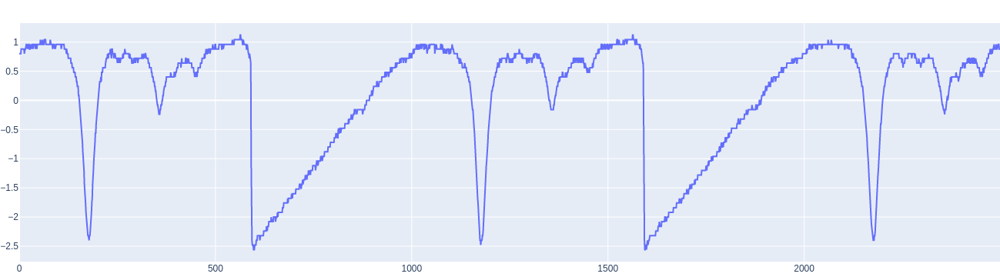

12. -7mbar.csv


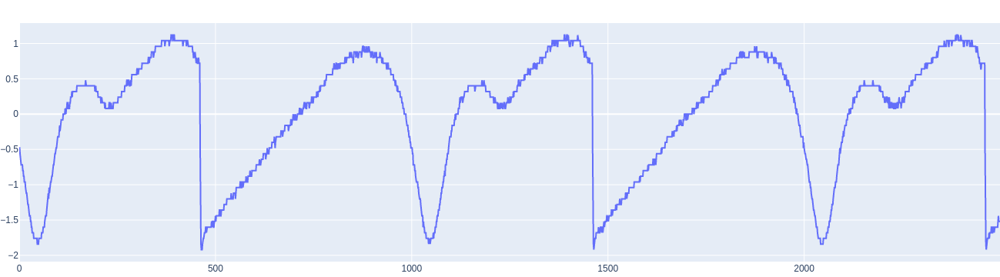

13. -817mbar.csv


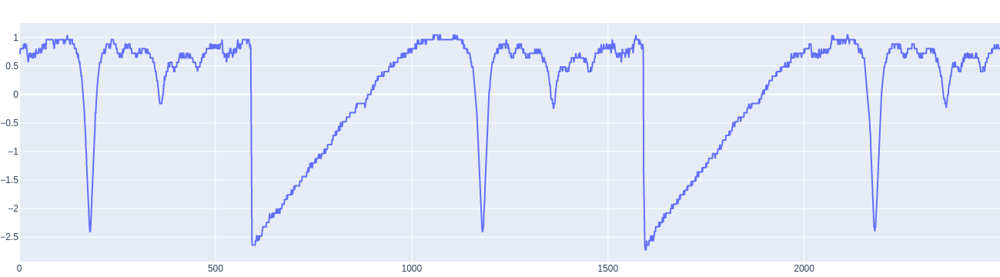

14. -913mbar.csv


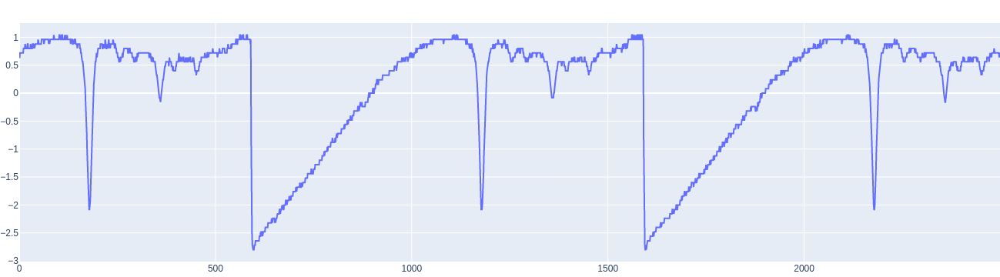

15. -938mbar.csv


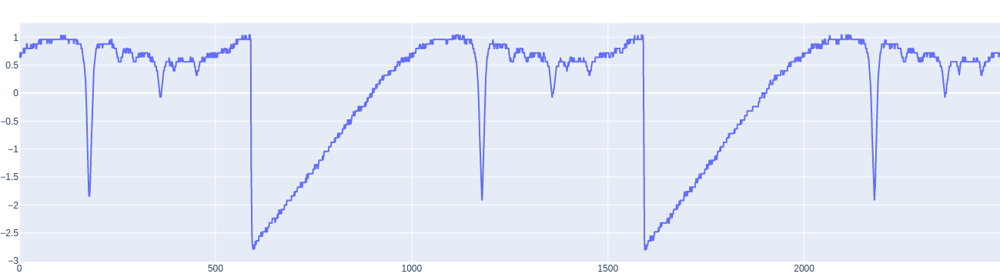

16. -962mbar.csv


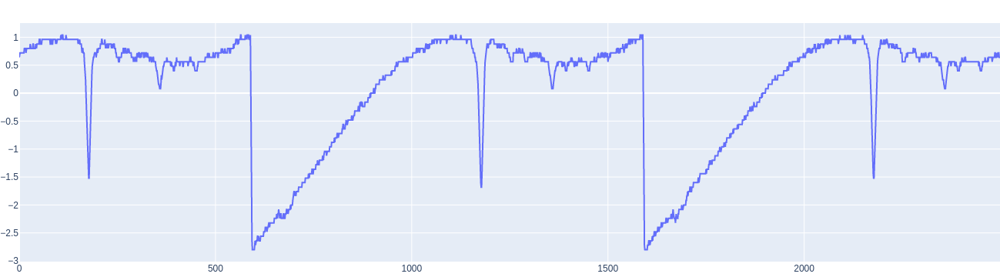

17. -978mbar.csv


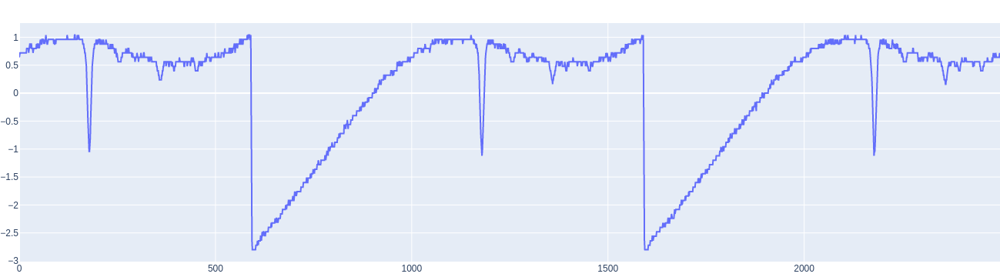

18. -989mbar.csv


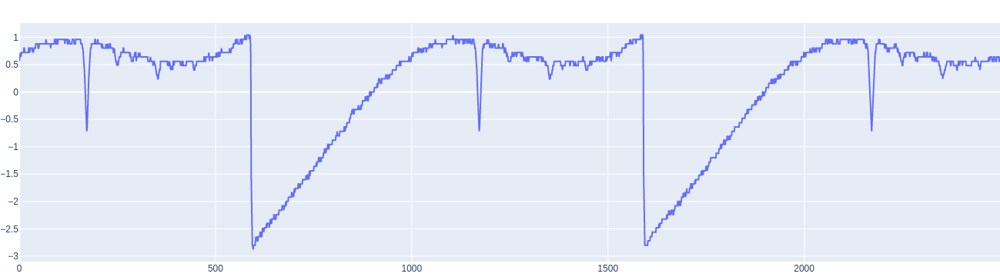

19. -997mbar.csv


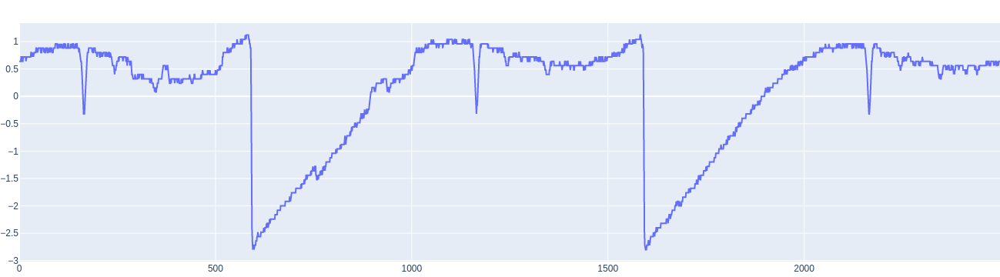

20. -99mbar.csv


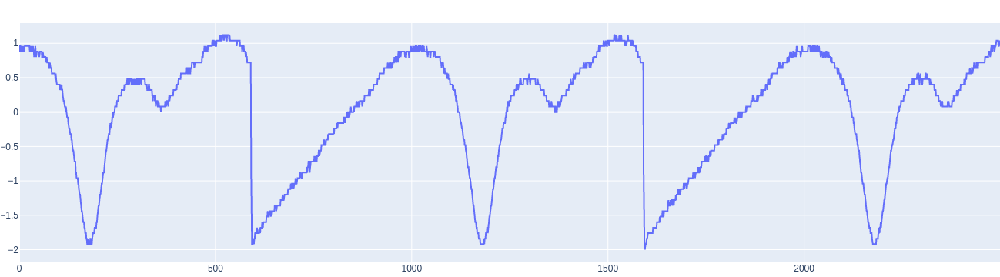

21. -1015mbar_vaq.csv


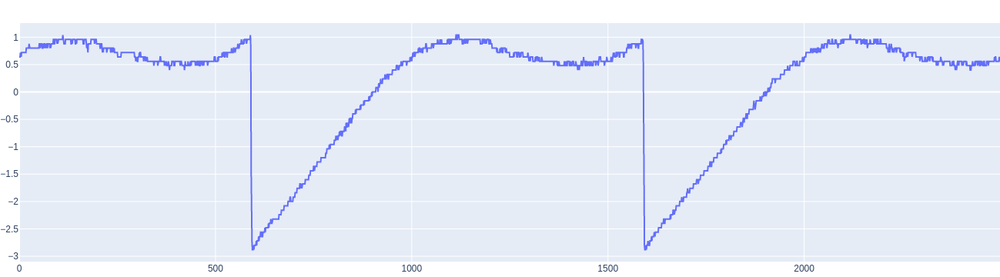

In [6]:
counter = 0
for arr in arrays:
    print(f'{counter}. {data.columns[counter]}')
    plotter(arr)
    counter += 1


In [7]:
def wave_splitter(arr, wave_len):
    '''suranda bangos pražią, grąžina bangos pradžių indeksus vėlesniam kreivės suskirstymui į bangas'''
    # surandame tašką, kur didžiausias perkritimas žemyn
    max_diff_idx = np.diff(arr[:wave_len]).argmin()
    # nuo to taško imame nedidelį submasyvą. Jo minimumas bus pirmos bangos pradžia.
    split_point = arr[max_diff_idx:max_diff_idx + 10].argmin() + max_diff_idx
    # surandama, kiek sveikų bangų masyve
    waves_count = len(arr[split_point:])//wave_len
    # surandamos likusių bangų pradžios
    split_points = [split_point,]
    last_point = split_point
    for i in range(waves_count):
        last_point += wave_len
        split_points.append(last_point)
    # grąžinamos masyve visos sveikų bangų pradžios (paskutinė nesveika)
    return split_points[:-1]

In [8]:
def rescale_get_area_args(wave_len, arg):
    return round(1000 / wave_len * arg)

In [9]:
round(345.555)

346

In [10]:
def get_area(arr, start_a, bottom_a, bottom_b):
    '''paprastas variantas, darant prielaidą, kad pikai rasis maždaug ten pat, taip pat
    piko pabaiga bus pikas į viršų
    arr - paduodamas masyvas, vienos bangos ilgio
    start_a - diapazono pradžia piko pradžios paieškai
    bottom_a, bottom_b - diapazonas, kuriame tikimės piko'''
    # surandamas piko apačios indeksas
    peak_negative = arr[bottom_a:bottom_b].argmin() + bottom_a
    
    # surandamas piko pradžios indeksas
    # kadangi argmax() ieško pirmo maksimalalios vertes indekso, ieškome apsukę diapazoną
    start_idx_reversed = arr[start_a:peak_negative][::-1].argmax()
    start_idx = peak_negative - start_idx_reversed - 1
    # jeigu pikas yra spyglys. If bloką galima iškomentuoti, jei nuspyglinimas nedomina.
    if arr[start_idx - 1] == arr[start_idx + 1]:
        print("spyglys!")
        # pikas yra spyglio pagrindo aukštyje. Perstumiamas į tą vietą, kur tokia reikšmė pirmą kartą atsiranda atkarpoje.
        start_idx_reversed = np.argmax(arr[start_a:peak_negative][::-1] == arr[start_idx-1])
        start_idx = peak_negative - start_idx_reversed - 1
        print(f'pataisytas: {start_idx}')

    # surandamas piko pabaigos indeksas
    end_idx = arr[peak_negative: peak_negative + 150].argmax() + peak_negative
    # transformuojama piko atkarpa (paruošiama integracijai)
    # y ašis perslenkama taip, kad max vertė atsidurtų ties 0, apverčiama
    peak = (arr[start_idx:end_idx+1]-arr[start_idx:end_idx+1].max())*-1
    # plotter(peak)
    # panaudojama numpy trapz funkcija ploto suintegravimui
    # atimamas trikampis kur a - piko ilgis, b - skirtumas tarp pradžios ir pabaigos
    a = len(peak) - 1
    b = max([peak[0], peak[-1]]) if peak[0]!=peak[-1] else 0 # kadangi paruošto piko min = 0, parenkamas tiesiog galas su didesne verte 
    area = np.trapz(peak) - a*b/2
    # grąžinamas plotas
    # grąžinami piko pradžios, apačios ir pabaigos taškai (spausdinimui notebook'o aplinkoje)
    return area, start_idx, peak_negative, end_idx
    

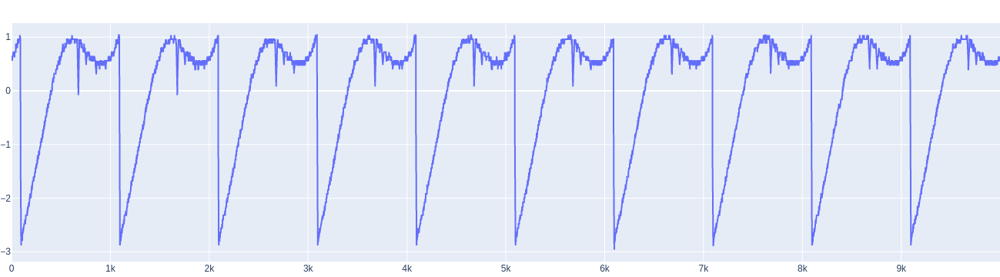

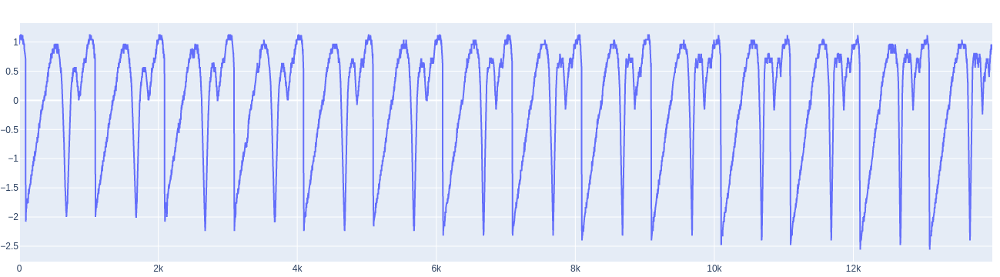

In [11]:
# Pasidarom is pirmu 5 masyvu daug bangu testavimui
pirmos_penkios = arrays[:5]
five2000 = [i[500:] for i in pirmos_penkios]
long_arr = np.concatenate((five2000))
plotter(long_arr)  
antra_dalis = arrays[5:12]
sujungtos = [i[500:] for i in antra_dalis]


long_arr2 = np.concatenate((sujungtos))
plotter(long_arr2)

In [12]:
def main_simple(arr, wave_len):
    
    split_points = wave_splitter(arr, 1000)
    start_time = time.time()
    waves = [arr[i:i+1000] for i in split_points]
    excecution_time = time.time() - start_time
    print(f'Waves splitted in {excecution_time}s')
    counter = 1
    for wave in waves:
        try:
            start_time = time.time()

            #  bandom išlyginti kreivę (nepadeda)
            # window = 3
            # cumsum_vec = np.cumsum(np.insert(wave, 0, 0)) 
            # wave = (cumsum_vec[window:] - cumsum_vec[:-window]) / window

            area, start, bottom, end = get_area(wave, 400, 570, 600)
            excecution_time = time.time() - start_time
            plotter_args = [[start, wave[start]], [bottom, wave[bottom]], [end, wave[end]]]
            print(f'{counter}. AREA: {area}. Completed in {excecution_time}s')
            counter += 1
            plotter(wave, None, *plotter_args)
        except Exception as e:
            print(traceback.format_exc())
        
    # start = time.time()
    # wave = arr[split_point:split_point + 1000]
    # peaks_detected = get_area(wave, 400, 580, 500, 600)
    # excecution_time = time.time() - start
    # print(excecution_time)
    # plotter(wave, None, *peaks_detected)

Waves splitted in 8.821487426757812e-06s
spyglys!
pataisytas: 570
1. AREA: 10.079999999999998. Completed in 0.00024700164794921875s


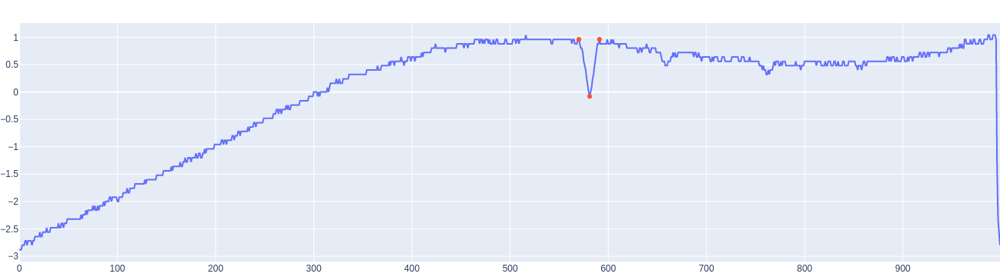

spyglys!
pataisytas: 568
2. AREA: 10.32. Completed in 0.00033164024353027344s


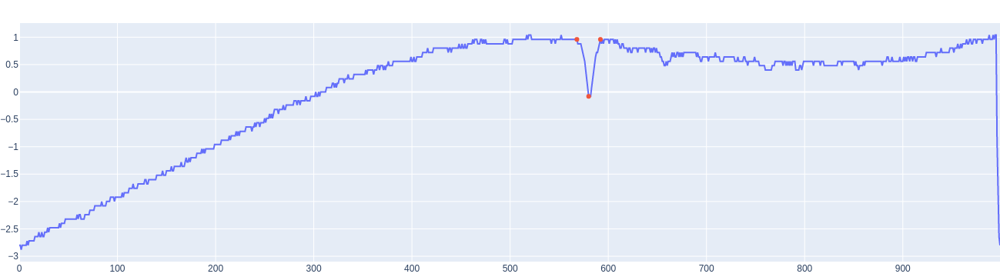

3. AREA: 9.04. Completed in 0.000133514404296875s


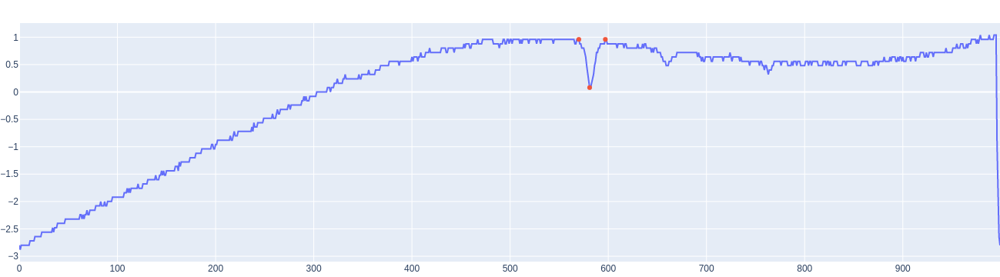

4. AREA: 11.88. Completed in 0.00011563301086425781s


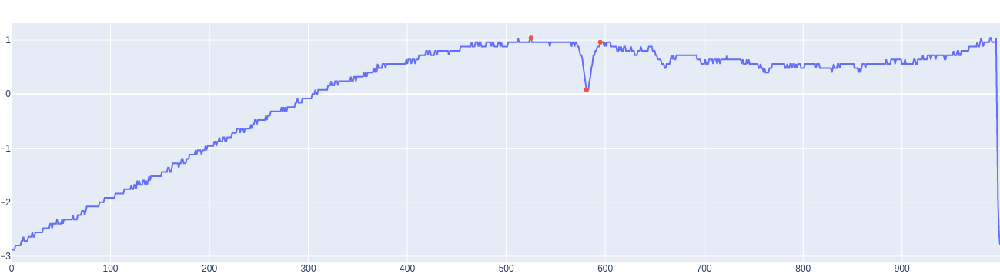

5. AREA: 9.64. Completed in 0.00012564659118652344s


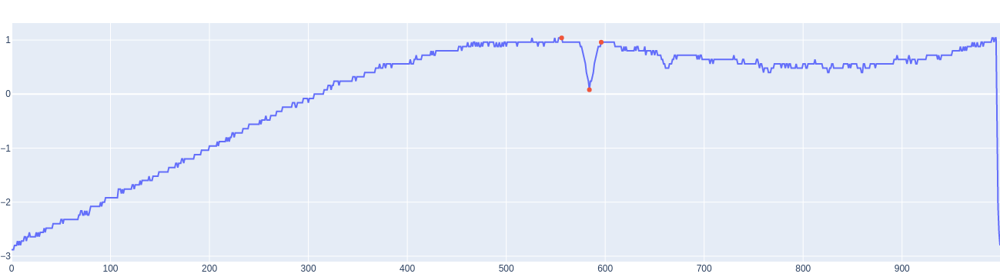

spyglys!
pataisytas: 574
6. AREA: 8.0. Completed in 0.0002129077911376953s


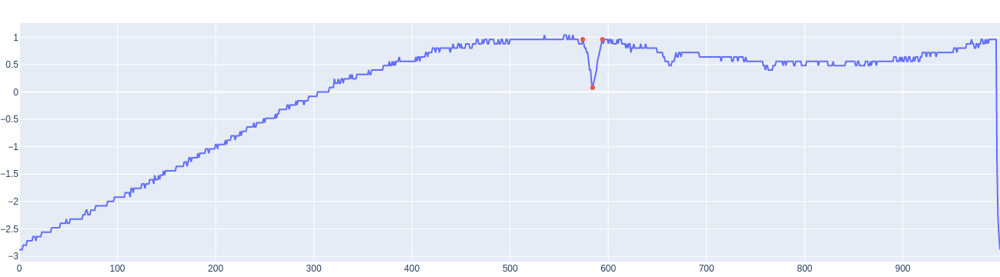

7. AREA: 7.399999999999999. Completed in 0.00014162063598632812s


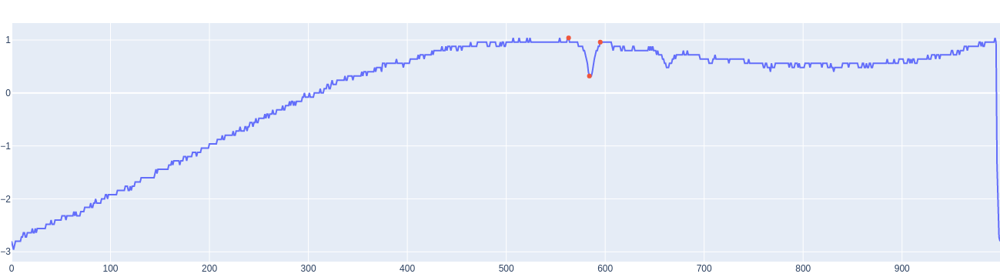

spyglys!
pataisytas: 577
8. AREA: 5.519999999999999. Completed in 0.00043964385986328125s


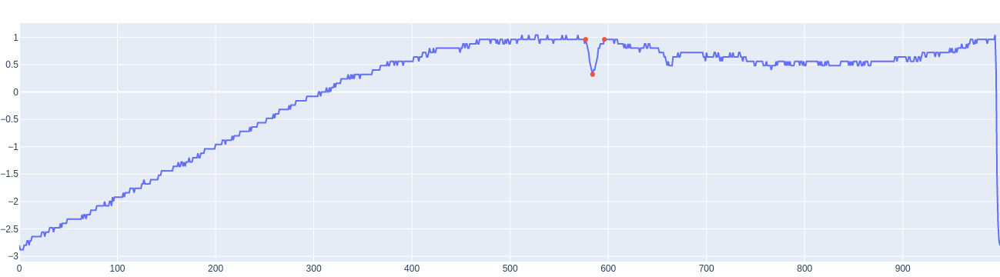

9. AREA: 5.5600000000000005. Completed in 0.00013971328735351562s


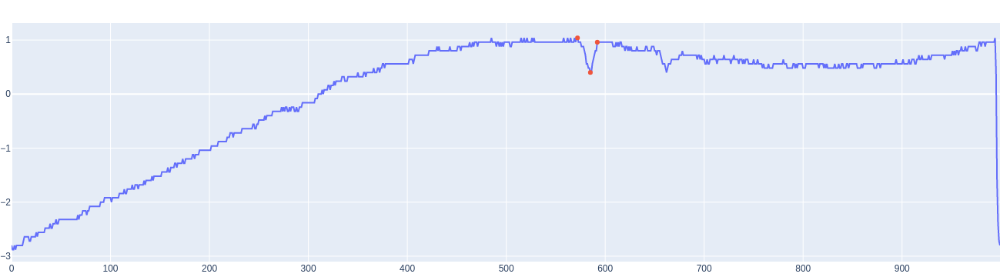

In [13]:
main_simple(long_arr, 1000)

Waves splitted in 1.4781951904296875e-05s
spyglys!
pataisytas: 474
1. AREA: 229.6. Completed in 0.0002009868621826172s


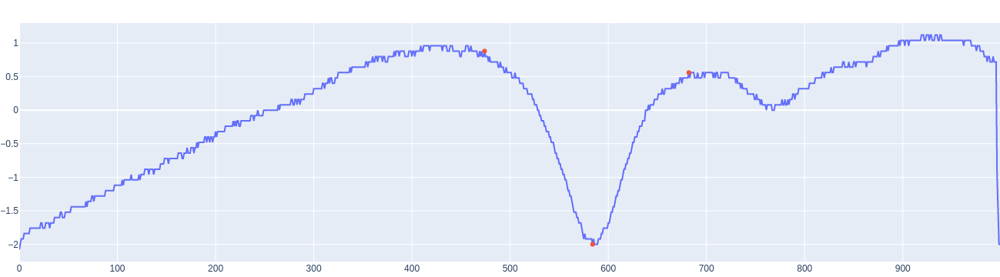

spyglys!
pataisytas: 475
2. AREA: 228.24000000000007. Completed in 0.00018930435180664062s


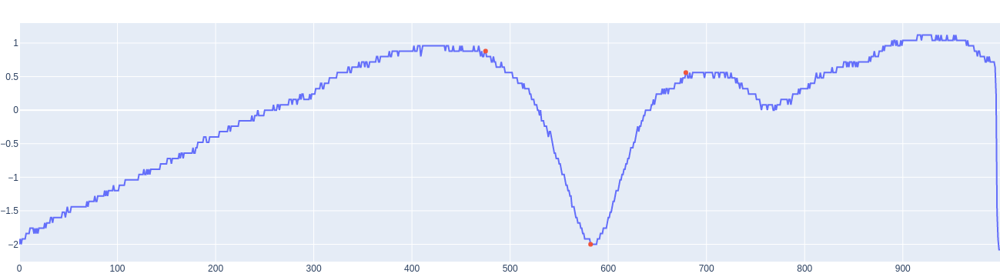

3. AREA: 233.2. Completed in 0.00032210350036621094s


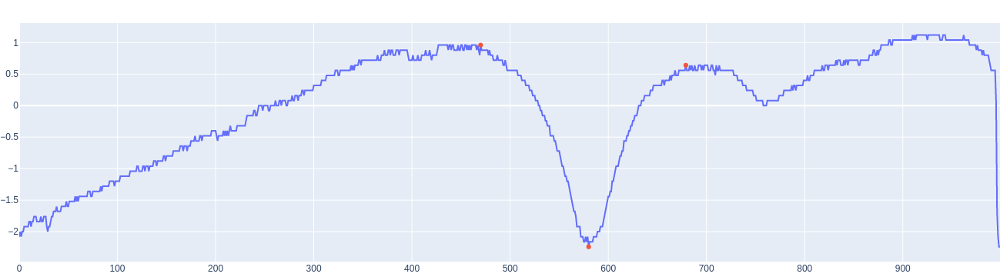

4. AREA: 234.68. Completed in 0.0001308917999267578s


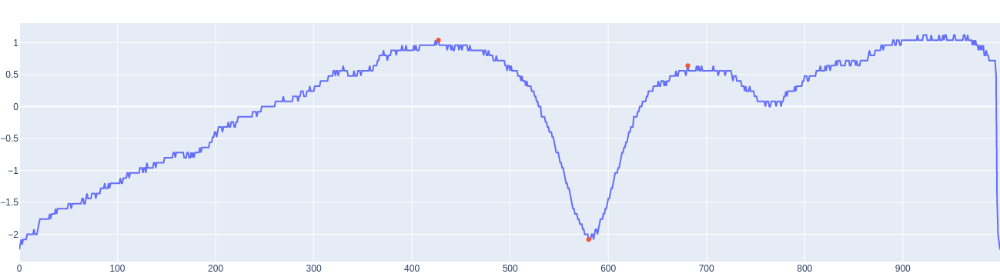

5. AREA: 215.03999999999996. Completed in 0.00010561943054199219s


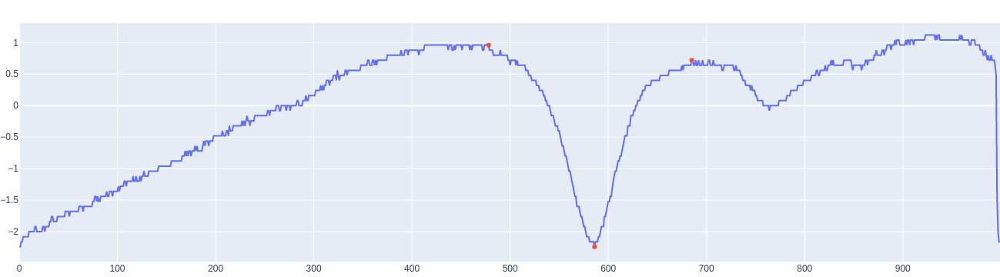

spyglys!
pataisytas: 478
6. AREA: 216.00000000000003. Completed in 0.0001876354217529297s


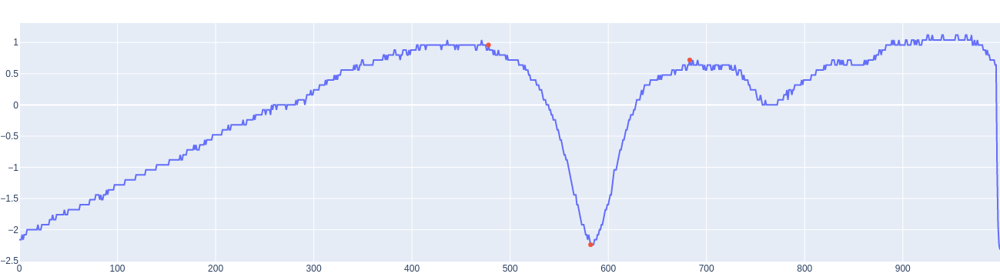

spyglys!
pataisytas: 486
7. AREA: 188.75999999999996. Completed in 0.0001735687255859375s


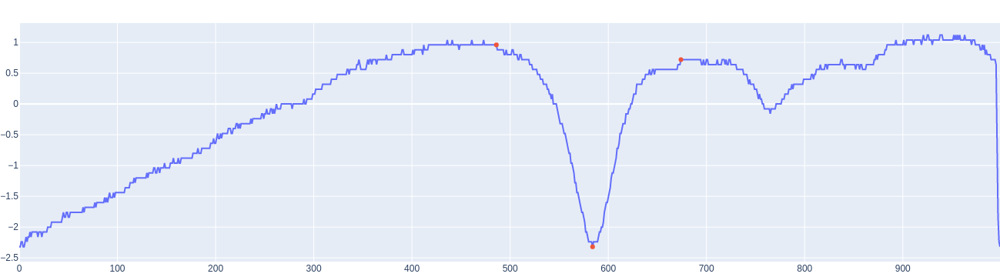

8. AREA: 204.32. Completed in 0.00011348724365234375s


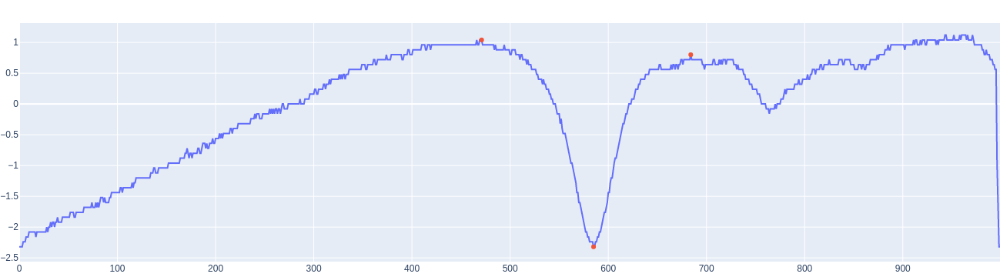

spyglys!
pataisytas: 493
9. AREA: 172.16. Completed in 0.00017523765563964844s


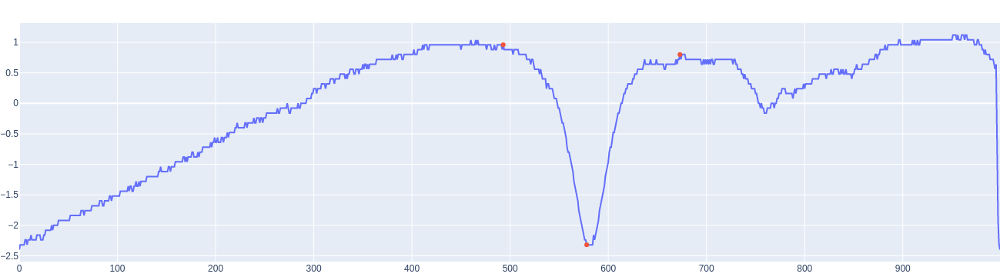

spyglys!
pataisytas: 492
10. AREA: 173.44000000000003. Completed in 0.0001747608184814453s


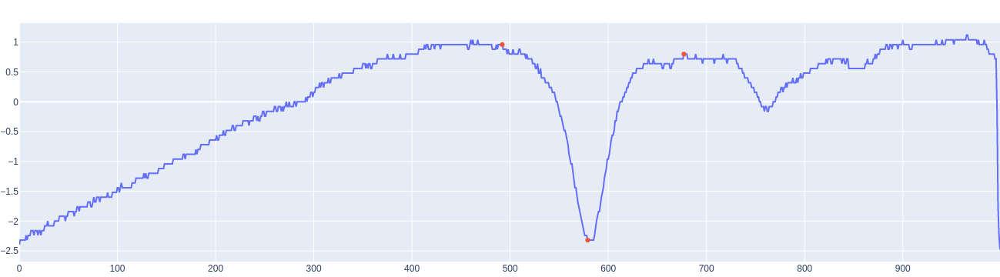

spyglys!
pataisytas: 519
11. AREA: 149.11999999999998. Completed in 0.0003604888916015625s


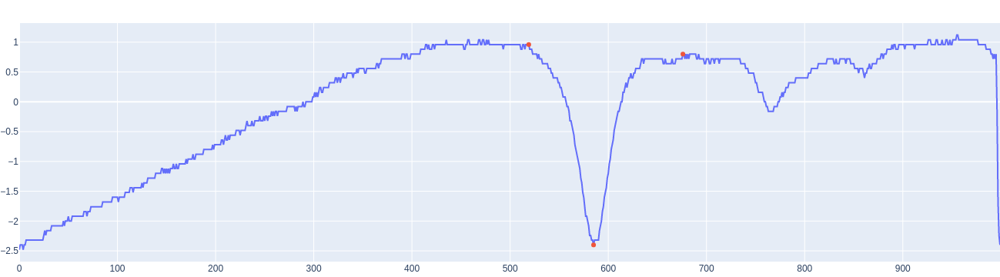

spyglys!
pataisytas: 516
12. AREA: 148.88000000000002. Completed in 0.0002446174621582031s


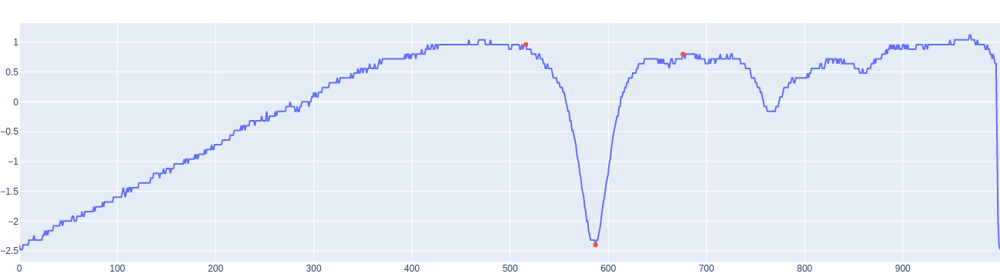

spyglys!
pataisytas: 511
13. AREA: 137.36. Completed in 0.00023555755615234375s


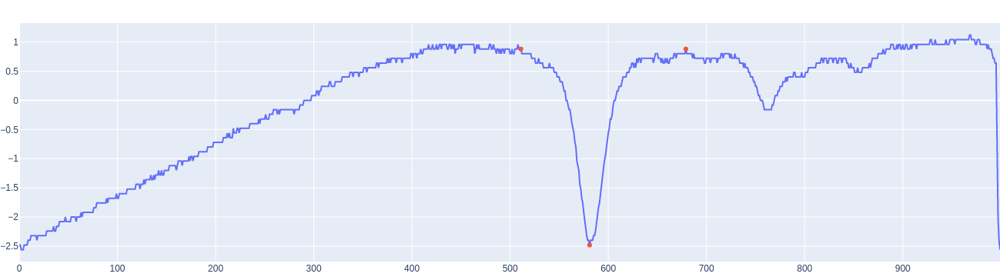

In [14]:
main_simple(long_arr2, 1000)

In [15]:
# pikų vidurkinimas :)


1000


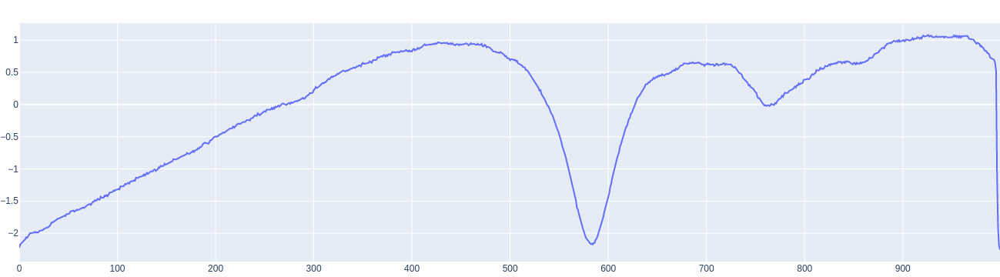

0.034819841384887695


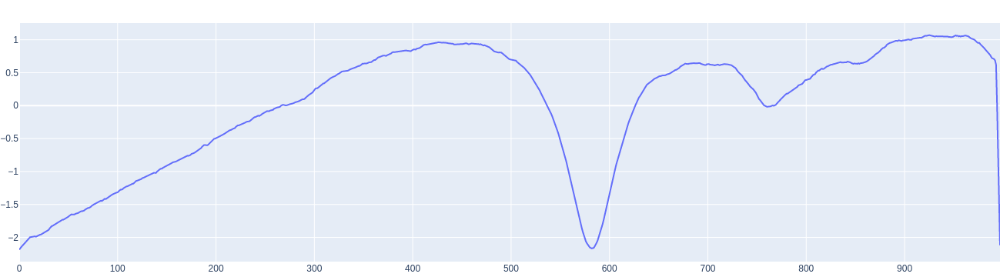

In [16]:
# vidurkiname 1000 bangų po 1000 taškų

split_points = wave_splitter(long_arr2, 1000)
ten_waves = [long_arr2[i:i+1000] for i in split_points][:10]
waves = ten_waves * 100
print(len(waves))
start_time = time.time()
avg_wave = np.mean(np.array(waves), axis=0)
plotter(avg_wave)
#  bandom išlyginti kreivę (nepadeda)
window = 3
cumsum_vec = np.cumsum(np.insert(avg_wave, 0, 0)) 
wave = (cumsum_vec[window:] - cumsum_vec[:-window]) / window
excecution_time = time.time() - start_time
print(excecution_time)
plotter(wave)


In [17]:
split_points = wave_splitter(long_arr, 1000)
ten_waves_sm = [long_arr[i:i+1000] for i in split_points][:10]
ten_waves_sm = np.concatenate((ten_waves_sm))

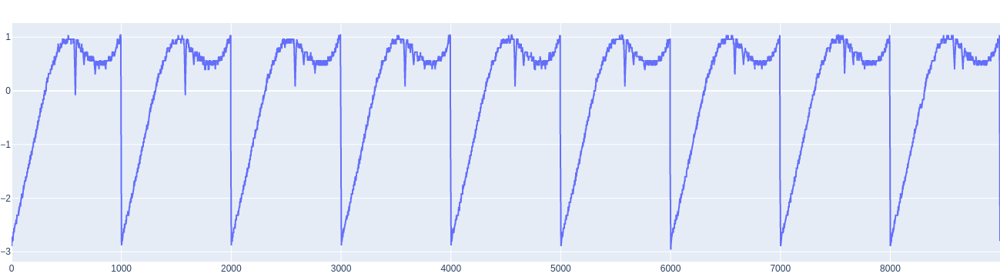

In [18]:
plotter(ten_waves_sm)

In [50]:
res array([3.06859, 3.09438, 3.08148, 3.06859, 3.09438, 3.12016, 3.06859, 3.09438, 3.02991, 3.09438, 3.06859, 3.08148, 3.09438, 3.02991, 3.06859, 3.06859, 3.06859, 3.08148, 3.06859, 3.0557, 3.06859, 3.06859, 3.09438, 3.08148, 3.0557, 3.06859, 3.01702, 3.09438, 3.08148, 3.0557, 3.09438, 3.02991, 3.10727, 3.08148, 3.0557, 3.08148, 3.01702, 3.08148, 3.06859, 3.06859, 3.08148, 3.01702, 3.06859, 3.09438, 3.06859, 3.06859, 3.08148, 3.06859, 3.08148, 3.08148, 3.0557, 3.06859, 3.01702, 3.09438, 3.08148, 3.0557, 3.12016, 3.01702, 3.08148, 3.08148, 3.0557, 3.08148, 3.01702, 3.09438, 3.06859, 3.06859, 3.08148, 3.01702, 3.0557, 3.08148, 3.06859, 3.08148, 3.06859, 3.04281, 3.08148, 3.06859, 3.08148, 3.08148, 3.0557, 3.08148, 3.01702, 3.09438, 3.06859, 3.04281, 3.08148, 3.01702, 3.08148, 3.06859, 3.06859, 3.06859, 3.01702, 3.0557, 3.08148, 3.06859, 3.09438, 3.08148, 3.04281, 3.08148, 3.06859, 3.08148, 3.06859, 3.04281, 3.09438, 3.01702, 3.08148, 3.06859, 3.04281, 3.06859, 3.01702, 3.08148, 3.08148, 3.06859, 3.08148, 3.01702, 3.08148, 3.08148, 3.0557, 3.08148, 3.01702, 3.04281, 3.09438, 3.06859, 3.08148, 3.06859, 3.04281, 3.08148, 3.08148, 3.08148, 3.06859, 3.02991, 3.09438, 3.01702, 3.09438, 3.08148, 3.04281, 3.09438, 3.06859, 3.0557, 3.0557, 3.01702, 3.09438, 3.08148, 3.0557, 3.08148, 3.02991, 3.04281, 3.09438, 3.0557, 3.08148, 3.08148, 3.02991, 3.08148, 3.0557, 3.08148, 3.06859, 3.04281, 3.09438, 3.02991, 3.09438, 3.08148, 3.04281, 3.06859, 3.13306, 3.08148, 3.08148, 3.0557, 3.08148, 3.02991, 3.09438, 3.09438, 3.06859, 3.08148, 3.02991, 3.04281, 3.09438, 3.06859, 3.06859, 3.06859, 3.02991, 3.09438, 3.0557, 3.08148, 3.06859, 3.02991, 3.08148, 3.02991, 3.09438, 3.08148, 3.04281, 3.06859, 3.02991, 3.09438, 3.06859, 3.0557, 3.08148, 3.04281, 3.09438, 3.09438, 3.06859, 3.08148, 3.02991, 3.00413, 3.09438, 3.0557, 3.08148, 3.08148, 3.02991, 3.10727, 3.06859, 3.09438, 3.06859, 3.02991, 3.09438, 3.06859, 3.09438, 3.06859, 3.02991, 3.06859, 3.02991, 3.08148, 3.08148, 3.06859, 3.06859, 3.01702, 3.08148, 3.10727, 3.0557, 3.0557, 3.02991, 3.0557, 3.06859, 3.06859, 3.02991, 3.10727, 3.0557, 3.09438, 3.08148, 3.02991, 3.09438, 3.04281, 3.08148, 3.06859, 3.02991, 3.06859, 3.04281, 3.09438, 3.06859, 3.0557, 3.06859, 3.04281, 3.08148, 3.10727, 3.0557, 3.06859, 3.04281, 3.01702, 3.10727, 3.0557, 3.06859, 3.08148, 3.02991, 3.12016, 3.0557, 3.08148, 3.06859, 3.02991, 3.10727, 3.04281, 3.09438, 3.06859, 3.01702, 3.06859, 3.04281, 3.06859, 3.06859, 3.06859, 3.06859, 3.04281, 3.08148, 3.12016, 3.0557, 3.08148, 3.04281, 3.02991, 3.10727, 3.04281, 3.0557, 3.08148, 3.02991, 3.12016, 3.04281, 3.08148, 3.06859, 3.01702, 3.10727, 3.06859, 3.06859, 3.06859, 3.02991, 3.06859, 3.0557, 3.08148, 3.08148, 3.04281, 3.0557, 3.04281, 3.08148, 3.19752, 3.04281, 3.0557, 3.04281, 3.01702, 3.12016, 3.04281, 3.0557, 3.08148, 3.02991, 3.12016, 3.04281, 2.96545, 3.06859, 3.02991, 3.12016, 3.06859, 3.01702, 3.0557, 3.04281, 3.08148, 3.06859, 3.04281, 3.0557, 3.06859, 3.08148, 3.10727, 3.0557, 3.0557, 3.04281, 3.02991, 3.12016, 3.06859, 3.0557, 3.06859, 3.01702, 3.0557, 3.04281, 3.08148, 3.08148, 3.01702, 3.12016, 3.0557, 3.06859, 3.08148, 3.01702, 3.0557, 3.06859, 3.06859, 3.08148, 3.04281, 3.04281, 3.0557, 3.06859, 3.12016, 3.0557, 3.0557, 3.0557, 3.01702, 3.12016, 3.04281, 3.04281, 3.06859, 3.0557, 3.10727, 3.04281, 3.06859, 3.06859, 3.01702, 3.10727, 3.0557, 3.06859, 3.06859, 3.01702, 3.0557, 2.97834, 3.08148, 3.0557, 3.0557, 3.04281, 3.06859, 3.08148, 3.12016, 3.04281, 3.0557, 3.0557, 3.01702, 3.14595, 3.04281, 3.06859, 3.06859, 3.02991, 3.12016, 3.0557, 3.06859, 3.06859, 3.02991, 3.12016, 3.06859, 3.0557, 3.06859, 3.01702, 3.04281, 3.06859, 3.06859, 3.0557, 3.0557, 3.0557, 3.06859, 3.08148, 3.04281, 3.06859, 3.01702, 3.12016, 3.04281, 3.04281, 3.0557, 3.01702, 3.10727, 3.0557, 3.06859, 3.06859, 3.01702, 3.10727, 3.0557, 3.0557, 3.0557, 3.01702, 3.0557, 3.08148, 3.06859, 3.06859, 3.04281, 3.0557, 3.08148, 3.06859, 3.12016, 3.04281, 3.04281, 3.06859, 3.02991, 3.10727, 3.04281, 3.04281, 3.06859, 3.01702, 3.10727, 3.04281, 3.0557, 3.06859, 3.02991, 3.12016, 3.08148, 3.0557, 3.06859, 3.01702, 3.04281, 3.08148, 3.04281, 3.0557, 3.04281, 3.04281, 3.06859, 3.06859, 3.10727, 3.02991, 3.02991, 3.06859, 3.02991, 3.08148, 3.04281, 3.0557, 3.0557, 3.01702, 3.09438, 3.0557, 3.0557, 3.06859, 3.02991, 3.10727, 3.08148, 3.12016, 3.06859, 3.02991, 3.0557, 3.08148, 3.04281, 3.06859, 3.0557, 3.04281, 3.08148, 3.06859, 3.09438, 2.93966, 3.04281, 3.08148, 3.01702, 3.10727, 3.04281, 3.04281, 3.0557, 3.02991, 3.10727, 3.04281, 3.02991, 3.22331, 3.08148, 3.04281, 3.06859, 3.01702, 3.02991, 3.08148, 3.04281, 3.06859, 3.04281, 3.04281, 3.09438, 3.0557, 3.10727, 3.0557, 3.0557, 3.08148, 3.04281, 3.10727, 3.04281, 3.0557, 3.06859, 3.02991, 3.09438, 3.04281, 3.04281, 3.0557, 3.00413, 3.09438, 3.08148, 3.01702, 3.0557, 3.02991, 3.04281, 3.09438, 3.01702, 3.06859, 3.0557, 3.0557, 3.10727, 3.04281, 3.09438, 3.04281, 3.04281, 3.08148, 3.02991, 3.09438, 3.04281, 3.02991, 3.0557, 3.02991, 3.04281, 3.04281, 3.02991, 3.06859, 3.02991, 3.10727, 3.09438, 3.02991, 3.06859, 3.04281, 3.04281, 3.09438, 3.04281, 3.0557, 3.04281, 3.02991, 3.08148, 3.01702, 3.09438, 3.04281, 3.04281, 3.09438, 3.02991, 3.09438, 3.04281, 3.04281, 3.06859, 3.04281, 3.09438, 3.04281, 2.99123, 3.06859, 3.02991, 3.09438, 3.08148, 3.01702, 3.06859, 3.02991, 3.04281, 3.09438, 3.00413, 3.06859, 3.09438, 3.01702, 3.08148, 3.04281, 3.02991, 3.09438, 3.02991, 3.08148, 3.04281, 3.04281, 3.06859, 3.02991, 3.08148, 3.04281, 3.00413, 3.06859, 3.02991, 3.09438, 3.09438, 3.00413, 3.06859, 3.04281, 3.02991, 3.08148, 3.00413, 3.0557, 3.0557, 3.04281, 3.15884, 3.00413, 3.08148, 3.04281, 3.02991, 3.09438, 3.02991, 3.09438, 3.04281, 3.04281, 3.0557, 3.02991, 3.01702, 3.04281, 2.99123, 3.0557, 3.02991, 3.08148, 3.08148, 2.99123, 3.0557, 3.02991, 3.04281, 3.10727, 3.01702, 3.0557, 3.04281, 3.02991, 3.09438, 2.99123, 3.08148, 3.0557, 3.04281, 3.10727, 3.02991, 3.06859, 3.02991, 3.02991, 3.06859, 3.04281, 3.08148, 3.04281, 2.99123, 3.06859, 3.04281, 3.08148, 3.09438, 2.99123, 3.06859, 3.02991, 3.02991, 3.06859, 2.99123, 3.0557, 3.02991, 3.02991, 3.08148, 2.97834, 3.06859, 3.04281, 3.04281, 3.09438, 3.04281, 3.06859, 3.04281, 3.04281, 3.06859, 3.04281, 2.97834, 3.04281, 3.04281, 3.06859, 3.09438, 2.99123, 3.06859, 3.04281, 3.04281, 3.09438, 2.99123, 3.0557, 3.04281, 3.02991, 3.09438, 2.97834, 3.06859, 3.04281, 3.02991, 3.10727, 3.04281, 3.06859, 3.02991, 3.02991, 3.06859, 3.0557, 3.06859, 3.04281, 2.99123, 3.06859, 3.04281, 3.01702, 3.09438, 2.99123, 3.0557, 3.04281, 3.02991, 3.09438, 2.99123, 3.0557, 3.04281, 3.04281, 3.09438, 2.97834, 3.06859, 3.04281, 3.04281, 3.09438, 3.04281, 3.0557, 3.02991, 3.04281, 3.04281, 3.02991, 3.0557, 3.02991, 2.97834, 3.04281, 3.04281, 3.0557, 3.08148, 2.97834, 3.0557, 3.0557, 3.04281, 3.13306, 2.99123, 3.04281, 3.02991, 3.02991, 3.09438, 2.99123, 3.0557, 3.02991, 3.02991, 3.09438, 3.04281, 3.10727, 3.02991, 3.04281, 3.0557, 3.0557, 3.0557, 3.04281, 3.00413, 3.0557, 3.0557, 3.0557, 3.09438, 2.87519, 3.06859, 3.04281, 2.99123, 3.0557, 3.04281, 3.04281, 3.09438, 3.00413, 3.04281, 3.04281, 3.04281, 3.01702, 3.0557, 3.0557, 3.02991, 3.02991, 3.0557, 3.06859, 3.0557, 3.04281, 3.00413, 3.04281, 3.0557, 3.04281, 3.08148, 2.99123, 3.04281, 3.04281, 3.04281, 3.09438, 3.00413, 3.04281, 3.02991, 3.02991, 3.09438, 2.99123, 3.04281, 3.02991, 3.04281, 3.09438, 3.06859, 3.04281, 3.02991, 3.02991, 3.0557, 3.0557, 3.02991, 3.04281, 2.99123, 3.04281, 3.06859, 3.0557, 3.08148, 3.00413, 3.04281, 3.0557, 3.02991, 3.09438, 3.00413, 3.0557, 3.02991, 3.04281, 3.08148, 3.00413, 3.02991, 3.02991, 3.01702, 3.08148, 3.06859, 3.04281, 3.02991, 3.02991, 3.04281, 3.04281, 3.02991, 3.02991, 3.00413, 3.04281, 3.0557, 3.02991, 3.08148, 3.00413, 3.04281, 3.0557, 3.04281, 3.08148, 3.00413, 3.0557, 3.04281, 3.04281, 3.08148, 3.00413, 3.01702, 3.02991, 3.02991, 3.08148, 3.04281, 3.04281, 3.0557, 3.06859, 3.01702, 3.04281, 3.00413, 3.04281, 3.0557, 3.01702, 3.08148, 3.00413, 3.02991, 3.0557, 3.0557, 3.08148, 3.00413, 3.0557, 3.04281, 3.04281, 3.08148, 3.01702, 3.01702, 3.04281, 3.04281, 3.08148, 3.04281, 3.01702, 3.02991, 3.04281, 3.04281, 3.0557, 3.00413, 3.04281, 3.00413, 3.0557, 3.02991, 3.01702, 3.04281, 3.00413, 3.04281, 3.06859, 3.04281, 3.08148, 3.00413, 3.04281, 3.0557, 3.04281, 3.10727, 2.99123, 2.95255, 3.0557, 3.02991, 3.06859, 3.06859, 3.00413, 3.0557, 3.04281, 3.04281, 3.06859, 3.04281, 3.0557, 3.00413, 3.04281, 3.06859, 3.00413, 3.06859, 2.99123, 3.02991, 3.0557, 3.02991, 3.06859, 2.97834, 3.02991, 3.0557, 3.04281, 3.08148, 3.00413, 3.00413, 3.06859, 3.04281, 3.08148, 3.06859, 3.00413, 3.0557, 3.04281, 3.04281, 3.0557, 3.01702, 3.0557, 3.00413, 3.0557, 3.06859, 2.99123, 3.04281, 3.06859, 3.04281, 3.0557, 2.99123, 3.02991, 3.06859, 3.04281, 3.06859, 2.99123, 3.00413, 3.04281, 3.04281, 3.06859, 3.06859, 3.00413, 3.06859, 3.0557, 3.02991, 3.0557, 2.99123, 3.04281, 2.99123, 3.04281, 3.06859, 3.00413, 3.06859, 2.99123, 3.04281, 3.06859, 3.02991, 3.0557, 3.00413, 3.0557, 3.06859, 3.04281, 3.06859, 3.01702, 3.00413, 3.06859, 3.0557, 3.06859, 3.06859, 3.00413, 3.06859, 3.04281, 3.04281, 3.06859, 3.00413, 3.06859, 2.99123, 3.04281, 3.06859, 2.99123, 3.06859, 3.00413, 3.04281, 3.0557, 3.04281, 3.0557, 3.00413, 3.04281, 3.06859, 3.0557, 3.06859, 3.00413, 2.99123, 3.06859, 3.04281, 3.0557, 3.06859, 2.99123, 3.06859, 3.04281, 3.02991, 3.06859, 2.99123, 3.08148, 3.00413, 3.02991, 3.0557, 2.99123, 3.0557, 3.00413, 3.04281, 3.08148, 3.04281, 3.04281, 3.00413, 3.02991, 3.08148, 3.04281, 3.0557, 3.00413, 3.04281, 3.06859, 3.04281, 3.06859, 3.00413, 3.00413, 3.06859, 3.04281, 3.04281, 3.06859, 2.99123, 3.06859, 3.04281, 3.04281, 3.06859, 3.00413, 3.08148, 3.01702, 3.04281, 3.06859, 2.99123, 3.04281, 3.01702, 3.0557, 3.06859, 3.04281, 3.04281, 3.01702, 3.04281, 3.06859, 3.04281, 3.04281, 3.01702, 2.99123, 3.08148, 3.0557, 3.0557, 3.0557, 2.99123, 3.06859, 3.04281, 3.0557, 3.06859, 2.99123, 3.08148, 3.01702, 3.04281, 3.0557, 2.99123, 3.02991, 3.02991, 3.04281, 3.06859, 3.08148, 3.02991, 3.04281, 3.04281, 3.06859, 3.04281, 3.02991, 3.02991, 2.99123, 3.06859, 3.04281, 3.04281, 3.01702, 2.99123, 3.04281, 3.0557, 3.04281, 3.06859, 2.99123, 3.06859, 3.06859, 2.97834, 3.04281, 3.02991, 2.99123, 3.0557, 3.02991, 3.02991, 3.04281, 3.0557, 3.06859, 3.04281, 3.04281, 3.02991, 2.99123, 3.06859, 3.19752, 3.04281, 3.10727, 2.97834, 3.06859, 3.04281, 3.04281, 3.06859, 3.00413, 3.06859, 3.02991, 3.04281, 3.2491, 2.99123, 2.97834, 3.04281, 3.04281, 3.0557, 3.02991, 3.02991, 3.04281, 3.0557, 3.0557, 3.04281, 3.02991, 3.02991, 2.97834, 3.06859, 3.0557, 3.04281, 3.06859, 2.99123, 3.06859, 3.04281, 3.04281, 3.0557, 2.99123, 3.06859, 3.04281, 3.02991, 3.0557, 2.99123, 3.01702, 3.04281, 3.04281, 3.0557, 3.0557, 3.02991, 3.06859, 3.0557, 3.06859, 3.04281, 3.02991, 3.04281, 2.99123, 3.0557, 3.04281, 3.01702, 3.06859, 2.99123, 3.04281, 3.04281, 3.02991, 3.04281, 2.99123, 3.0557, 3.04281, 3.04281, 3.06859, 3.00413, 3.01702, 3.04281, 3.02991, 3.0557, 3.04281, 3.02991, 3.04281, 3.04281, 3.01702, 3.0557, 3.00413, 3.06859, 3.0557, 3.02991, 3.0557, 2.99123, 3.0557, 3.0557, 3.04281, 3.0557, 2.99123, 3.06859, 3.0557, 3.02991, 3.0557, 2.99123, 3.01702, 3.0557, 3.04281, 3.0557, 3.0557, 3.02991, 3.06859, 3.0557, 3.0557, 3.0557, 3.01702, 3.06859, 2.99123, 3.0557, 3.0557, 3.01702, 3.0557, 2.99123, 3.06859, 3.04281, 3.04281, 3.0557, 2.99123, 3.06859, 3.06859, 3.04281, 3.06859, 3.00413, 3.01702, 3.0557, 3.02991, 3.0557, 3.04281, 3.01702, 3.0557, 3.02991, 3.0557, 3.0557, 3.01702, 3.06859, 2.99123, 3.06859, 3.0557, 3.01702, 3.06859, 3.00413, 3.06859, 3.06859, 3.02991, 3.02991, 2.99123, 3.06859, 3.06859, 3.04281, 3.0557, 2.99123, 3.01702, 3.06859, 3.04281, 3.0557, 3.0557, 3.09438, 3.06859, 3.04281, 3.06859, 3.0557, 3.01702, 3.06859, 2.99123, 3.06859, 3.04281, 3.01702, 3.0557, 2.84941, 3.06859, 3.0557, 3.00413, 3.06859, 3.06859, 3.04281, 3.0557, 3.00413, 3.00413, 3.06859, 3.02991, 2.95255, 3.0557, 3.01702, 3.06859, 3.02991, 3.0557, 3.04281, 3.00413, 3.06859, 3.00413, 3.06859, 3.0557, 3.0557, 3.04281, 3.02991, 3.06859, 3.0557, 3.02991, 3.04281, 3.00413, 3.0557, 3.06859, 3.02991, 3.0557, 3.00413, 3.01702, 3.13306, 3.04281, 3.0557, 3.04281, 3.00413, 3.08148, 3.04281, 3.06859, 3.0557, 3.01702, 3.06859, 3.00413, 3.01702, 3.04281, 3.00413, 3.0557, 3.01702, 3.06859, 3.06859, 3.02991, 3.0557, 3.01702, 3.06859, 3.08148, 2.99123, 3.0557, 3.01702, 3.00413, 3.08148, 3.04281, 3.04281, 3.04281, 3.00413, 3.08148, 3.02991, 3.06859, 3.0557, 3.01702, 3.09438, 3.01702, 3.0557, 3.0557, 3.01702, 3.0557, 3.01702, 3.06859, 3.06859, 3.04281, 3.0557, 3.01702, 3.06859, 3.08148, 3.02991, 3.04281, 3.01702, 3.00413, 3.09438, 3.04281, 3.04281, 3.10727, 3.04281, 3.06859, 3.04281, 3.00413, 3.09438, 3.01702, 3.0557, 3.04281, 3.00413, 3.0557, 3.01702, 3.06859, 3.0557, 3.02991, 3.0557, 3.01702, 3.06859, 3.09438, 3.02991, 3.04281, 3.01702, 3.01702, 3.09438, 3.02991, 3.04281, 3.0557, 3.00413, 3.09438, 3.02991, 3.06859, 3.0557, 3.01702, 3.09438, 3.01702, 3.06859, 3.04281, 3.00413, 3.04281, 3.01702, 3.0557, 3.04281, 3.04281, 3.04281, 3.01702, 3.0557, 3.08148, 3.02991, 3.0557, 3.01702, 3.00413, 3.10727, 3.04281, 3.04281, 3.04281, 3.00413, 3.09438, 3.02991, 3.0557, 3.0557, 3.12016, 3.10727, 3.02991, 3.06859, 3.0557, 3.00413, 3.02991, 3.02991, 3.0557, 3.0557, 3.02991, 3.0557, 2.75915, 3.06859, 3.10727, 3.04281, 3.04281, 3.02991, 3.01702, 3.10727, 3.04281, 3.04281, 3.04281, 2.99123, 3.10727, 3.04281, 3.0557, 3.0557, 3.01702, 3.10727, 3.04281, 3.0557, 3.0557, 3.01702, 3.0557, 3.04281, 3.02991, 3.02991, 3.02991, 3.0557, 3.09438, 3.02991, 3.02991, 3.02991, 3.01702, 3.10727, 3.02991, 3.04281, 3.0557, 3.00413, 3.08148, 3.02991, 3.04281, 3.04281, 3.00413, 3.10727, 3.04281, 3.04281, 3.0557, 3.01702, 3.04281, 3.0557, 3.08148, 3.0557, 3.04281, 3.04281, 3.0557, 3.0557, 3.10727, 3.02991, 3.02991, 3.0557, 3.00413, 3.10727, 3.01702, 3.02991, 3.0557, 3.01702, 3.10727, 3.04281, 3.0557, 3.0557, 3.01702, 3.10727, 3.0557, 3.06859, 3.06859, 3.01702, 3.01702, 3.04281, 3.04281, 3.0557, 3.04281, 3.04281, 3.0557, 3.0557, 3.10727, 3.02991, 3.02991, 3.0557, 3.01702, 3.10727, 3.02991, 3.02991, 3.0557, 3.01702, 3.10727, 3.02991, 3.04281, 3.04281, 3.00413, 3.09438, 3.0557, 3.0557, 3.0557, 3.00413, 3.02991, 3.0557, 3.04281, 3.0557, 3.0557, 3.02991, 3.04281, 3.06859, 3.04281, 3.0557, 3.02991, 3.04281, 3.04281, 3.04281, 3.0557, 3.02991, 3.0557, 3.04281, 3.0557, 3.04281, 3.02991, 3.0557, 3.02991, 3.0557, 3.04281, 3.02991, 3.02991, 3.02991, 3.04281, 3.00413, 3.04281, 3.02991, 3.02991, 3.06859, 3.0557, 3.0557, 3.04281, 3.02991, 3.01702, 3.04281, 3.04281, 3.02991, 3.04281, 3.02991, 3.04281, 3.04281, 3.04281, 3.02991, 3.01702, 3.02991, 3.02991, 3.0557, 3.04281, 3.06859, 3.02991, 3.02991, 3.0557, 3.04281, 3.0557, 3.02991, 3.02991, 3.0557, 3.04281, 3.0557, 3.02991, 3.2491, 3.01702, 3.02991, 3.02991, 3.02991, 3.04281, 3.01702, 3.0557, 3.0557, 3.04281, 3.04281, 3.01702, 3.04281, 3.02991, 3.04281, 3.02991, 3.01702, 3.01702, 3.02991, 3.04281, 3.02991, 3.04281, 3.01702, 3.01702, 3.04281, 3.04281, 3.04281, 3.01702, 3.02991, 3.01702, 3.02991, 3.02991, 3.01702, 3.02991, 3.00413, 3.02991, 3.04281, 3.04281, 3.04281, 3.01702, 3.04281, 3.02991, 3.01702, 3.01702, 3.02991, 3.02991, 3.02991, 3.04281, 3.01702, 3.01702, 3.01702, 3.02991, 3.02991, 3.01702, 3.02991, 3.00413, 3.02991, 3.02991, 3.01702, 3.02991, 3.01702, 3.04281, 3.01702, 3.01702, 3.01702, 3.01702, 3.02991, 3.01702, 3.02991, 3.02991, 3.01702, 3.01702, 3.01702, 3.01702, 3.06859, 3.04281, 3.01702, 3.02991, 3.01702, 3.02991, 3.04281, 3.01702, 3.01702, 3.01702, 3.02991, 3.04281, 3.00413, 3.01702, 3.00413, 3.02991, 3.01702, 3.01702, 3.01702, 3.00413, 3.02991, 3.00413, 3.00413, 3.01702, 3.01702, 3.01702, 3.01702, 3.01702, 3.01702, 3.02991, 3.00413, 3.01702, 3.01702, 3.01702, 3.02991, 3.00413, 3.01702, 3.00413, 3.01702, 3.02991, 3.01702, 3.01702, 3.01702, 3.02991, 3.02991, 3.01702, 3.01702, 3.01702, 3.02991, 3.00413, 3.00413, 3.01702, 3.00413, 3.01702, 3.01702, 3.00413, 3.00413, 3.02991, 3.00413, 2.99123, 3.01702, 3.00413, 3.01702, 3.00413, 3.02991, 3.02991, 3.00413, 3.01702, 3.00413, 3.02991, 3.01702, 3.02991, 3.01702, 3.00413, 3.02991, 3.01702, 3.00413, 3.00413, 2.99123, 3.00413, 3.01702, 3.00413, 3.01702, 3.09438, 2.99123, 3.00413, 3.00413, 3.01702, 3.01702, 3.00413, 3.01702, 2.99123, 3.01702, 3.00413, 2.99123, 2.73337, 2.99123, 3.01702, 3.01702, 3.00413, 3.00413, 2.99123, 3.01702, 3.01702, 2.99123, 2.99123, 2.99123, 2.83651, 3.01702, 3.00413, 2.99123, 3.00413, 3.00413, 3.00413, 3.00413, 3.01702, 3.00413, 3.00413, 3.01702, 3.00413, 3.01702, 3.01702, 3.00413, 3.00413, 2.99123, 3.01702, 3.00413, 3.00413, 3.00413, 3.00413, 3.02991, 3.01702, 2.99123, 2.99123, 2.99123, 2.99123, 3.00413, 2.99123, 3.00413, 2.99123, 2.99123, 3.00413, 2.99123, 3.01702, 2.99123, 2.97834, 3.00413, 2.99123, 3.01702, 3.00413, 2.99123, 2.99123, 2.97834, 3.01702, 3.00413, 2.99123, 3.00413, 3.00413, 2.99123, 2.99123, 2.97834, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 3.00413, 2.99123, 3.02991, 2.99123, 2.99123, 3.00413, 2.99123, 3.00413, 2.99123, 3.00413, 2.99123, 2.99123, 3.00413, 2.97834, 3.01702, 2.99123, 3.00413, 3.01702, 3.00413, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 3.00413, 2.99123, 3.02991, 2.99123, 2.99123, 2.99123, 3.00413, 2.97834, 2.97834, 2.99123, 2.99123, 3.00413, 2.99123, 2.99123, 2.92677, 2.99123, 3.00413, 2.99123, 3.00413, 2.99123, 2.97834, 3.00413, 2.99123, 2.99123, 2.97834, 2.97834, 2.97834, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 2.99123, 2.97834, 2.99123, 3.06859, 2.97834, 2.99123, 2.97834, 2.97834, 2.97834, 2.97834, 2.99123, 2.97834, 2.99123, 2.97834, 2.97834, 3.01702, 3.00413, 3.01702, 2.99123, 2.99123, 2.97834, 2.99123, 2.99123, 2.97834, 2.99123, 2.99123, 2.97834, 2.96545, 2.97834, 2.99123, 2.99123, 3.00413, 2.97834, 2.97834, 2.97834, 2.97834, 2.99123, 2.96545, 2.99123, 2.88809, 2.97834, 2.99123, 2.99123, 2.99123, 2.97834, 2.97834, 2.97834, 2.97834, 2.99123, 2.97834, 2.96545, 2.92677, 2.97834, 2.99123, 2.97834, 2.96545, 2.97834, 2.99123, 2.97834, 2.99123, 2.97834, 2.97834, 2.96545, 2.8623, 2.99123, 2.96545, 2.99123, 2.97834, 2.97834, 2.97834, 2.99123, 2.99123, 2.97834, 2.97834, 2.97834, 3.06859, 2.99123, 2.96545, 2.96545, 2.97834, 2.99123, 2.99123, 2.97834, 2.96545, 2.97834, 2.97834, 2.96545, 2.97834, 2.95255, 2.97834, 2.97834, 2.97834, 2.97834, 2.96545, 2.97834, 2.96545, 2.97834, 2.97834, 2.97834, 2.97834, 2.96545, 2.96545, 2.97834, 2.97834, 2.97834, 2.97834, 2.96545, 2.97834, 2.99123, 2.97834, 2.99123, 2.96545, 2.99123, 2.97834, 2.97834, 2.96545, 2.95255, 2.96545, 2.97834, 2.97834, 2.97834, 2.96545, 2.97834, 2.97834, 2.99123, 2.97834, 2.96545, 2.95255, 2.96545, 2.97834, 2.96545, 2.97834, 2.96545, 2.97834, 2.99123, 2.97834, 2.96545, 2.92677, 2.97834, 2.96545, 2.97834, 2.96545, 2.95255, 2.97834, 2.96545, 2.96545, 2.96545, 2.97834, 2.95255, 2.92677, 2.96545, 2.96545, 2.97834, 2.96545, 2.95255, 2.93966, 2.96545, 2.97834, 2.96545, 2.96545, 2.95255, 2.99123, 2.97834, 2.97834, 2.96545, 2.93966, 2.97834, 2.95255, 2.96545, 2.95255, 2.93966, 2.96545, 2.97834, 2.97834, 2.96545, 2.97834, 2.96545, 2.95255, 2.97834, 2.97834, 2.97834, 2.96545, 2.96545, 2.92677, 2.96545, 2.96545, 2.95255, 2.95255, 2.92677, 2.96545, 2.96545, 2.96545, 2.95255, 2.92677, 2.97834, 2.96545, 2.97834, 2.96545, 2.93966, 2.95255, 2.95255, 2.96545, 2.96545, 2.96545, 2.96545, 2.96545, 2.97834, 2.95255, 2.99123, 2.95255, 2.93966, 2.96545, 2.96545, 2.96545, 2.93966, 2.97834, 2.97834, 2.97834, 2.96545, 2.93966, 2.99123, 2.93966, 2.96545, 2.96545, 2.92677, 2.96545, 2.96545, 2.96545, 2.95255, 2.96545, 2.95255, 2.96545, 2.87519, 2.96545, 2.96545, 2.95255, 2.93966, 2.92677, 2.96545, 2.96545, 2.95255, 2.93966, 2.91387, 2.95255, 2.74626, 2.96545, 2.96545, 2.93966, 2.96545, 2.93966, 2.95255, 2.93966, 2.91387, 2.95255, 2.93966, 2.95255, 2.99123, 2.96545, 2.95255, 2.95255, 2.96545, 2.96545, 2.95255, 2.93966, 2.95255, 2.92677, 2.96545, 2.96545, 2.95255, 2.95255, 2.92677, 2.96545, 2.96545, 2.96545, 2.93966, 2.91387, 2.96545, 2.93966, 2.96545, 2.93966, 2.92677, 2.93966, 2.93966, 2.95255, 2.93966, 2.95255, 2.95255, 2.95255, 2.96545, 2.95255, 2.93966, 2.93966, 2.92677, 2.91387, 2.95255, 2.93966, 2.93966, 2.93966, 2.92677, 2.96545, 2.95255, 2.95255, 2.93966, 2.91387, 2.95255, 2.93966, 2.91387, 2.95255, 2.93966, 2.95255, 2.93966, 2.95255, 2.95255, 2.93966, 2.96545, 2.96545, 2.95255, 2.93966, 2.93966, 2.92677, 2.95255, 2.96545, 2.95255, 2.93966, 2.91387, 2.95255, 2.95255, 2.96545, 2.93966, 2.90098, 2.97834, 2.92677, 2.95255, 2.93966, 2.92677, 2.95255, 2.92677, 2.95255, 2.92677, 2.93966, 2.93966, 2.92677, 2.97834, 2.95255, 2.93966, 2.93966, 2.92677, 2.91387, 2.96545, 2.95255, 2.93966, 2.93966, 2.91387, 2.96545, 3.00413, 2.93966, 2.92677, 2.91387, 2.95255, 2.92677, 2.93966, 2.92677, 2.91387, 2.93966, 2.92677, 2.95255, 2.93966, 2.93966, 2.92677, 2.92677, 2.93966, 2.95255, 2.93966, 2.93966, 2.92677, 2.91387, 2.95255, 2.95255, 2.93966, 2.92677, 2.91387, 2.96545, 2.95255, 2.93966, 2.92677, 2.91387, 2.93966, 2.92677, 2.93966, 2.93966, 2.92677, 2.95255, 2.92677, 2.95255, 2.92677, 2.92677, 2.91387, 2.91387, 2.93966, 2.93966, 2.92677, 2.93966, 2.95255, 2.93966, 2.93966, 2.91387, 2.91387, 2.95255, 2.92677, 2.93966, 2.91387, 2.90098, 2.95255, 3.01702, 2.93966, 2.92677, 2.90098, 2.93966, 2.92677, 2.93966, 2.92677, 2.92677, 2.92677, 2.92677, 2.93966, 3.00413, 2.93966, 2.93966, 2.91387, 2.90098, 2.93966, 2.92677, 2.92677, 2.92677, 2.91387, 2.95255, 2.93966, 2.78494, 2.92677, 2.90098, 2.95255, 2.92677, 2.92677, 2.92677, 2.91387, 2.92677, 2.92677, 2.93966, 2.91387, 2.92677, 2.93966, 2.92677, 2.93966, 2.95255, 2.93966, 2.93966, 2.92677, 2.91387, 2.95255, 2.93966, 2.92677, 2.91387, 2.91387, 2.95255, 2.92677, 2.93966, 2.91387, 2.91387, 2.93966, 2.92677, 2.93966, 2.91387, 2.90098, 2.93966, 2.92677, 2.92677, 2.91387, 2.91387, 2.92677, 2.92677, 2.92677, 2.93966, 2.92677, 2.93966, 2.92677, 2.90098, 2.93966, 2.90098, 2.92677, 2.91387, 2.91387, 2.95255, 2.92677, 2.90098, 2.93966, 2.92677, 2.93966, 2.91387, 2.91387, 2.91387, 2.92677, 2.92677, 2.91387, 2.92677, 2.92677, 2.92677, 2.92677, 2.93966, 2.91387, 2.93966, 2.93966, 2.91387, 2.93966, 2.91387, 2.91387, 2.91387, 2.91387, 2.93966, 2.92677, 2.92677, 2.91387, 2.90098, 2.93966, 2.96545, 2.92677, 2.91387, 2.91387, 2.92677, 2.95255, 2.92677, 2.91387, 2.91387, 2.92677, 2.93966, 2.93966, 2.91387, 2.92677, 2.92677, 2.93966, 2.91387, 2.93966, 2.91387, 2.92677, 2.91387, 2.90098, 2.93966, 2.92677, 2.90098, 2.91387, 2.90098, 2.93966, 2.92677, 2.92677, 2.90098, 2.90098, 2.92677, 2.95255, 2.93966, 2.92677, 2.91387, 2.91387, 2.93966, 2.92677, 2.93966, 2.91387, 2.92677, 2.93966, 2.91387, 2.95255, 2.91387, 2.95255, 2.91387, 2.90098, 2.93966, 2.91387, 2.92677, 2.91387, 2.91387, 2.93966, 2.93966, 2.92677, 2.90098, 2.99123, 2.91387, 2.93966, 2.92677, 2.91387, 2.93966, 2.92677, 2.92677, 2.91387, 2.92677, 2.93966, 2.90098, 2.87519, 2.90098, 2.91387, 2.91387, 2.90098, 2.92677, 2.90098, 2.91387, 2.90098, 2.88809, 2.92677, 2.93966, 2.68179, 2.91387, 2.91387, 2.91387, 2.95255, 2.92677, 2.91387, 2.90098, 2.92677, 2.93966, 2.91387, 2.92677, 2.70758, 2.91387, 2.95255, 2.88809, 2.92677, 2.90098, 2.91387, 2.91387, 2.91387, 2.93966, 2.90098, 2.91387, 2.90098, 2.90098, 2.93966, 2.95255, 2.91387, 2.91387, 2.90098, 2.91387, 2.95255, 2.92677, 2.91387, 2.91387, 2.92677, 2.95255, 2.91387, 2.92677, 2.90098, 2.92677, 2.92677, 2.91387, 2.92677, 2.91387, 2.92677, 2.90098, 2.90098, 2.92677, 2.88809, 2.91387, 2.90098, 2.91387, 2.92677, 2.92677, 2.91387, 2.90098, 2.91387, 2.92677, 2.93966, 2.90098, 2.90098, 2.90098, 2.92677, 2.95255, 2.92677, 2.92677, 2.90098, 2.92677, 2.92677, 2.91387, 2.93966, 2.91387, 2.91387, 2.92677, 2.90098, 2.91387, 2.90098, 2.91387, 2.93966, 2.92677, 2.91387, 2.90098, 2.91387, 2.92677, 2.95255, 2.91387, 2.90098, 2.90098, 2.92677, 2.92677, 2.91387, 2.92677, 2.91387, 2.92677, 2.92677, 2.88809, 2.90098, 2.90098, 2.91387, 2.90098, 2.90098, 2.91387, 2.90098, 2.90098, 2.90098, 2.90098, 2.92677, 2.92677, 2.91387, 2.90098, 2.90098, 2.91387, 2.92677, 2.91387, 2.91387, 2.91387, 2.92677, 2.93966, 2.91387, 2.92677, 2.82362, 2.92677, 2.92677, 2.92677, 2.92677, 2.90098, 2.91387, 2.90098, 2.90098, 2.92677, 2.90098, 2.91387, 2.90098, 2.90098, 2.91387, 2.92677, 2.91387, 2.90098, 2.91387, 2.91387, 2.91387, 2.90098, 2.88809, 2.91387, 2.91387, 2.92677, 2.91387, 2.91387, 2.88809, 2.92677, 2.91387, 2.91387, 2.91387, 2.90098, 2.92677, 2.96545, 2.91387, 2.91387, 2.90098, 2.90098, 2.91387, 2.92677, 2.92677, 2.92677, 2.91387, 2.90098, 2.91387, 2.8623, 2.90098, 2.90098, 2.91387, 2.91387, 2.90098, 2.92677, 2.90098, 2.91387, 2.91387, 2.92677, 2.91387, 2.79783, 2.91387, 2.90098, 2.92677, 2.91387, 2.90098, 2.90098, 2.90098, 2.92677, 2.91387, 2.91387, 2.88809, 2.82362, 2.91387, 2.91387, 2.91387, 2.88809, 2.88809, 2.90098, 2.91387, 2.92677, 2.90098, 2.91387, 2.88809, 2.91387, 2.91387, 2.91387, 2.91387, 2.90098, 2.91387, 2.90098, 2.92677, 2.90098, 2.88809, 2.90098, 2.90098, 2.92677, 2.91387, 2.91387, 2.88809, 2.90098, 2.92677, 2.91387, 2.91387, 2.90098, 2.90098, 2.88809, 2.91387, 2.92677, 2.90098, 2.91387, 2.90098, 2.91387, 2.91387, 2.91387, 2.90098, 2.87519, 2.91387, 2.90098, 2.92677, 2.92677, 2.88809, 2.88809, 2.90098, 2.91387, 2.91387, 2.91387, 2.90098, 2.90098, 2.91387, 2.90098, 2.91387, 2.90098, 2.90098, 2.87519, 2.91387, 2.91387, 2.90098, 2.90098, 2.87519, 2.90098, 2.91387, 2.88809, 2.91387, 2.90098, 2.91387, 2.91387, 2.88809, 2.88809, 2.90098, 2.91387, 2.91387, 2.91387, 2.88809, 2.88809, 2.91387, 2.90098, 2.91387, 2.83651, 2.88809, 2.87519, 2.90098, 2.91387, 2.88809, 2.91387, 2.88809, 2.91387, 2.91387, 2.91387, 2.91387, 2.82362, 2.91387, 2.88809, 2.91387, 2.91387, 2.88809, 2.88809, 2.88809, 2.90098, 2.90098, 2.91387, 2.91387, 2.8623, 2.91387, 2.91387, 2.91387, 2.88809, 2.88809, 2.88809, 2.90098, 2.91387, 2.88809, 2.90098, 2.87519, 2.90098, 2.91387, 2.91387, 2.90098, 2.87519, 2.90098, 2.88809, 2.90098, 2.88809, 2.88809, 2.88809, 2.90098, 2.91387, 2.90098, 2.91387, 2.88809, 2.88809, 2.90098, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.88809, 2.90098, 2.88809, 2.90098, 2.88809, 2.91387, 2.91387, 2.88809, 2.90098, 2.88809, 2.91387, 2.90098, 2.99123, 2.88809, 2.88809, 2.88809, 2.90098, 2.90098, 2.88809, 2.90098, 2.91387, 2.90098, 2.91387, 2.88809, 3.12016, 2.88809, 2.91387, 2.91387, 2.88809, 2.90098, 2.88809, 2.90098, 2.91387, 2.87519, 2.88809, 2.87519, 3.08148, 2.90098, 2.90098, 2.90098, 2.88809, 2.88809, 2.90098, 2.88809, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.90098, 2.90098, 2.88809, 2.90098, 2.87519, 2.90098, 2.91387, 2.88809, 2.90098, 2.88809, 2.91387, 2.91387, 2.88809, 2.88809, 2.88809, 2.90098, 2.90098, 2.88809, 2.88809, 2.88809, 2.88809, 2.88809, 2.88809, 2.90098, 2.90098, 2.87519, 2.88809, 2.87519, 2.91387, 2.90098, 2.88809, 2.90098, 2.88809, 2.91387, 2.91387, 2.87519, 2.88809, 2.87519, 2.90098, 2.88809, 2.88809, 2.88809, 2.88809, 2.91387, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.91387, 2.88809, 2.88809, 2.90098, 2.88809, 2.90098, 2.87519, 2.90098, 2.88809, 2.88809, 2.90098, 2.87519, 2.90098, 2.90098, 2.88809, 2.91387, 2.90098, 2.87519, 2.88809, 2.87519, 2.90098, 2.90098, 2.88809, 2.87519, 2.8623, 2.87519, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.90098, 2.88809, 2.87519, 2.84941, 2.87519, 2.90098, 2.88809, 2.88809, 2.88809, 2.88809, 2.90098, 2.88809, 2.87519, 2.88809, 2.87519, 2.93966, 2.88809, 2.88809, 2.88809, 2.87519, 2.91387, 2.90098, 2.87519, 2.88809, 2.88809, 2.88809, 2.88809, 2.88809, 2.87519, 2.87519, 2.88809, 2.90098, 2.88809, 2.90098, 2.88809, 2.88809, 2.88809, 2.88809, 2.87519, 2.87519, 2.87519, 2.90098, 2.88809, 2.88809, 2.87519, 2.82362, 2.90098, 2.88809, 2.87519, 2.91387, 2.82362, 2.90098, 2.88809, 2.87519, 2.90098, 2.83651, 2.90098, 2.87519, 2.87519, 2.91387, 2.82362, 2.87519, 2.84941, 2.87519, 2.90098, 2.87519, 2.87519, 2.87519, 2.87519, 2.90098, 2.88809, 2.87519, 2.87519, 2.83651, 3.15884, 2.87519, 2.87519, 2.88809, 2.87519, 2.87519, 2.88809, 2.82362, 2.88809, 2.87519, 2.87519, 2.90098, 2.63022, 2.87519, 2.87519, 2.87519, 2.88809, 2.87519, 2.8623, 2.87519, 2.8623, 2.88809, 2.8623, 2.8623, 2.88809, 2.83651, 2.88809, 2.87519, 2.8623, 2.88809, 2.83651, 2.90098, 2.87519, 2.8623, 2.88809, 2.82362, 2.88809, 2.87519, 2.87519, 2.90098, 2.82362, 2.87519, 2.87519, 2.8623, 2.88809, 2.87519, 2.8623, 2.87519, 2.8623, 2.88809, 2.87519, 2.8623, 2.8623, 2.82362, 2.87519, 2.87519, 2.84941, 2.88809, 2.82362, 2.88809, 2.87519, 2.8623, 2.88809, 2.82362, 2.88809, 2.87519, 2.8623, 2.88809, 2.82362, 2.84941, 2.87519, 2.8623, 2.88809, 2.87519, 2.82362, 2.8623, 2.8623, 2.87519, 2.87519, 2.84941, 2.87519, 2.82362, 2.88809, 2.8623, 2.83651, 2.87519, 2.82362, 2.87519, 2.87519, 2.8623, 2.88809, 2.82362, 2.87519, 2.87519, 2.8623, 2.87519, 2.82362, 2.84941, 2.8623, 2.8623, 2.83651, 2.87519, 2.84941, 2.87519, 2.8623, 2.83651, 2.87519, 2.82362, 2.87519, 2.8623, 2.82362, 2.87519, 2.82362, 2.8623, 2.8623, 2.84941, 2.87519, 2.82362, 2.87519, 2.8623, 2.84941, 2.8623, 2.83651, 2.83651, 2.87519, 2.8623, 2.87519, 2.8623, 2.82362, 2.8623, 2.84941, 2.87519, 2.8623, 2.82362, 2.95255, 2.81073, 2.8623, 2.8623, 2.82362, 2.8623, 2.81073, 2.8623, 2.8623, 2.84941, 2.87519, 2.81073, 2.87519, 2.87519, 2.83651, 2.8623, 2.81073, 2.81073, 2.8623, 2.83651, 2.8623, 2.84941, 2.81073, 2.87519, 2.84941, 2.87519, 2.8623, 2.82362, 2.87519, 2.81073, 2.8623, 2.8623, 2.82362, 2.8623, 2.81073, 2.95255, 2.8623, 2.83651, 2.84941, 2.81073, 2.8623, 2.8623, 2.83651, 2.8623, 2.81073, 2.79783, 2.84941, 2.56575, 2.84941, 2.8623, 2.82362, 2.8623, 2.83651, 2.84941, 2.84941, 2.79783, 2.8623, 2.84941, 2.79783, 3.00413, 2.81073, 2.84941, 2.84941, 2.83651, 2.84941, 2.79783, 2.84941, 2.84941, 2.82362, 2.83651, 2.79783, 2.82362, 2.8623, 2.83651, 2.84941, 2.83651, 2.79783, 2.8623, 2.83651, 2.84941, 2.84941, 2.81073, 2.8623, 2.81073, 2.84941, 2.8623, 2.79783, 2.83651, 2.79783, 2.83651, 2.83651, 2.83651, 2.83651, 2.79783, 2.83651, 2.8623, 2.83651, 2.83651, 2.79783, 2.78494, 2.84941, 2.82362, 2.83651, 2.84941, 2.78494, 2.84941, 2.82362, 2.82362, 2.83651, 2.78494, 2.84941, 2.81073, 2.83651, 2.83651, 2.78494, 2.83651, 2.79783, 2.83651, 2.84941, 2.83651, 2.83651, 2.79783, 2.83651, 2.8623, 2.82362, 2.83651, 2.81073, 2.78494, 2.84941, 2.82362, 2.82362, 2.84941, 2.78494, 2.8623, 2.83651, 2.82362, 2.84941, 2.78494, 2.84941, 2.81073, 2.82362, 2.83651, 2.78494, 2.82362, 2.79783, 2.82362, 2.83651, 2.82362, 2.82362, 2.79783, 2.81073, 2.82362, 2.79783, 2.77205, 2.84941, 2.82362, 2.82362, 2.84941, 2.75915, 2.83651, 2.81073, 2.81073, 2.82362, 2.75915, 2.83651, 2.79783, 2.81073, 2.83651, 2.79783, 2.84941, 2.81073, 2.81073, 2.83651, 2.81073, 2.81073, 2.79783, 2.81073, 2.83651, 2.81073, 2.81073, 2.81073, 2.75915, 2.83651, 2.81073, 2.81073, 2.83651, 2.77205, 2.84941, 2.82362, 2.79783, 2.82362, 2.75915, 2.84941, 2.84941, 2.79783, 2.82362, 2.78494, 2.81073, 2.81073, 2.81073, 2.82362, 2.79783, 2.81073, 2.81073, 2.81073, 2.84941, 2.81073, 2.81073, 2.81073, 2.75915, 2.83651, 2.82362, 2.79783, 2.83651, 2.75915, 2.84941, 2.70758, 2.78494, 2.82362, 2.74626, 2.83651, 2.81073, 2.78494, 2.83651, 2.74626, 2.81073, 2.82362, 2.79783, 2.57865, 2.81073, 2.79783, 2.81073, 2.79783, 2.83651, 2.79783, 2.78494, 2.81073, 2.74626, 2.83651, 2.79783, 2.60443, 2.81073, 2.74626, 2.83651, 2.81073, 2.74626, 2.83651, 2.81073, 2.78494, 2.81073, 2.74626, 2.78494, 2.88809, 2.78494, 2.81073, 2.79783, 2.78494, 2.81073, 2.78494, 2.83651, 2.81073, 2.78494, 2.82362, 2.74626, 2.83651, 2.79783, 2.78494, 2.81073, 2.73337, 2.82362, 2.79783, 2.78494, 2.81073, 2.73337, 2.82362, 2.79783, 2.75915, 2.79783, 2.74626, 2.78494, 2.81073, 2.78494, 2.81073, 2.79783, 2.77205, 2.81073, 2.78494, 2.82362, 2.78494, 2.78494, 2.81073, 2.74626, 2.82362, 2.79783, 2.75915, 2.81073, 2.74626, 2.82362, 2.79783, 2.78494, 2.81073, 2.74626, 2.82362, 2.82362, 2.78494, 2.81073, 2.74626, 2.78494, 2.81073, 2.75915, 2.81073, 2.79783, 2.77205, 2.81073, 2.75915, 2.82362, 2.79783, 2.75915, 2.81073, 2.74626, 2.82362, 2.79783, 2.77205, 2.81073, 2.73337, 2.81073, 2.75915, 2.75915, 2.81073, 2.73337, 2.81073, 2.81073, 2.75915, 2.79783, 2.73337, 2.74626, 2.81073, 2.74626, 2.74626, 2.79783, 2.75915, 2.82362, 2.79783, 2.75915, 2.81073, 2.73337, 2.81073, 2.78494, 2.74626, 2.78494, 2.78494, 2.81073, 2.78494, 2.75915, 2.79783, 2.72047, 2.81073, 2.81073, 2.74626, 2.79783, 2.72047, 2.74626, 2.73337, 2.75915, 2.79783, 2.78494, 2.74626, 2.81073, 2.75915, 2.81073, 2.78494, 2.75915, 2.81073, 2.72047, 2.84941, 2.78494, 2.75915, 2.78494, 2.73337, 2.81073, 2.78494, 2.73337, 2.79783, 2.73337, 2.81073, 2.81073, 2.73337, 2.78494, 2.73337, 2.75915, 2.79783, 2.74626, 2.78494, 2.78494, 2.73337, 2.81073, 2.74626, 2.74626, 2.75915, 2.73337, 2.79783, 2.74626, 2.81073, 2.77205, 2.73337, 2.78494, 2.72047, 2.78494, 2.78494, 2.64312, 2.78494, 2.73337, 2.79783, 2.81073, 2.72047, 2.78494, 2.72047, 2.73337, 2.79783, 2.72047, 2.78494, 2.84941, 2.73337, 2.79783, 2.73337, 2.79783, 2.77205, 2.73337, 2.81073, 2.72047, 2.79783, 2.75915, 2.73337, 2.91387, 2.75915, 2.72047, 2.75915, 2.72047, 2.78494, 2.81073, 2.73337, 2.78494, 2.72047, 2.73337, 2.81073, 2.83651, 2.78494, 2.75915, 2.73337, 2.81073, 2.73337, 2.79783, 2.75915, 2.72047, 2.79783, 2.73337, 2.79783, 2.78494, 2.73337, 2.75915, 2.73337, 2.78494, 2.75915, 2.72047, 2.78494, 2.72047, 2.78494, 2.81073, 2.72047, 2.78494, 2.73337, 2.72047, 2.79783, 2.70758, 2.75915, 2.75915, 2.72047, 2.79783, 2.70758, 2.78494, 2.75915, 2.72047, 2.79783, 2.73337, 2.77205, 2.73337, 2.73337, 2.78494, 2.73337, 2.78494, 2.75915, 2.69469, 2.75915, 2.73337, 2.78494, 2.81073, 2.70758, 2.78494, 2.74626, 2.72047, 2.81073, 2.70758, 2.75915, 2.75915, 2.72047, 2.79783, 2.70758, 2.78494, 2.75915, 2.72047, 2.81073, 2.73337, 2.75915, 2.74626, 2.70758, 2.75915, 2.73337, 2.75915, 2.75915, 2.72047, 2.74626, 2.72047, 2.75915, 2.79783, 2.70758, 2.75915, 2.73337, 2.69469, 2.74626, 2.74626, 2.72047, 2.73337, 2.70758, 2.74626, 2.73337, 2.70758, 2.81073, 2.72047, 2.74626, 2.74626, 2.70758, 2.74626, 2.73337, 2.69469, 2.74626, 2.69469, 2.74626, 2.73337, 2.75915, 2.81073, 2.70758, 2.75915, 2.73337, 2.72047, 2.81073, 2.64312, 2.74626, 2.74626, 2.70758, 2.79783, 2.70758, 2.75915, 2.74626, 2.70758, 2.79783, 2.72047, 2.72047, 2.72047, 2.70758, 2.74626, 2.73337, 2.75915, 2.73337, 2.68179, 2.73337, 2.73337, 2.73337, 2.79783, 2.65601, 2.73337, 2.73337, 2.70758, 2.81073, 2.69469, 2.73337, 2.73337, 2.70758, 2.79783, 2.69469, 2.73337, 2.82362, 2.72047, 2.81073, 2.73337, 2.73337, 2.73337, 2.72047, 2.73337, 2.72047, 2.72047, 2.73337, 2.69469, 2.79783, 2.73337, 2.73337, 2.78494, 2.69469, 2.73337, 2.73337, 2.70758, 2.79783, 2.69469, 2.73337, 2.73337, 2.59154, 2.79783, 2.70758, 2.73337, 2.73337, 2.70758, 2.79783, 2.73337, 2.69469, 2.73337, 2.72047, 2.73337, 2.57865, 2.69469, 2.73337, 2.73337, 2.73337, 2.78494, 2.69469, 2.72047, 2.73337, 2.70758, 2.79783, 2.69469, 2.73337, 2.73337, 2.70758, 2.79783, 2.69469, 2.73337, 2.72047, 2.70758, 2.79783, 2.72047, 2.72047, 2.70758, 2.69469, 2.73337, 2.73337, 2.73337, 2.73337, 2.69469, 2.73337, 2.73337, 2.73337, 2.78494, 2.68179, 2.72047, 2.73337, 2.70758, 2.79783, 2.69469, 2.72047, 2.70758, 2.70758, 2.78494, 2.69469, 2.72047, 2.73337, 2.70758, 2.78494, 2.73337, 2.72047, 2.72047, 2.70758, 2.73337, 2.73337, 2.72047, 2.72047, 2.68179, 2.72047, 2.73337, 2.72047, 2.75915, 2.68179, 2.72047, 2.72047, 2.69469, 2.78494, 2.69469, 2.72047, 2.72047, 2.69469, 2.75915, 2.68179, 2.72047, 2.72047, 2.70758, 2.78494, 2.73337, 2.72047, 2.73337, 2.69469, 2.72047, 2.73337, 2.70758, 2.73337, 2.68179, 2.70758, 2.73337, 2.72047, 2.72047, 2.73337, 2.69469, 2.78494, 2.69469, 2.72047, 2.72047, 2.69469, 2.75915, 2.73337, 2.72047, 2.73337, 2.70758, 2.78494, 2.73337, 2.72047, 2.73337, 2.69469, 2.72047, 2.73337, 2.70758, 2.74626, 2.6689, 2.70758, 2.73337, 2.70758, 2.75915, 2.68179, 2.70758, 2.72047, 2.70758, 2.78494, 2.69469, 2.72047, 2.73337, 2.69469, 2.75915, 2.68179, 2.70758, 2.72047, 2.69469, 2.74626, 2.73337, 2.69469, 2.72047, 2.69469, 2.70758, 2.72047, 2.69469, 2.73337, 2.68179, 2.72047, 2.72047, 2.69469, 2.74626, 2.68179, 2.70758, 2.72047, 2.68179, 2.74626, 2.68179, 2.69469, 2.72047, 2.70758, 2.74626, 2.68179, 2.69469, 2.74626, 2.70758, 2.73337, 2.73337, 2.69469, 2.74626, 2.69469, 2.69469, 2.72047, 2.6689, 2.73337, 2.6689, 2.69469, 2.81073, 2.68179, 2.74626, 2.6689, 2.70758, 2.72047, 2.69469, 2.74626, 2.68179, 2.72047, 2.74626, 2.69469, 2.72047, 2.68179, 2.69469, 2.74626, 2.73337, 2.6689, 2.73337, 2.68179, 2.70758, 2.73337, 2.65601, 2.74626, 2.73337, 2.70758, 2.73337, 2.6689, 2.73337, 2.68179, 2.70758, 2.73337, 2.68179, 2.73337, 2.6689, 2.70758, 2.8623, 2.69469, 2.73337, 2.6689, 2.65601, 2.74626, 2.68179, 2.73337, 2.73337, 2.65601, 2.73337, 2.69469, 2.74626, 2.72047, 2.64312, 2.73337, 2.6689, 2.70758, 2.73337, 2.65601, 2.73337, 2.68179, 2.70758, 2.73337, 2.73337, 2.73337, 2.6689, 2.69469, 2.73337, 2.69469, 2.73337, 2.68179, 2.65601, 2.73337, 2.69469, 2.73337, 2.72047, 2.65601, 2.73337, 2.69469, 2.69469, 2.72047, 2.65601, 2.73337, 2.68179, 2.70758, 2.73337, 2.65601, 2.72047, 2.68179, 2.68179, 2.73337, 2.68179, 2.72047, 2.6689, 2.69469, 2.73337, 2.69469, 2.72047, 2.68179, 2.64312, 2.73337, 2.69469, 2.72047, 2.73337, 2.64312, 2.73337, 2.69469, 2.69469, 2.73337, 2.64312, 2.73337, 2.72047, 2.64312, 2.68179, 2.68179, 2.69469, 2.72047, 2.68179, 2.70758, 2.6689, 2.69469, 2.72047, 2.68179, 2.72047, 2.68179, 2.56575, 2.72047, 2.6689, 2.70758, 2.72047, 2.63022, 2.72047, 2.69469, 2.69469, 2.72047, 2.63022, 2.72047, 2.64312, 2.69469, 2.73337, 2.64312, 2.70758, 2.6689, 2.68179, 2.72047, 2.68179, 2.70758, 2.68179, 2.68179, 2.70758, 2.68179, 2.70758, 2.6689, 2.63022, 2.72047, 2.68179, 2.70758, 2.72047, 2.63022, 2.70758, 2.68179, 2.69469, 2.72047, 2.63022, 2.70758, 2.6689, 2.68179, 2.70758, 2.63022, 2.69469, 2.68179, 2.69469, 2.72047, 2.68179, 2.69469, 2.6689, 2.68179, 2.70758, 2.68179, 2.69469, 2.68179, 2.64312, 2.70758, 2.69469, 2.69469, 2.70758, 2.63022, 2.70758, 2.68179, 2.69469, 2.72047, 2.63022, 2.70758, 2.68179, 2.68179, 2.72047, 2.63022, 2.69469, 2.68179, 2.68179, 2.70758, 2.68179, 2.69469, 2.68179, 2.68179, 2.69469, 2.68179, 2.63022, 2.70758, 2.68179, 2.69469, 2.72047, 2.61733, 2.70758, 2.68179, 2.69469, 2.70758, 2.63022, 2.70758, 2.68179, 2.68179, 2.70758, 2.61733, 2.69469, 2.65601, 2.68179, 2.72047, 2.68179, 2.68179, 2.6689, 2.6689, 2.70758, 2.6689, 2.6689, 2.6689, 2.63022, 2.69469, 2.68179, 2.68179, 2.70758, 2.63022, 2.70758, 2.68179, 2.68179, 2.81073, 2.63022, 2.70758, 2.68179, 2.68179, 2.72047, 2.63022, 2.68179, 2.68179, 2.68179, 2.70758, 2.68179, 2.57865, 2.68179, 2.68179, 2.70758, 2.68179, 2.6689, 2.68179, 2.64312, 2.70758, 2.68179, 2.6689, 2.70758, 2.50129, 2.68179, 2.68179, 2.68179, 2.70758, 2.64312, 2.69469, 2.68179, 2.6689, 2.70758, 2.63022, 2.6689, 2.72047, 2.68179, 2.73337, 2.68179, 2.65601, 2.68179, 2.6689, 2.68179, 2.68179, 2.65601, 2.6689, 2.63022, 2.69469, 2.6689, 2.69469, 2.70758, 2.63022, 2.69469, 2.68179, 2.64312, 2.69469, 2.6689, 2.6689, 2.69469, 2.61733, 2.6689, 2.68179, 2.68179, 2.69469, 2.68179, 2.6689, 2.68179, 2.6689, 2.69469, 2.68179, 2.65601, 2.69469, 2.64312, 2.70758, 2.68179, 2.65601, 2.68179, 2.63022, 2.68179, 2.68179, 2.6689, 2.70758, 2.64312, 2.69469, 2.68179, 2.6689, 2.70758, 2.63022, 2.65601, 2.68179, 2.6689, 2.69469, 2.68179, 2.64312, 2.68179, 2.65601, 2.68179, 2.68179, 2.64312, 2.6689, 2.63022, 2.68179, 2.6689, 2.65601, 2.69469, 2.63022, 2.69469, 2.69469, 2.6689, 2.69469, 2.64312, 2.69469, 2.68179, 2.6689, 2.69469, 2.64312, 2.64312, 2.68179, 2.6689, 2.68179, 2.68179, 2.64312, 2.68179, 2.6689, 2.68179, 2.68179, 2.64312, 2.69469, 2.63022, 2.68179, 2.68179, 2.65601, 2.69469, 2.63022, 2.68179, 2.69469, 2.65601, 2.6689, 2.61733, 2.68179, 2.69469, 2.6689, 2.69469, 2.63022, 2.64312, 2.68179, 2.6689, 2.68179, 2.68179, 2.6689, 2.68179, 2.68179, 2.63022, 2.6689, 2.63022, 2.68179, 2.69469, 2.64312, 2.68179, 2.63022, 2.68179, 2.68179, 2.6689, 2.68179, 2.63022, 2.69469, 2.68179, 2.65601, 2.6689, 2.63022, 2.61733, 2.68179, 2.65601, 2.6689, 2.68179, 2.64312, 2.68179, 2.6689, 2.68179, 2.68179, 2.64312, 2.68179, 2.63022, 2.68179, 2.68179, 2.63022, 2.68179, 2.63022, 2.6689, 2.68179, 2.65601, 2.65601, 2.61733, 2.6689, 2.68179, 2.6689, 2.68179, 2.63022, 2.61733, 2.6689, 2.65601, 2.68179, 2.6689, 2.61733, 2.6689, 2.6689, 2.68179, 2.68179, 2.61733, 2.68179, 2.63022, 2.6689, 2.68179, 2.61733, 2.65601, 2.63022, 2.75915, 2.69469, 2.68179, 2.6689, 2.63022, 2.6689, 2.68179, 2.65601, 2.6689, 2.63022, 2.61733, 2.68179, 2.51418, 2.6689, 2.65601, 2.61733, 2.6689, 2.65601, 2.6689, 2.6689, 2.63022, 2.68179, 2.61733, 2.65601, 2.81073, 2.60443, 2.68179, 2.68179, 2.65601, 2.64312, 2.63022, 2.65601, 2.68179, 2.6689, 2.6689, 2.63022, 2.70758, 2.68179, 2.63022, 2.65601, 2.6689, 2.61733, 2.68179, 2.65601, 2.65601, 2.6689, 2.61733, 2.68179, 2.63022, 2.65601, 2.73337, 2.61733, 2.6689, 2.63022, 2.6689, 2.68179, 2.64312, 2.65601, 2.63022, 2.65601, 2.6689, 2.64312, 2.65601, 2.63022, 2.60443, 2.68179, 2.65601, 2.65601, 2.68179, 2.61733, 2.68179, 2.65601, 2.65601, 2.68179, 2.61733, 2.69469, 2.63022, 2.64312, 2.6689, 2.61733, 2.65601, 2.63022, 2.64312, 2.6689, 2.65601, 2.65601, 2.63022, 2.65601, 2.68179, 2.65601, 2.65601, 2.63022, 2.61733, 2.69469, 2.65601, 2.65601, 2.6689, 2.60443, 2.68179, 2.65601, 2.64312, 2.6689, 2.61733, 2.68179, 2.65601, 2.65601, 2.6689, 2.60443, 2.64312, 2.64312, 2.63022, 2.6689, 2.65601, 2.65601, 2.65601, 2.64312, 2.6689, 2.64312, 2.64312, 2.63022, 2.65601, 2.65601, 2.6689, 2.60443, 2.68179, 2.65601, 2.64312, 2.6689, 2.61733, 2.68179, 2.64312, 2.63022, 2.6689, 2.60443, 2.65601, 2.64312, 2.64312, 2.6689, 2.64312, 2.64312, 2.64312, 2.63022, 2.6689, 2.64312, 2.64312, 2.64312, 2.59154, 2.68179, 2.64312, 2.64312, 2.6689, 2.60443, 2.6689, 2.64312, 2.64312, 2.65601, 2.60443, 2.6689, 2.65601, 2.64312, 2.6689, 2.60443, 2.63022, 2.65601, 2.63022, 2.6689, 2.65601, 2.64312, 2.65601, 2.64312, 2.6689, 2.64312, 2.63022, 2.65601, 2.60443, 2.68179, 2.65601, 2.64312, 2.6689, 2.59154, 2.6689, 2.64312, 2.63022, 2.68179, 2.60443, 2.6689, 2.64312, 2.63022, 2.65601, 2.59154, 2.61733, 2.64312, 2.61733, 2.69469, 2.64312, 2.63022, 2.64312, 2.63022, 2.6689, 2.64312, 2.63022, 2.65601, 2.59154, 2.6689, 2.64312, 2.64312, 2.6689, 2.63022, 2.6689, 2.64312, 2.61733, 2.65601, 2.59154, 2.6689, 2.65601, 2.57865, 2.61733, 2.6689, 2.61733, 2.59154, 2.64312, 2.63022, 2.65601, 2.63022, 2.6689, 2.63022, 2.61733, 2.6689, 2.60443, 2.60443, 2.64312, 2.65601, 2.65601, 2.60443, 2.6689, 2.64312, 2.63022, 2.65601, 2.60443, 2.68179, 2.6689, 2.68179, 2.65601, 2.59154, 2.61733, 2.65601, 2.61733, 2.65601, 2.64312, 2.61733, 2.6689, 2.63022, 2.6689, 2.56575, 2.61733, 2.6689, 2.59154, 2.65601, 2.63022, 2.60443, 2.65601, 2.60443, 2.65601, 2.63022, 2.61733, 2.65601, 2.59154, 2.65601, 2.6689, 2.61733, 2.65601, 2.59154, 2.61733, 2.68179, 2.61733, 2.65601, 2.63022, 2.60443, 2.6689, 2.61733, 2.65601, 2.64312, 2.60443, 2.65601, 2.57865, 2.65601, 2.64312, 2.60443, 2.65601, 2.60443, 2.65601, 2.64312, 2.61733, 2.65601, 2.59154, 2.65601, 2.6689, 2.60443, 2.65601, 2.59154, 2.60443, 2.6689, 2.61733, 2.64312, 2.64312, 2.60443, 2.6689, 2.60443, 2.60443, 2.6689, 2.60443, 2.6689, 2.64312, 2.60443, 2.65601, 2.60443, 2.65601, 2.64312, 2.60443, 2.65601, 2.59154, 2.65601, 2.6689, 2.61733, 2.65601, 2.59154, 2.61733, 2.68179, 2.60443, 2.64312, 2.63022, 2.60443, 2.6689, 2.61733, 2.65601, 2.63022, 2.60443, 2.6689, 2.59154, 2.64312, 2.63022, 2.60443, 2.64312, 2.60443, 2.65601, 2.64312, 2.59154, 2.65601, 2.59154, 2.64312, 2.6689, 2.60443, 2.64312, 2.60443, 2.60443, 2.6689, 2.59154, 2.64312, 2.63022, 2.60443, 2.6689, 2.59154, 2.64312, 2.63022, 2.57865, 2.6689, 2.59154, 2.64312, 2.63022, 2.60443, 2.65601, 2.60443, 2.65601, 2.63022, 2.59154, 2.64312, 2.59154, 2.64312, 2.6689, 2.59154, 2.63022, 2.60443, 2.60443, 2.6689, 2.60443, 2.65601, 2.61733, 2.59154, 2.68179, 2.59154, 2.64312, 2.64312, 2.60443, 2.65601, 2.61733, 2.64312, 2.63022, 2.57865, 2.65601, 2.60443, 2.65601, 2.63022, 2.59154, 2.63022, 2.6689, 2.59154, 2.65601, 2.61733, 2.60443, 2.6689, 2.60443, 2.64312, 2.63022, 2.59154, 2.6689, 2.56575, 2.63022, 2.63022, 2.59154, 2.6689, 2.61733, 2.63022, 2.57865, 2.57865, 2.55286, 2.60443, 2.64312, 2.63022, 2.57865, 2.64312, 2.61733, 2.63022, 2.6689, 2.59154, 2.6689, 2.60443, 2.59154, 2.6689, 2.59154, 2.64312, 2.61733, 2.59154, 2.6689, 2.57865, 2.64312, 2.63022, 2.61733, 2.68179, 2.60443, 2.61733, 2.61733, 2.60443, 2.64312, 2.61733, 2.63022, 2.63022, 2.59154, 2.63022, 2.72047, 2.63022, 2.68179, 2.59154, 2.63022, 2.61733, 2.57865, 2.6689, 2.59154, 2.63022, 2.61733, 2.59154, 2.6689, 2.57865, 2.61733, 2.61733, 2.59154, 2.6689, 2.60443, 2.61733, 2.61733, 2.60443, 2.63022, 2.60443, 2.61733, 2.60443, 2.59154, 2.63022, 2.61733, 2.63022, 2.6689, 2.57865, 2.61733, 2.60443, 2.59154, 2.6689, 2.57865, 2.63022, 2.65601, 2.56575, 2.63022, 2.61733, 2.59154, 2.68179, 2.61733, 2.61733, 2.61733, 2.59154, 2.61733, 2.60443, 2.63022, 2.61733, 2.57865, 2.63022, 2.61733, 2.61733, 2.6689, 2.57865, 2.63022, 2.61733, 2.60443, 2.68179, 2.59154, 2.61733, 2.61733, 2.59154, 2.6689, 2.57865, 2.61733, 2.6689, 2.57865, 2.63022, 2.61733, 2.59154, 2.6689, 2.59154, 2.61733, 2.61733, 2.59154, 2.68179, 2.59154, 2.61733, 2.60443, 2.57865, 2.6689, 2.60443, 2.60443, 2.60443, 2.59154, 2.61733, 2.61733, 2.61733, 2.61733, 2.57865, 2.61733, 2.61733, 2.61733, 2.68179, 2.57865, 2.61733, 2.61733, 2.57865, 2.65601, 2.57865, 2.61733, 2.61733, 2.57865, 2.6689, 2.56575, 2.61733, 2.61733, 2.59154, 2.6689, 2.61733, 2.61733, 2.60443, 2.59154, 2.64312, 2.63022, 2.61733, 2.61733, 2.57865, 2.61733, 2.63022, 2.60443, 2.6689, 2.57865, 2.61733, 2.61733, 2.57865, 2.61733, 2.61733, 2.59154, 2.6689, 2.57865, 2.63022, 2.60443, 2.57865, 2.65601, 2.61733, 2.60443, 2.60443, 2.59154, 2.60443, 2.61733, 2.59154, 2.61733, 2.60443, 2.61733, 2.61733, 2.61733, 2.6689, 2.57865, 2.61733, 2.61733, 2.57865, 2.6689, 2.57865, 2.61733, 2.68179, 2.59154, 2.65601, 2.57865, 2.60443, 2.61733, 2.59154, 2.6689, 2.61733, 2.60443, 2.59154, 2.59154, 2.61733, 2.63022, 2.61733, 2.61733, 2.57865, 2.60443, 2.61733, 2.59154, 2.65601, 2.57865, 2.57865, 2.63022, 2.59154, 2.65601, 2.57865, 2.61733, 2.60443, 2.57865, 2.6689, 2.57865, 2.60443, 2.63022, 2.65601, 2.65601, 2.61733, 2.57865, 2.61733, 2.59154, 2.61733, 2.63022, 2.59154, 2.63022, 2.57865, 2.61733, 2.68179, 2.60443, 2.65601, 2.57865, 2.61733, 2.63022, 2.57865, 2.64312, 2.56575, 2.60443, 2.61733, 2.57865, 2.63022, 2.56575, 2.57865, 2.61733, 2.57865, 2.65601, 2.63022, 2.59154, 2.60443, 2.63022, 2.57865, 2.63022, 2.57865, 2.60443, 2.61733, 2.59154, 2.64312, 2.57865, 2.60443, 2.61733, 2.59154, 2.65601, 2.57865, 2.61733, 2.61733, 2.59154, 2.63022, 2.57865, 2.57865, 2.63022, 2.59154, 2.65601, 2.61733, 2.56575, 2.63022, 2.59154, 2.60443, 2.63022, 2.59154, 2.63022, 2.57865, 2.60443, 2.61733, 2.57865, 2.64312, 2.57865, 2.60443, 2.63022, 2.57865, 2.63022, 2.59154, 2.60443, 2.63022, 2.57865, 2.63022, 2.57865, 2.57865, 2.63022, 2.59154, 2.64312, 2.63022, 2.55286, 2.63022, 2.59154, 2.60443, 2.63022, 2.56575, 2.63022, 2.57865, 2.60443, 2.63022, 2.56575, 2.63022, 2.57865, 2.60443, 2.63022, 2.60443, 2.64312, 2.57865, 2.60443, 2.63022, 2.59154, 2.63022, 2.57865, 2.56575, 2.63022, 2.59154, 2.61733, 2.61733, 2.55286, 2.63022, 2.59154, 2.60443, 2.64312, 2.56575, 2.64312, 2.59154, 2.60443, 2.63022, 2.59154, 2.60443, 2.63022, 2.59154, 2.63022, 2.59154, 2.60443, 2.64312, 2.60443, 2.63022, 2.56575, 2.56575, 2.56575, 2.59154, 2.63022, 2.63022, 2.55286, 2.63022, 2.57865, 2.60443, 2.63022, 2.55286, 2.63022, 2.57865, 2.52708, 2.63022, 2.55286, 2.60443, 2.56575, 2.59154, 2.63022, 2.60443, 2.63022, 2.57865, 2.57865, 2.63022, 2.57865, 2.63022, 2.57865, 2.53997, 2.64312, 2.60443, 2.63022, 2.63022, 2.53997, 2.64312, 2.64312, 2.60443, 2.63022, 2.53997, 2.64312, 2.57865, 2.60443, 2.63022, 2.53997, 2.61733, 2.57865, 2.60443, 2.73337, 2.59154, 2.61733, 2.59154, 2.59154, 2.63022, 2.59154, 2.61733, 2.57865, 2.53997, 2.61733, 2.59154, 2.51418, 2.63022, 2.55286, 2.63022, 2.59154, 2.59154, 2.61733, 2.53997, 2.61733, 2.57865, 2.59154, 2.63022, 2.52708, 2.61733, 2.57865, 2.59154, 2.63022, 2.60443, 2.61733, 2.59154, 2.60443, 2.63022, 2.59154, 2.61733, 2.57865, 2.59154, 2.61733, 2.61733, 2.53997, 2.61733, 2.57865, 2.60443, 2.60443, 2.60443, 2.60443, 2.60443, 2.60443, 2.60443, 2.59154, 2.61733, 2.59154, 2.59154, 2.59154, 2.59154, 2.61733, 2.60443, 2.60443, 2.60443, 2.59154, 2.61733, 2.60443, 2.60443, 2.60443, 2.60443, 2.61733, 2.61733, 2.60443, 2.60443, 2.60443, 2.59154, 2.60443, 2.59154, 2.59154, 2.60443, 2.60443, 2.61733, 2.60443, 2.61733, 2.60443, 2.60443, 2.60443, 2.59154, 2.63022, 2.61733, 2.60443, 2.59154, 2.59154, 2.61733, 2.61733, 2.60443, 2.59154, 2.59154, 2.60443, 2.61733, 2.60443, 2.60443, 2.60443, 2.61733, 2.61733, 2.60443, 2.60443, 2.60443, 2.61733, 2.60443, 2.60443, 2.61733, 2.59154, 2.61733, 2.61733, 2.59154, 2.61733, 2.59154, 2.60443, 2.60443, 2.60443, 2.63022, 2.61733, 2.61733, 2.60443, 2.60443, 2.63022, 2.59154, 2.61733, 2.60443, 2.60443, 2.60443, 2.61733, 2.61733, 2.60443, 2.61733, 2.61733, 2.61733, 2.60443, 2.68179, 2.63022, 2.60443, 2.63022, 2.60443, 2.60443, 2.60443, 2.60443, 2.61733, 2.60443, 2.61733, 2.60443, 2.64312, 2.63022, 2.63022, 2.63022, 2.61733, 2.61733, 2.61733, 2.61733, 2.61733, 2.60443, 2.60443, 2.60443, 2.61733, 2.61733, 2.63022, 2.60443, 2.61733, 2.61733, 2.61733, 2.63022, 2.60443, 2.61733, 2.60443, 2.61733, 2.63022, 2.60443, 2.61733, 2.61733, 2.63022, 2.63022, 2.61733, 2.63022, 2.60443, 2.60443, 2.64312, 2.61733, 2.63022, 2.60443, 2.60443, 2.61733, 2.61733, 2.61733, 2.63022, 2.61733, 2.63022, 2.64312, 2.56575, 2.61733, 2.60443, 2.61733, 2.60443, 2.61733, 2.61733, 2.60443, 2.63022, 2.61733, 2.61733, 2.61733, 2.72047, 2.63022, 2.60443, 2.61733, 2.63022, 2.63022, 2.64312, 2.61733, 2.60443, 2.61733, 2.63022, 2.63022, 2.55286, 2.60443, 2.61733, 2.61733, 2.61733, 2.63022, 2.61733, 2.63022, 2.63022, 2.61733, 2.63022, 2.61733, 2.61733, 2.63022, 2.63022, 2.63022, 2.61733, 2.63022, 2.63022, 2.63022, 2.63022, 2.61733, 2.61733, 2.61733, 2.61733, 2.61733, 2.63022, 2.61733, 2.63022, 2.63022, 2.61733, 2.63022, 2.60443, 2.61733, 2.61733, 2.61733, 2.63022, 2.61733, 2.63022, 2.61733, 2.63022, 2.63022, 2.61733, 2.61733, 2.61733, 2.63022, 2.63022, 2.63022, 2.63022, 2.61733, 2.61733, 2.64312, 2.64312, 2.63022, 2.64312, 2.61733, 2.63022, 2.64312, 2.63022, 2.64312, 2.61733, 2.63022, 2.61733, 2.63022, 2.63022, 2.60443, 2.63022, 2.63022, 2.63022, 2.63022, 2.63022, 2.61733, 2.61733, 2.63022, 2.63022, 2.64312, 2.61733, 2.61733, 2.61733, 2.63022, 2.63022, 2.61733, 2.63022, 2.61733, 2.64312, 2.63022, 2.64312, 2.63022, 2.60443, 2.63022, 2.61733, 2.63022, 2.63022, 2.60443, 2.61733, 2.61733, 2.63022, 2.65601, 2.64312, 2.61733, 2.61733, 2.64312, 2.61733, 2.61733, 2.61733, 2.64312, 2.64312, 2.63022, 2.63022, 2.60443, 2.64312, 2.64312, 2.63022, 2.63022, 2.60443, 2.64312, 2.63022, 2.64312, 2.64312, 2.60443, 2.63022, 2.63022, 2.64312, 2.64312, 2.63022, 2.61733, 2.61733, 2.64312, 2.65601, 2.64312, 2.61733, 2.63022, 2.61733, 2.63022, 2.64312, 2.63022, 2.63022, 2.60443, 2.64312, 2.64312, 2.64312, 2.64312, 2.60443, 2.64312, 2.61733, 2.63022, 2.64312, 2.60443, 2.63022, 2.63022, 2.65601, 2.64312, 2.64312, 2.61733, 2.63022, 2.65601, 2.65601, 2.68179, 2.63022, 2.63022, 2.61733, 2.65601, 2.65601, 2.63022, 2.63022, 2.60443, 2.65601, 2.64312, 2.64312, 2.61733, 2.61733, 2.65601, 2.63022, 2.64312, 2.63022, 2.60443, 2.64312, 2.63022, 2.64312, 2.63022, 2.64312, 2.61733, 2.61733, 2.65601, 2.65601, 2.64312, 2.61733, 2.63022, 2.60443, 2.65601, 2.64312, 2.61733, 2.64312, 2.61733, 2.64312, 2.64312, 2.61733, 2.65601, 2.64312, 2.65601, 2.63022, 2.60443, 2.63022, 2.63022, 2.65601, 2.63022, 2.64312, 2.63022, 2.64312, 2.65601, 2.65601, 2.65601, 2.63022, 2.63022, 2.60443, 2.64312, 2.64312, 2.63022, 2.64312, 2.60443, 2.65601, 2.64312, 2.6689, 2.65601, 2.63022, 2.65601, 2.61733, 2.65601, 2.64312, 2.60443, 2.64312, 2.63022, 2.65601, 2.64312, 2.65601, 2.63022, 2.63022, 2.65601, 2.65601, 2.64312, 2.64312, 2.64312, 2.63022, 2.65601, 2.61733, 2.63022, 2.64312, 2.61733, 2.65601, 2.65601, 2.6689, 2.64312, 2.61733, 2.65601, 2.63022, 2.65601, 2.61733, 2.61733, 2.61733, 2.63022, 2.65601, 2.64312, 2.65601, 2.64312, 2.61733, 2.65601, 2.65601, 2.65601, 2.6689, 2.61733, 2.60443, 2.6689, 2.65601, 2.64312, 2.64312, 2.61733, 2.6689, 2.64312, 2.6689, 2.64312, 2.64312, 2.6689, 2.64312, 2.6689, 2.65601, 2.63022, 2.64312, 2.63022, 2.65601, 2.64312, 2.64312, 2.65601, 2.65601, 2.64312, 2.65601, 2.63022, 2.63022, 2.6689, 2.65601, 2.64312, 2.65601, 2.61733, 2.65601, 2.64312, 2.6689, 2.64312, 2.63022, 2.6689, 2.63022, 2.65601, 2.63022, 2.61733, 2.64312, 2.64312, 2.6689, 2.65601, 2.64312, 2.64312, 2.64312, 2.6689, 2.6689, 2.61733, 2.65601, 2.64312, 2.63022, 2.6689, 2.65601, 2.65601, 2.64312, 2.63022, 2.6689, 2.65601, 2.6689, 2.64312, 2.64312, 2.6689, 2.64312, 2.6689, 2.6689, 2.63022, 2.65601, 2.64312, 2.6689, 2.64312, 2.64312, 2.65601, 2.64312, 2.68179, 2.6689, 2.65601, 2.69469, 2.64312, 2.64312, 2.6689, 2.64312, 2.6689, 2.65601, 2.64312, 2.6689, 2.65601, 2.6689, 2.65601, 2.65601, 2.6689, 2.65601, 2.6689, 2.64312, 2.61733, 2.64312, 2.65601, 2.6689, 2.64312, 2.64312, 2.65601, 2.68179, 2.6689, 2.6689, 2.65601, 2.65601, 2.64312, 2.63022, 2.6689, 2.63022, 2.64312, 2.68179, 2.65601, 2.64312, 2.64312, 2.64312, 2.6689, 2.65601, 2.68179, 2.65601, 2.64312, 2.65601, 2.65601, 2.6689, 2.64312, 2.65601, 2.65601, 2.6689, 2.68179, 2.68179, 2.64312, 2.65601, 2.6689, 2.65601, 2.68179, 2.65601, 2.65601, 2.65601, 2.64312, 2.6689, 2.65601, 2.6689, 2.65601, 2.64312, 2.6689, 2.6689, 2.68179, 2.65601, 2.64312, 2.65601, 2.6689, 2.68179, 2.6689, 2.65601, 2.65601, 2.6689, 2.68179, 2.68179, 2.64312, 2.65601, 2.65601, 2.63022, 2.6689, 2.64312, 2.68179, 2.65601, 2.65601, 2.68179, 2.65601, 2.68179, 2.65601, 2.65601, 2.68179, 2.6689, 2.68179, 2.65601, 2.59154, 2.64312, 2.68179, 2.68179, 2.65601, 2.64312, 2.65601, 2.6689, 2.68179, 2.69469, 2.65601, 2.6689, 2.61733, 2.64312, 2.68179, 2.6689, 2.6689, 2.6689, 2.65601, 2.68179, 2.65601, 2.65601, 2.64312, 2.64312, 2.68179, 2.65601, 2.68179, 2.6689, 2.64312, 2.68179, 2.6689, 2.65601, 2.6689, 2.69469, 2.68179, 2.65601, 2.65601, 2.65601, 2.69469, 2.68179, 2.68179, 2.65601, 2.6689, 2.69469, 2.65601, 2.69469, 2.65601, 2.6689, 2.6689, 2.65601, 2.69469, 2.64312, 2.68179, 2.6689, 2.65601, 2.68179, 2.69469, 2.68179, 2.6689, 2.65601, 2.6689, 2.70758, 2.68179, 2.6689, 2.6689, 2.6689, 2.70758, 2.69469, 2.69469, 2.65601, 2.72047, 2.69469, 2.65601, 2.68179, 2.65601, 2.6689, 2.6689, 2.65601, 2.68179, 2.65601, 2.69469, 2.68179, 2.70758, 2.68179, 2.70758, 2.69469, 2.68179, 2.6689, 2.6689, 2.69469, 2.68179, 2.65601, 2.6689, 2.68179, 2.75915, 2.68179, 2.68179, 2.65601, 2.6689, 2.70758, 2.65601, 2.69469, 2.6689, 2.68179, 2.6689, 2.6689, 2.69469, 2.65601, 2.68179, 2.65601, 2.65601, 2.69469, 2.70758, 2.68179, 2.6689, 2.6689, 2.6689, 2.70758, 2.68179, 2.6689, 2.68179, 2.68179, 2.70758, 2.69469, 2.6689, 2.69469, 2.6689, 2.69469, 2.6689, 2.69469, 2.68179, 2.6689, 2.69469, 2.6689, 2.69469, 2.6689, 2.6689, 2.70758, 2.70758, 2.69469, 2.68179, 2.6689, 2.68179, 2.70758, 2.68179, 2.65601, 2.65601, 2.68179, 2.70758, 2.68179, 2.68179, 2.6689, 2.69469, 2.70758, 2.6689, 2.69469, 2.6689, 2.68179, 2.68179, 2.68179, 2.69469, 2.6689, 2.68179, 2.6689, 2.6689, 2.69469, 2.70758, 2.69469, 2.68179, 2.70758, 2.69469, 2.70758, 2.68179, 2.68179, 2.6689, 2.69469, 2.70758, 2.68179, 2.69469, 2.6689, 2.69469, 2.72047, 2.6689, 2.69469, 2.6689, 2.69469, 2.6689, 2.68179, 2.70758, 2.6689, 2.69469, 2.69469, 2.68179, 2.69469, 2.72047, 2.69469, 2.69469, 2.68179, 2.70758, 2.72047, 2.70758, 2.69469, 2.6689, 2.70758, 2.70758, 2.68179, 2.70758, 2.68179, 2.70758, 2.70758, 2.69469, 2.70758, 2.6689, 2.70758, 2.68179, 2.69469, 2.69469, 2.6689, 2.68179, 2.69469, 2.70758, 2.69469, 2.69469, 2.69469, 2.70758, 2.70758, 2.69469, 2.69469, 2.6689, 2.69469, 2.70758, 2.69469, 2.70758, 2.68179, 2.69469, 2.70758, 2.69469, 2.69469, 2.6689, 2.72047, 2.69469, 2.70758, 2.70758, 2.6689, 2.69469, 2.68179, 2.69469, 2.69469, 2.70758, 2.69469, 2.69469, 2.74626, 2.70758, 2.70758, 2.68179, 2.69469, 2.6689, 2.69469, 2.70758, 2.69469, 2.70758, 2.68179, 2.70758, 2.79783, 2.70758, 2.70758, 2.68179, 2.70758, 2.70758, 2.72047, 2.69469, 2.68179, 2.69469, 2.69469, 2.70758, 2.78494, 2.70758, 2.70758, 2.70758, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.68179, 2.70758, 2.70758, 2.70758, 2.69469, 2.6689, 2.70758, 2.70758, 2.70758, 2.69469, 2.68179, 2.69469, 2.70758, 2.72047, 2.70758, 2.68179, 2.70758, 2.70758, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.70758, 2.69469, 2.70758, 2.68179, 2.70758, 2.72047, 2.72047, 2.70758, 2.69469, 2.70758, 2.70758, 2.72047, 2.70758, 2.69469, 2.70758, 2.69469, 2.72047, 2.70758, 2.70758, 2.69469, 2.69469, 2.72047, 2.70758, 2.73337, 2.70758, 2.69469, 2.69469, 2.70758, 2.70758, 2.69469, 2.70758, 2.68179, 2.70758, 2.72047, 2.70758, 2.70758, 2.68179, 2.72047, 2.69469, 2.72047, 2.70758, 2.68179, 2.69469, 2.70758, 2.72047, 2.70758, 2.70758, 2.70758, 2.70758, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.69469, 2.70758, 2.72047, 2.70758, 2.70758, 2.68179, 2.70758, 2.73337, 2.72047, 2.72047, 2.69469, 2.72047, 2.70758, 2.72047, 2.70758, 2.68179, 2.70758, 2.72047, 2.73337, 2.70758, 2.73337, 2.70758, 2.70758, 2.72047, 2.72047, 2.72047, 2.69469, 2.70758, 2.69469, 2.72047, 2.73337, 2.70758, 2.70758, 2.69469, 2.70758, 2.72047, 2.72047, 2.70758, 2.69469, 2.70758, 2.70758, 2.69469, 2.72047, 2.72047, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.70758, 2.72047, 2.73337, 2.70758, 2.72047, 2.6689, 2.72047, 2.73337, 2.70758, 2.72047, 2.69469, 2.72047, 2.72047, 2.72047, 2.70758, 2.69469, 2.73337, 2.72047, 2.70758, 2.70758, 2.69469, 2.70758, 2.72047, 2.72047, 2.72047, 2.73337, 2.70758, 2.70758, 2.70758, 2.69469, 2.73337, 2.72047, 2.72047, 2.70758, 2.73337, 2.73337, 2.72047, 2.70758, 2.69469, 2.72047, 2.72047, 2.77205, 2.72047, 2.70758, 2.73337, 2.72047, 2.72047, 2.70758, 2.69469, 2.72047, 2.73337, 2.70758, 2.70758, 2.73337, 2.70758, 2.72047, 2.72047, 2.72047, 2.73337, 2.70758, 2.70758, 2.70758, 2.72047, 2.73337, 2.70758, 2.72047, 2.70758, 2.73337, 2.73337, 2.70758, 2.70758, 2.70758, 2.73337, 2.72047, 2.70758, 2.72047, 2.70758, 2.70758, 2.72047, 2.69469, 2.69469, 2.73337, 2.72047, 2.73337, 2.70758, 2.72047, 2.72047, 2.70758, 2.73337, 2.72047, 2.70758, 2.70758, 2.69469, 2.73337, 2.72047, 2.72047, 2.72047, 2.70758, 2.73337, 2.73337, 2.70758, 2.72047, 2.70758, 2.72047, 2.72047, 2.70758, 2.70758, 2.72047, 2.70758, 2.72047, 2.70758, 2.73337, 2.72047, 2.70758, 2.73337, 2.72047, 2.69469, 2.73337, 2.72047, 2.72047, 2.70758, 2.74626, 2.73337, 2.70758, 2.72047, 2.70758, 2.73337, 2.73337, 2.65601, 2.70758, 2.70758, 2.70758, 2.72047, 2.70758, 2.70758, 2.73337, 2.72047, 2.73337, 2.70758, 2.73337, 2.72047, 2.72047, 2.72047, 2.70758, 2.73337, 2.72047, 2.72047, 2.70758, 2.70758, 2.73337, 2.72047, 2.72047, 2.72047, 2.70758, 2.73337, 2.74626, 2.72047, 2.72047, 2.70758, 2.72047, 2.73337, 2.70758, 2.73337, 2.73337, 2.72047, 2.73337, 2.72047, 2.73337, 2.72047, 2.72047, 2.73337, 2.70758, 2.73337, 2.72047, 2.69469, 2.72047, 2.70758, 2.75915, 2.70758, 2.72047, 2.73337, 2.73337, 2.70758, 2.72047, 2.72047, 2.72047, 2.69469, 2.70758, 2.72047, 2.72047, 2.72047, 2.75915, 2.73337, 2.73337, 2.70758, 2.72047, 2.73337, 2.72047, 2.69469, 2.70758, 2.72047, 2.72047, 2.72047, 2.74626, 2.72047, 2.72047, 2.72047, 2.73337, 2.74626, 2.74626, 2.69469, 2.72047, 2.72047, 2.72047, 2.73337, 2.72047, 2.72047, 2.72047, 2.73337, 2.74626, 2.73337, 2.74626, 2.72047, 2.72047, 2.73337, 2.72047, 2.73337, 2.72047, 2.73337, 2.72047, 2.72047, 2.74626, 2.72047, 2.72047, 2.70758, 2.72047, 2.73337, 2.73337, 2.73337, 2.72047, 2.72047, 2.73337, 2.74626, 2.73337, 2.72047, 2.72047, 2.74626, 2.73337, 2.73337, 2.74626, 2.73337, 2.73337, 2.75915, 2.73337, 2.70758, 2.72047, 2.72047, 2.74626, 2.74626, 2.72047, 2.74626, 2.68179, 2.74626, 2.73337, 2.72047, 2.75915, 2.68179, 2.74626, 2.74626, 2.73337, 2.75915, 2.68179, 2.74626, 2.78494, 2.68179, 2.72047, 2.74626, 2.72047, 2.75915, 2.74626, 2.70758, 2.73337, 2.73337, 2.74626, 2.74626, 2.73337, 2.73337, 2.68179, 2.73337, 2.73337, 2.69469, 2.74626, 2.69469, 2.75915, 2.74626, 2.72047, 2.74626, 2.68179, 2.74626, 2.73337, 2.72047, 2.75915, 2.68179, 2.69469, 2.73337, 2.72047, 2.74626, 2.72047, 2.69469, 2.72047, 2.70758, 2.74626, 2.73337, 2.69469, 2.73337, 2.68179, 2.74626, 2.73337, 2.69469, 2.74626, 2.68179, 2.73337, 2.73337, 2.72047, 2.74626, 2.69469, 2.74626, 2.73337, 2.70758, 2.74626, 2.68179, 2.70758, 2.73337, 2.72047, 2.75915, 2.73337, 2.70758, 2.73337, 2.72047, 2.74626, 2.73337, 2.68179, 2.73337, 2.75915, 2.70758, 2.72047, 2.72047, 2.72047, 2.72047, 2.69469, 2.72047, 2.72047, 2.73337, 2.73337, 2.70758, 2.73337, 2.70758, 2.72047, 2.72047, 2.73337, 2.69469, 2.72047, 2.73337, 2.73337, 2.73337, 2.70758, 2.72047, 2.68179, 2.70758, 2.70758, 2.70758, 2.72047, 2.72047, 2.73337, 2.72047, 2.70758, 2.72047, 2.74626, 2.73337, 2.78494, 2.72047, 2.70758, 2.72047, 2.72047, 2.70758, 2.73337, 2.70758, 2.74626, 2.73337, 2.72047, 2.72047, 2.69469, 2.73337, 2.72047, 2.73337, 2.73337, 2.70758, 2.70758, 2.70758, 2.72047, 2.72047, 2.73337, 2.72047, 2.72047, 2.73337, 2.73337, 2.73337, 2.72047, 2.72047, 2.70758, 2.73337, 2.73337, 2.72047, 2.72047, 2.69469, 2.72047, 2.73337, 2.73337, 2.72047, 2.70758, 2.73337, 2.72047, 2.72047, 2.72047, 2.69469, 2.72047, 2.72047, 2.74626, 2.74626, 2.73337, 2.70758, 2.70758, 2.72047, 2.73337, 2.73337, 2.70758, 2.70758, 2.69469, 2.73337, 2.72047, 2.70758, 2.73337, 2.69469, 2.73337, 2.74626, 2.73337, 2.73337, 2.70758, 2.74626, 2.72047, 2.73337, 2.73337, 2.69469, 2.72047, 2.70758, 2.73337, 2.72047, 2.73337, 2.70758, 2.72047, 2.73337, 2.72047, 2.72047, 2.69469, 2.74626, 2.73337, 2.73337, 2.73337, 2.69469, 2.72047, 2.73337, 2.74626, 2.73337, 2.70758, 2.74626, 2.72047, 2.74626, 2.72047, 2.69469, 2.72047, 2.72047, 2.73337, 2.73337, 2.73337, 2.70758, 2.72047, 2.73337, 2.74626, 2.73337, 2.73337, 2.72047, 2.69469, 2.74626, 2.73337, 2.70758, 2.72047, 2.69469, 2.73337, 2.72047, 2.74626, 2.73337, 2.69469, 2.74626, 2.72047, 2.73337, 2.73337, 2.69469, 2.72047, 2.70758, 2.73337, 2.72047, 2.73337, 2.73337, 2.72047, 2.73337, 2.74626, 2.73337, 2.72047, 2.72047, 2.70758, 2.74626, 2.72047, 2.72047, 2.72047, 2.70758, 2.75915, 2.73337, 2.74626, 2.73337, 2.70758, 2.74626, 2.72047, 2.74626, 2.73337, 2.70758, 2.72047, 2.73337, 2.74626, 2.73337, 2.73337, 2.73337, 2.73337, 2.75915, 2.74626, 2.72047, 2.72047, 2.70758, 2.70758, 2.74626, 2.74626, 2.73337, 2.73337, 2.70758, 2.75915, 2.73337, 2.70758, 2.74626, 2.70758, 2.73337, 2.73337, 2.69469, 2.73337, 2.73337, 2.75915, 2.74626, 2.73337, 2.73337, 2.72047, 2.75915, 2.75915, 2.74626, 2.73337, 2.72047, 2.69469, 2.74626, 2.73337, 2.72047, 2.72047, 2.69469, 2.74626, 2.73337, 2.75915, 2.74626, 2.70758, 2.75915, 2.72047, 2.74626, 2.73337, 2.70758, 2.73337, 2.72047, 2.74626, 2.73337, 2.70758, 2.73337, 2.72047, 2.73337, 2.72047, 2.73337, 2.73337, 2.72047, 2.74626, 2.75915, 2.74626, 2.74626, 2.72047, 2.70758, 2.75915, 2.73337, 2.73337, 2.73337, 2.70758, 2.74626, 2.73337, 2.75915, 2.73337, 2.70758, 2.75915, 2.73337, 2.75915, 2.73337, 2.70758, 2.73337, 2.73337, 2.74626, 2.73337, 2.73337, 2.73337, 2.72047, 2.74626, 2.75915, 2.74626, 2.73337, 2.72047, 2.72047, 2.73337, 2.72047, 2.73337, 2.72047, 2.70758, 2.74626, 2.73337, 2.75915, 2.73337, 2.70758, 2.78494, 2.72047, 2.69469, 2.73337, 2.70758, 2.75915, 2.73337, 2.73337, 2.73337, 2.72047, 2.75915, 2.75915, 2.73337, 2.73337, 2.72047, 2.70758, 2.74626, 2.73337, 2.73337, 2.73337, 2.72047, 2.75915, 2.73337, 2.75915, 2.73337, 2.72047, 2.75915, 2.73337, 2.75915, 2.73337, 2.72047, 2.73337, 2.73337, 2.75915, 2.73337, 2.74626, 2.73337, 2.73337, 2.75915, 2.75915, 2.73337, 2.73337, 2.73337, 2.70758, 2.75915, 2.73337, 2.73337, 2.74626, 2.70758, 2.74626, 2.72047, 2.75915, 2.74626, 2.73337, 2.75915, 2.73337, 2.73337, 2.70758, 2.72047, 2.73337, 2.73337, 2.75915, 2.73337, 2.73337, 2.73337, 2.74626, 2.75915, 2.75915, 2.74626, 2.73337, 2.73337, 2.72047, 2.75915, 2.74626, 2.75915, 2.73337, 2.73337, 2.75915, 2.74626, 2.74626, 2.73337, 2.73337, 2.78494, 2.75915, 2.75915, 2.73337, 2.73337, 2.73337, 2.75915, 2.75915, 2.73337, 2.74626, 2.74626, 2.75915, 2.75915, 2.74626, 2.72047, 2.74626, 2.75915, 2.73337, 2.74626, 2.73337, 2.73337, 2.75915, 2.73337, 2.78494, 2.74626, 2.74626, 2.75915, 2.74626, 2.75915, 2.73337, 2.72047, 2.74626, 2.78494, 2.78494, 2.73337, 2.73337, 2.74626, 2.75915, 2.75915, 2.75915, 2.74626, 2.74626, 2.75915, 2.72047, 2.75915, 2.73337, 2.73337, 2.73337, 2.72047, 2.75915, 2.73337, 2.75915, 2.74626, 2.74626, 2.78494, 2.77205, 2.75915, 2.75915, 2.73337, 2.74626, 2.75915, 2.78494, 2.74626, 2.74626, 2.75915, 2.78494, 2.78494, 2.75915, 2.73337, 2.73337, 2.75915, 2.74626, 2.78494, 2.74626, 2.74626, 2.74626, 2.73337, 2.75915, 2.73337, 2.77205, 2.74626, 2.73337, 2.75915, 2.78494, 2.75915, 2.74626, 2.73337, 2.73337, 2.78494, 2.78494, 2.74626, 2.73337, 2.74626, 2.78494, 2.75915, 2.78494, 2.73337, 2.74626, 2.78494, 2.73337, 2.75915, 2.81073, 2.74626, 2.74626, 2.74626, 2.78494, 2.74626, 2.75915, 2.74626, 2.73337, 2.75915, 2.74626, 2.73337, 2.70758, 2.79783, 2.77205, 2.74626, 2.73337, 2.75915, 2.78494, 2.78494, 2.75915, 2.73337, 2.74626, 2.78494, 2.72047, 2.78494, 2.74626, 2.75915, 2.74626, 2.73337, 2.75915, 2.73337, 2.75915, 2.75915, 2.75915, 2.78494, 2.79783, 2.74626, 2.74626, 2.73337, 2.75915, 2.79783, 2.75915, 2.75915, 2.74626, 2.78494, 2.81073, 2.78494, 2.78494, 2.74626, 2.75915, 2.79783, 2.74626, 2.77205, 2.73337, 2.75915, 2.75915, 2.74626, 2.78494, 2.73337, 2.75915, 2.74626, 2.74626, 2.75915, 2.79783, 2.78494, 2.75915, 2.74626, 2.75915, 2.75915, 2.75915, 2.74626, 2.73337, 2.75915, 2.79783, 2.78494, 2.77205, 2.73337, 2.75915, 2.79783, 2.75915, 2.78494, 2.74626, 2.78494, 2.78494, 2.74626, 2.78494, 2.74626, 2.78494, 2.75915, 2.74626, 2.78494, 2.79783, 2.78494, 2.75915, 2.75915, 2.79783, 2.79783, 2.78494, 2.75915, 2.74626, 2.75915, 2.78494, 2.75915, 2.77205, 2.79783, 2.75915, 2.78494, 2.73337, 2.75915, 2.74626, 2.75915, 2.78494, 2.74626, 2.78494, 2.75915, 2.74626, 2.78494, 2.78494, 2.78494, 2.75915, 2.75915, 2.78494, 2.78494, 2.75915, 2.75915, 2.75915, 2.78494, 2.81073, 2.78494, 2.78494, 2.74626, 2.78494, 2.79783, 2.75915, 2.75915, 2.74626, 2.78494, 2.78494, 2.75915, 2.75915, 2.74626, 2.75915, 2.75915, 2.75915, 2.75915, 2.78494, 2.75915, 2.75915, 2.78494, 2.79783, 2.79783, 2.78494, 2.75915, 2.74626, 2.78494, 2.79783, 2.78494, 2.78494, 2.75915, 2.79783, 2.79783, 2.78494, 2.78494, 2.74626, 2.78494, 2.75915, 2.78494, 2.79783, 2.78494, 2.78494, 2.78494, 2.78494, 2.78494, 2.79783, 2.78494, 2.75915, 2.75915, 2.78494, 2.81073, 2.79783, 2.79783, 2.74626, 2.78494, 2.79783, 2.78494, 2.79783, 2.74626, 2.79783, 2.79783, 2.78494, 2.75915, 2.74626, 2.78494, 2.75915, 2.78494, 2.78494, 2.75915, 2.78494, 2.78494, 2.79783, 2.78494, 2.78494, 2.79783, 2.79783, 2.79783, 2.78494, 2.75915, 2.75915, 2.79783, 2.79783, 2.78494, 2.78494, 2.75915, 2.79783, 2.79783, 2.79783, 2.75915, 2.74626, 2.78494, 2.78494, 2.79783, 2.78494, 2.74626, 2.78494, 2.78494, 2.79783, 2.78494, 2.79783, 2.77205, 2.78494, 2.81073, 2.78494, 2.78494, 2.78494, 2.78494, 2.74626, 2.78494, 2.78494, 2.75915, 2.78494, 2.75915, 2.79783, 2.81073, 2.81073, 2.78494, 2.74626, 2.78494, 2.78494, 2.79783, 2.78494, 2.75915, 2.78494, 2.78494, 2.81073, 2.79783, 2.79783, 2.75915, 2.78494, 2.78494, 2.79783, 2.81073, 2.79783, 2.79783, 2.75915, 2.79783, 2.79783, 2.78494, 2.79783, 2.75915, 2.79783, 2.79783, 2.79783, 2.78494, 2.75915, 2.78494, 2.78494, 2.79783, 2.78494, 2.74626, 2.79783, 2.79783, 2.79783, 2.78494, 2.79783, 2.78494, 2.78494, 2.81073, 2.79783, 2.79783, 2.79783, 2.79783, 2.79783, 2.78494, 2.78494, 2.75915, 2.81073, 2.81073, 2.81073, 2.78494, 2.74626, 2.78494, 2.78494, 2.81073, 2.78494, 2.75915, 2.78494, 2.79783, 2.79783, 2.79783, 2.81073, 2.78494, 2.79783, 2.79783, 2.78494, 2.81073, 2.79783, 2.79783, 2.75915, 2.79783, 2.81073, 2.78494, 2.79783, 2.78494, 2.78494, 2.79783, 2.79783, 2.78494, 2.75915, 2.79783, 2.78494, 2.79783, 2.78494, 2.75915, 2.79783, 2.79783, 2.81073, 2.78494, 2.79783, 2.78494, 2.79783, 2.79783, 2.79783, 2.79783, 2.79783, 2.78494, 2.75915, 2.79783, 2.81073, 2.79783, 2.79783, 2.75915, 2.79783, 2.81073, 2.79783, 2.79783, 2.77205, 2.79783, 2.79783, 2.79783, 2.79783, 2.78494, 2.82362, 2.79783, 2.78494, 2.79783, 2.81073, 2.78494, 2.79783, 2.81073, 2.79783, 2.81073, 2.79783, 2.78494, 2.84941, 2.81073, 2.82362, 2.79783, 2.79783, 2.75915, 2.79783, 2.79783, 2.79783, 2.79783, 2.78494, 2.81073, 2.81073, 2.75915, 2.79783, 2.81073, 2.79783, 2.78494, 2.81073, 2.78494, 2.78494, 2.78494, 2.81073, 2.81073, 2.78494, 2.79783, 2.78494, 2.81073, 2.81073, 2.79783, 2.78494, 2.78494, 2.81073, 2.81073, 2.78494, 2.78494, 2.75915, 2.81073, 2.78494, 2.79783, 2.78494, 2.75915, 2.79783, 2.79783, 2.78494, 2.79783, 2.79783, 2.78494, 2.81073, 2.78494, 2.81073, 2.79783, 2.79783, 2.79783, 2.78494, 2.81073, 2.81073, 2.79783, 2.78494, 2.78494, 2.81073, 2.81073, 2.78494, 2.78494, 2.79783, 2.82362, 2.79783, 2.75915, 2.78494, 2.78494, 2.79783, 2.81073, 2.78494, 2.79783, 2.82362, 2.81073, 2.81073, 2.79783, 2.81073, 2.78494, 2.78494, 2.79783, 2.79783, 2.82362, 2.81073, 2.81073, 2.79783, 2.78494, 2.81073, 2.81073, 2.78494, 2.79783, 2.78494, 2.81073, 2.81073, 2.78494, 2.79783, 2.78494, 2.81073, 2.81073, 2.78494, 2.79783, 2.79783, 2.79783, 2.81073, 2.78494, 2.79783, 2.81073, 2.79783, 2.79783, 2.79783, 2.79783, 2.81073, 2.79783, 2.81073, 2.78494, 2.79783, 2.79783, 2.79783, 2.81073, 2.81073, 2.78494, 2.79783, 2.78494, 2.79783, 2.81073, 2.78494, 2.79783, 2.79783, 2.79783, 2.81073, 2.78494, 2.81073, 2.78494, 2.79783, 2.81073, 2.79783, 2.82362, 2.81073, 2.79783, 2.79783, 2.78494, 2.82362, 2.79783, 2.79783, 2.79783, 2.79783, 2.81073, 2.81073, 2.81073, 2.78494, 2.78494, 2.79783, 2.79783, 2.79783, 2.78494, 2.81073, 2.79783, 2.82362, 2.79783, 2.81073, 2.79783, 2.79783, 2.81073, 2.78494, 2.82362, 2.79783, 2.79783, 2.78494, 2.75915, 2.81073, 2.79783, 2.79783, 2.79783, 2.79783, 2.81073, 2.82362, 2.81073, 2.81073, 2.79783, 2.81073, 2.78494, 2.79783, 2.79783, 2.79783, 2.79783, 2.79783, 2.81073, 2.81073, 2.79783, 2.79783, 2.81073, 2.79783, 2.78494, 2.78494, 2.79783, 2.79783, 2.79783, 2.81073, 2.79783, 2.79783, 2.82362, 2.81073, 2.81073, 2.79783, 2.75915, 2.81073, 2.82362, 2.82362, 2.79783, 2.79783, 2.81073, 2.82362, 2.82362, 2.81073, 2.79783, 2.79783, 2.81073, 2.79783, 2.81073, 2.78494, 2.81073, 2.79783, 2.79783, 2.81073, 2.78494, 2.81073, 2.79783, 2.79783, 2.81073, 2.82362, 2.82362, 2.79783, 2.79783, 2.81073, 2.79783, 2.79783, 2.78494, 2.79783, 2.81073, 2.81073, 2.81073, 2.81073, 2.79783, 2.81073, 2.81073, 2.81073, 2.82362, 2.79783, 2.81073, 2.81073, 2.81073, 2.82362, 2.81073, 2.81073, 2.79783, 2.79783, 2.81073, 2.81073, 2.81073, 2.81073, 2.81073, 2.81073, 2.81073, 2.82362, 2.79783, 2.79783, 2.81073, 2.81073, 2.79783, 2.82362, 2.79783, 2.81073, 2.81073, 2.79783, 2.81073, 2.79783, 2.79783, 2.79783, 2.81073, 2.79783, 2.79783, 2.82362, 2.79783, 2.81073, 2.82362, 2.82362, 2.81073, 2.81073, 2.81073, 2.81073, 2.82362, 2.82362, 2.81073, 2.81073, 2.82362, 2.82362, 2.79783, 2.81073, 2.81073, 2.82362, 2.82362, 2.79783, 2.81073, 2.81073, 2.82362, 2.82362, 2.81073, 2.79783, 2.79783, 2.81073, 2.82362, 2.83651, 2.82362, 2.81073, 2.81073, 2.81073, 2.81073, 2.81073, 2.79783, 2.78494, 2.81073, 2.81073, 2.81073, 2.81073, 2.79783, 2.82362, 2.81073, 2.81073, 2.81073, 2.79783, 2.81073, 2.79783, 2.81073, 2.82362, 2.79783, 2.81073, 2.79783, 2.81073, 2.81073, 2.82362, 2.79783, 2.79783, 2.81073, 2.81073, 2.82362, 2.81073, 2.79783, 2.78494, 2.81073, 2.78494, 2.79783, 2.82362, 2.78494, 2.81073, 2.81073, 2.82362, 2.81073, 2.79783, 2.81073, 2.79783, 2.81073, 2.74626, 2.79783, 2.79783, 2.81073, 2.82362, 2.82362, 2.81073, 2.79783, 2.78494, 2.81073, 2.82362, 2.82362, 2.75915, 2.81073, 2.79783, 2.82362, 2.82362, 2.81073, 2.82362, 2.79783, 2.82362, 2.82362, 2.82362, 2.81073, 2.79783, 2.82362, 2.81073, 2.79783, 2.79783, 2.79783, 2.82362, 2.82362, 2.83651, 2.81073, 2.81073, 2.82362, 2.82362, 2.82362, 2.79783, 2.79783, 2.78494, 2.82362, 2.83651, 2.81073, 2.82362, 2.79783, 2.82362, 2.82362, 2.82362, 2.82362, 2.79783, 2.82362, 2.81073, 2.82362, 2.82362, 2.78494, 2.79783, 2.81073, 2.82362, 2.81073, 2.82362, 2.79783, 2.79783, 2.82362, 2.83651, 2.82362, 2.81073, 2.81073, 2.78494, 2.82362, 2.82362, 2.79783, 2.81073, 2.78494, 2.82362, 2.82362, 2.82362, 2.81073, 2.78494, 2.82362, 2.79783, 2.81073, 2.81073, 2.78494, 2.81073, 2.81073, 2.82362, 2.82362, 2.81073, 2.79783, 2.81073, 2.82362, 2.82362, 2.81073, 2.79783, 2.79783, 2.78494, 2.82362, 2.81073, 2.81073, 2.81073, 2.78494, 2.82362, 2.82362, 2.82362, 2.82362, 2.78494, 2.82362, 2.81073, 2.83651, 2.81073, 2.78494, 2.81073, 2.81073, 2.82362, 2.81073, 2.82362, 2.81073, 2.81073, 2.83651, 2.81073, 2.81073, 2.78494, 2.82362, 2.82362, 2.81073, 2.81073, 2.78494, 2.82362, 2.82362, 2.82362, 2.81073, 2.78494, 2.83651, 2.81073, 2.84941, 2.81073, 2.78494, 2.81073, 2.79783, 2.83651, 2.82362, 2.81073, 2.79783, 2.79783, 2.82362, 2.84941, 2.82362, 2.81073, 2.79783, 2.78494, 2.82362, 2.82362, 2.81073, 2.81073, 2.78494, 2.83651, 2.82362, 2.82362, 2.81073, 2.78494, 2.82362, 2.79783, 2.82362, 2.81073, 2.78494, 2.82362, 2.81073, 2.83651, 2.83651, 2.82362, 2.81073, 2.79783, 2.83651, 2.82362, 2.82362, 2.81073, 2.81073, 2.78494, 2.83651, 2.82362, 2.8623, 2.81073, 2.78494, 2.82362, 2.82362, 2.82362, 2.81073, 2.78494, 2.83651, 2.81073, 2.81073, 2.81073, 2.78494, 2.82362, 2.79783, 2.84941, 2.81073, 2.82362, 2.81073, 2.79783, 2.83651, 2.82362, 2.81073, 2.81073, 2.79783, 2.79783, 2.83651, 2.81073, 2.82362, 2.81073, 2.78494, 2.82362, 2.81073, 2.79783, 2.83651, 2.79783, 2.82362, 2.81073, 2.75915, 2.81073, 2.81073, 2.83651, 2.81073, 2.82362, 2.82362, 2.81073, 2.83651, 2.83651, 2.82362, 2.81073, 2.81073, 2.78494, 2.83651, 2.81073, 2.82362, 2.79783, 2.78494, 2.82362, 2.81073, 2.83651, 2.81073, 2.79783, 2.83651, 2.81073, 2.83651, 2.82362, 2.78494, 2.82362, 2.81073, 2.83651, 2.81073, 2.81073, 2.82362, 2.81073, 2.83651, 2.83651, 2.81073, 2.81073, 2.79783, 2.81073, 2.83651, 2.82362, 2.82362, 2.82362, 2.79783, 2.83651, 2.82362, 2.83651, 2.82362, 2.81073, 2.84941, 2.81073, 2.84941, 2.81073, 2.79783, 2.81073, 2.81073, 2.83651, 2.81073, 2.82362, 2.82362, 2.81073, 2.83651, 2.83651, 2.82362, 2.82362, 2.81073, 2.79783, 2.83651, 2.81073, 2.81073, 2.81073, 2.79783, 2.83651, 2.81073, 2.82362, 2.81073, 2.79783, 2.83651, 2.82362, 2.83651, 2.82362, 2.81073, 2.82362, 2.82362, 2.83651, 2.82362, 2.82362, 2.83651, 2.83651, 2.81073, 2.82362, 2.82362, 2.81073, 2.83651, 2.82362, 2.82362, 2.81073, 2.79783, 2.83651, 2.81073, 2.83651, 2.82362, 2.79783, 2.84941, 2.82362, 2.83651, 2.81073, 2.79783, 2.81073, 2.82362, 2.83651, 2.82362, 2.82362, 2.82362, 2.83651, 2.83651, 2.83651, 2.81073, 2.82362, 2.82362, 2.81073, 2.83651, 2.81073, 2.81073, 2.81073, 2.81073, 2.79783, 2.81073, 2.83651, 2.81073, 2.81073, 2.83651, 2.82362, 2.8623, 2.81073, 2.81073, 2.82362, 2.83651, 2.88809, 2.81073, 2.84941, 2.81073, 2.83651, 2.83651, 2.83651, 2.81073, 2.82362, 2.84941, 2.82362, 2.84941, 2.93966, 2.81073, 2.87519, 2.82362, 2.84941, 2.82362, 2.83651, 2.81073, 2.81073, 2.83651, 2.83651, 2.84941, 2.82362, 2.81073, 2.88809, 2.84941, 2.83651, 2.82362, 2.81073, 2.81073, 2.83651, 2.83651, 2.84941, 2.82362, 2.82362, 2.8623, 2.81073, 2.84941, 2.81073, 2.81073, 2.83651, 2.79783, 2.83651, 2.82362, 2.81073, 2.84941, 2.84941, 2.84941, 2.82362, 2.81073, 2.81073, 2.84941, 2.84941, 2.82362, 2.79783, 2.82362, 2.84941, 2.83651, 2.84941, 2.81073, 2.82362, 2.8623, 2.79783, 2.84941, 2.82362, 2.82362, 2.82362, 2.82362, 2.84941, 2.82362, 2.84941, 2.82362, 2.81073, 2.83651, 2.8623, 2.84941, 2.82362, 2.82362, 2.82362, 2.8623, 2.84941, 2.82362, 2.81073, 2.82362, 2.84941, 2.84941, 2.84941, 2.81073, 2.82362, 2.84941, 2.81073, 2.83651, 2.81073, 2.82362, 2.82362, 2.81073, 2.84941, 2.81073, 2.83651, 2.82362, 2.82362, 2.84941, 2.8623, 2.84941, 2.82362, 2.82362, 2.83651, 2.8623, 2.84941, 2.82362, 2.81073, 2.83651, 2.8623, 2.84941, 2.84941, 2.82362, 2.83651, 2.87519, 2.83651, 2.83651, 2.81073, 2.83651, 2.82362, 2.82362, 2.84941, 2.82362, 2.84941, 2.82362, 2.82362, 2.84941, 2.8623, 2.83651, 2.82362, 2.82362, 2.84941, 2.84941, 2.82362, 2.83651, 2.8623, 2.83651, 2.83651, 2.81073, 2.83651, 2.8623, 2.81073, 2.84941, 2.81073, 2.83651, 2.82362, 2.82362, 2.84941, 2.82362, 2.8623, 2.82362, 2.82362, 2.83651, 2.8623, 2.84941, 2.83651, 2.83651, 2.84941, 2.87519, 2.84941, 2.82362, 2.81073, 2.83651, 2.8623, 2.84941, 2.8623, 2.82362, 2.84941, 2.8623, 2.82362, 2.84941, 2.82362, 2.83651, 2.83651, 2.83651, 2.84941, 2.81073, 2.83651, 2.81073, 2.83651, 2.84941, 2.8623, 2.84941, 2.82362, 2.82362, 2.84941, 2.8623, 2.84941, 2.83651, 2.82362, 2.82362, 2.8623, 2.84941, 2.84941, 2.81073, 2.84941, 2.8623, 2.83651, 2.84941, 2.82362, 2.83651, 2.82362, 2.78494, 2.83651, 2.81073, 2.84941, 2.83651, 2.84941, 2.84941, 2.84941, 2.83651, 2.83651, 2.83651, 2.84941, 2.8623, 2.84941, 2.82362, 2.82362, 2.84941, 2.84941, 2.82362, 2.84941, 2.82362, 2.84941, 2.84941, 2.81073, 2.83651, 2.83651, 2.83651, 2.84941, 2.82362, 2.83651, 2.83651, 2.83651, 2.84941, 2.84941, 2.83651, 2.83651, 2.83651, 2.8623, 2.8623, 2.8623, 2.83651, 2.82362, 2.8623, 2.8623, 2.83651, 2.84941, 2.82362, 2.84941, 2.8623, 2.84941, 2.84941, 2.82362, 2.84941, 2.83651, 2.84941, 2.8623, 2.84941, 2.84941, 2.84941, 2.84941, 2.84941, 2.84941, 2.83651, 2.84941, 2.8623, 2.8623, 2.8623, 2.83651, 2.83651, 2.82362, 2.84941, 2.8623, 2.83651, 2.8623, 2.82362, 2.8623, 2.8623, 2.8623, 2.8623, 2.83651, 2.8623, 2.83651, 2.8623, 2.84941, 2.82362, 2.84941, 2.83651, 2.8623, 2.84941, 2.8623, 2.84941, 2.83651, 2.8623, 2.84941, 2.8623, 2.83651, 2.83651, 2.83651, 2.8623, 2.87519, 2.84941, 2.84941, 2.82362, 2.84941, 2.84941, 2.8623, 2.84941, 2.82362, 2.84941, 2.83651, 2.8623, 2.84941, 2.82362, 2.84941, 2.84941, 2.8623, 2.8623, 2.83651, 2.8623, 2.8623, 2.8623, 2.84941, 2.8623, 2.83651, 2.8623, 2.84941, 2.83651, 2.84941, 2.82362, 2.84941, 2.87519, 2.8623, 2.83651, 2.82362, 2.84941, 2.83651, 2.8623, 2.84941, 2.82362, 2.84941, 2.84941, 2.8623, 2.84941, 2.8623, 2.84941, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.84941, 2.82362, 2.8623, 2.87519, 2.8623, 2.84941, 2.82362, 2.82362, 2.8623, 2.8623, 2.8623, 2.83651, 2.84941, 2.84941, 2.8623, 2.84941, 2.83651, 2.8623, 2.8623, 2.87519, 2.83651, 2.87519, 2.8623, 2.8623, 2.87519, 2.84941, 2.8623, 2.83651, 2.84941, 2.82362, 2.8623, 2.8623, 2.8623, 2.84941, 2.83651, 2.8623, 2.87519, 2.8623, 2.8623, 2.83651, 2.8623, 2.83651, 2.8623, 2.84941, 2.82362, 2.84941, 2.83651, 2.8623, 2.84941, 2.87519, 2.84941, 2.8623, 2.8623, 2.8623, 2.8623, 2.83651, 2.84941, 2.82362, 2.8623, 2.87519, 2.84941, 2.84941, 2.8623, 2.8623, 2.84941, 2.82362, 2.8623, 2.8623, 2.83651, 2.83651, 2.83651, 2.84941, 2.8623, 2.83651, 2.84941, 2.87519, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.8623, 2.84941, 2.8623, 2.87519, 2.8623, 2.84941, 2.83651, 2.8623, 2.8623, 2.84941, 2.84941, 2.83651, 2.84941, 2.8623, 2.84941, 2.8623, 2.83651, 2.84941, 2.8623, 2.84941, 2.84941, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.83651, 2.84941, 2.83651, 2.8623, 2.8623, 2.8623, 2.8623, 2.84941, 2.8623, 2.87519, 2.83651, 2.84941, 2.83651, 2.87519, 2.8623, 2.83651, 2.84941, 2.83651, 2.84941, 2.84941, 2.84941, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.8623, 2.8623, 2.8623, 2.8623, 2.83651, 2.8623, 2.87519, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.84941, 2.84941, 2.83651, 2.87519, 2.8623, 2.83651, 2.84941, 2.84941, 2.83651, 2.84941, 2.8623, 2.84941, 2.87519, 2.84941, 2.87519, 2.87519, 2.8623, 2.87519, 2.84941, 2.8623, 2.8623, 2.8623, 2.84941, 2.84941, 2.87519, 2.8623, 2.84941, 2.84941, 2.83651, 2.87519, 2.8623, 2.84941, 2.8623, 2.84941, 2.84941, 2.8623, 2.83651, 2.84941, 2.8623, 2.84941, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.8623, 2.84941, 2.83651, 2.87519, 2.8623, 2.84941, 2.84941, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.84941, 2.8623, 2.84941, 2.87519, 2.84941, 2.84941, 2.8623, 2.84941, 2.87519, 2.8623, 2.84941, 2.84941, 2.84941, 2.87519, 2.8623, 2.84941, 2.84941, 2.84941, 2.87519, 2.87519, 2.8623, 2.84941, 2.83651, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.84941, 2.87519, 2.8623, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.84941, 2.87519, 2.84941, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.8623, 2.8623, 2.83651, 2.8623, 2.87519, 2.87519, 2.82362, 2.87519, 2.8623, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.8623, 2.8623, 2.84941, 2.87519, 2.84941, 2.8623, 2.84941, 2.84941, 2.87519, 2.87519, 2.87519, 2.8623, 2.84941, 2.8623, 2.87519, 2.8623, 2.84941, 2.84941, 2.84941, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.87519, 2.8623, 2.87519, 2.84941, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.87519, 2.8623, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.87519, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.87519, 2.84941, 2.8623, 2.8623, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.83651, 2.8623, 2.84941, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.87519, 2.8623, 2.87519, 2.84941, 2.8623, 2.87519, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.8623, 2.87519, 2.87519, 2.8623, 2.8623, 2.8623, 2.87519, 2.88809, 2.87519, 2.8623, 2.84941, 2.8623, 2.8623, 2.87519, 2.90098, 2.84941, 2.87519, 2.87519, 2.8623, 2.87519, 2.84941, 2.8623, 2.84941, 2.84941, 2.87519, 2.84941, 2.90098, 2.8623, 2.87519, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.8623, 2.87519, 2.8623, 2.84941, 2.8623, 2.8623, 2.87519, 2.87519, 2.84941, 2.8623, 2.84941, 2.8623, 2.87519, 2.8623, 2.87519, 2.8623, 2.88809, 2.87519, 2.8623, 2.8623, 2.8623, 2.87519, 2.8623, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.88809, 2.8623, 2.87519, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.84941, 2.8623, 2.8623, 2.84941, 2.8623, 2.8623, 2.87519, 2.87519, 2.88809, 2.8623, 2.8623, 2.8623, 2.87519, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.87519, 2.8623, 2.83651, 2.83651, 2.8623, 2.8623, 2.88809, 2.8623, 2.83651, 2.8623, 2.84941, 2.87519, 2.87519, 2.83651, 2.74626, 2.84941, 2.87519, 2.87519, 2.8623, 2.84941, 2.84941, 2.87519, 2.87519, 2.87519, 2.8623, 2.84941, 2.93966, 2.87519, 2.87519, 2.87519, 2.8623, 2.84941, 2.87519, 2.87519, 2.87519, 2.8623, 2.83651, 2.87519, 2.8623, 2.87519, 2.87519, 2.84941, 2.8623, 2.8623, 2.87519, 2.87519, 2.88809, 2.8623, 2.8623, 2.87519, 2.87519, 2.8623, 2.84941, 2.8623, 2.84941, 2.87519, 2.87519, 2.84941, 2.87519, 2.84941, 2.87519, 2.87519, 2.87519, 2.87519, 2.83651, 2.87519, 2.8623, 2.88809, 2.87519, 2.84941, 2.87519, 2.8623, 2.87519, 2.8623, 2.8623, 2.87519, 2.87519, 2.8623, 2.84941, 2.8623, 2.84941, 2.87519, 2.87519, 2.8623, 2.8623, 2.83651, 2.87519, 2.87519, 2.87519, 2.8623, 2.83651, 2.87519, 2.8623, 2.87519, 2.87519, 2.83651, 2.8623, 2.8623, 2.87519, 2.87519, 2.87519, 2.82362, 2.8623, 2.87519, 2.87519, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.8623, 2.8623, 2.81073, 2.87519, 2.87519, 2.87519, 2.8623, 2.83651, 2.88809, 2.8623, 2.87519, 2.8623, 2.83651, 2.84941, 2.87519, 2.88809, 2.8623, 2.87519, 2.8623, 2.8623, 2.87519, 2.87519, 2.8623, 2.84941, 2.84941, 2.83651, 2.87519, 2.87519, 2.8623, 2.87519, 2.83651, 2.87519, 2.84941, 2.87519, 2.8623, 2.83651, 2.87519, 2.8623, 2.88809, 2.8623, 2.83651, 2.84941, 2.8623, 2.87519, 2.84941, 2.87519, 2.8623, 2.84941, 2.87519, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.8623, 2.84941, 2.87519, 2.8623, 2.87519, 2.8623, 2.84941, 2.87519, 2.84941, 2.88809, 2.8623, 2.83651, 2.8623, 2.84941, 2.87519, 2.8623, 2.87519, 2.87519, 2.8623, 2.87519, 2.87519, 2.8623, 2.8623, 2.84941, 2.83651, 2.87519, 2.87519, 2.8623, 2.84941, 2.81073, 2.87519, 2.87519, 2.88809, 2.8623, 2.84941, 2.88809, 2.8623, 2.87519, 2.87519, 2.84941, 2.8623, 2.84941, 2.88809, 2.8623, 2.8623, 2.8623, 2.84941, 2.87519, 2.88809, 2.87519, 2.87519, 2.84941, 2.84941, 2.87519, 2.87519, 2.87519, 2.87519, 2.84941, 2.88809, 2.87519, 2.88809, 2.8623, 2.83651, 2.87519, 2.84941, 2.82362, 2.87519, 2.84941, 2.8623, 2.8623, 2.88809, 2.84941, 2.87519, 2.8623, 2.8623, 2.88809, 2.88809, 2.87519, 2.8623, 2.8623, 2.83651, 2.87519, 2.8623, 2.8623, 2.8623, 2.84941, 2.88809, 2.8623, 2.87519, 2.84941, 2.84941, 2.87519, 2.87519, 2.83651, 2.8623, 2.8623, 2.87519, 2.8623, 2.87519, 2.87519, 2.84941, 2.88809, 2.87519, 2.8623, 2.87519, 2.8623, 2.84941, 2.88809, 2.8623, 2.8623, 2.87519, 2.84941, 2.88809, 2.8623, 2.88809, 2.8623, 2.8623, 2.88809, 2.8623, 2.87519, 2.8623, 2.8623, 2.87519, 2.8623, 2.88809, 2.8623, 2.8623, 2.8623, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.87519, 2.84941, 2.87519, 2.8623, 2.8623, 2.87519, 2.8623, 2.83651, 2.8623, 2.88809, 2.8623, 2.8623, 2.88809, 2.8623, 2.88809, 2.87519, 2.84941, 2.8623, 2.87519, 2.88809, 2.8623, 2.84941, 2.8623, 2.87519, 2.88809, 2.88809, 2.8623, 2.87519, 2.88809, 2.84941, 2.88809, 2.8623, 2.8623, 2.87519, 2.8623, 2.88809, 2.8623, 2.90098, 2.87519, 2.8623, 2.88809, 2.87519, 2.88809, 2.87519, 2.8623, 2.87519, 2.88809, 2.88809, 2.87519, 2.8623, 2.87519, 2.87519, 2.88809, 2.87519, 2.88809, 2.84941, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.88809, 2.87519, 2.88809, 2.8623, 2.84941, 2.88809, 2.87519, 2.88809, 2.87519, 2.8623, 2.8623, 2.88809, 2.88809, 2.87519, 2.8623, 2.87519, 2.87519, 2.88809, 2.88809, 2.8623, 2.8623, 2.88809, 2.8623, 2.87519, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.8623, 2.87519, 2.8623, 2.8623, 2.88809, 2.87519, 2.87519, 2.8623, 2.8623, 2.87519, 2.90098, 2.87519, 2.87519, 2.84941, 2.8623, 2.90098, 2.88809, 2.88809, 2.8623, 2.87519, 2.90098, 2.8623, 2.88809, 2.93966, 2.87519, 2.87519, 2.8623, 2.88809, 2.8623, 2.88809, 2.87519, 2.8623, 2.88809, 2.90098, 2.88809, 2.87519, 2.8623, 2.87519, 2.91387, 2.88809, 2.87519, 2.8623, 2.8623, 2.90098, 2.88809, 2.87519, 2.84941, 2.87519, 2.91387, 2.87519, 2.87519, 2.8623, 2.87519, 2.8623, 2.8623, 2.87519, 2.8623, 2.8623, 2.88809, 2.88809, 2.88809, 2.87519, 2.84941, 2.87519, 2.90098, 2.87519, 2.8623, 2.8623, 2.87519, 2.90098, 2.88809, 2.88809, 2.87519, 2.87519, 2.96545, 2.8623, 2.88809, 2.8623, 2.87519, 2.87519, 2.8623, 2.87519, 2.8623, 2.87519, 2.87519, 2.87519, 2.8623, 2.90098, 2.88809, 2.87519, 2.8623, 2.87519, 2.90098, 2.88809, 2.87519, 2.8623, 2.87519, 2.91387, 2.87519, 2.88809, 2.8623, 2.87519, 2.90098, 2.83651, 2.90098, 2.87519, 2.87519, 2.87519, 2.8623, 2.88809, 2.8623, 2.88809, 2.87519, 2.8623, 2.88809, 2.91387, 2.90098, 2.87519, 2.8623, 2.88809, 2.91387, 2.88809, 2.87519, 2.8623, 2.88809, 2.90098, 2.88809, 2.88809, 2.8623, 2.88809, 2.92677, 2.87519, 2.90098, 2.8623, 2.87519, 2.87519, 2.87519, 2.88809, 2.87519, 2.87519, 2.87519, 2.88809, 2.88809, 2.91387, 2.88809, 2.88809, 2.87519, 2.87519, 2.90098, 2.87519, 2.87519, 2.91387, 2.88809, 2.88809, 2.8623, 2.88809, 2.90098, 2.88809, 2.90098, 2.87519, 2.88809, 2.87519, 2.87519, 2.88809, 2.8623, 2.88809, 2.88809, 2.88809, 2.8623, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.88809, 2.8623, 2.88809, 2.90098, 2.8623, 2.88809, 2.84941, 2.88809, 2.90098, 2.87519, 2.88809, 2.87519, 2.88809, 2.88809, 2.88809, 2.90098, 2.78494, 2.87519, 2.87519, 2.88809, 2.90098, 2.91387, 2.88809, 2.88809, 2.88809, 2.88809, 2.88809, 2.88809, 2.87519, 2.87519, 2.90098, 2.88809, 2.88809, 2.88809, 2.8623, 2.88809, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.88809, 2.88809, 2.90098, 2.8623, 2.88809, 2.87519, 2.90098, 2.88809, 2.90098, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.88809, 2.87519, 2.8623, 2.88809, 2.90098, 2.88809, 2.88809, 2.8623, 2.90098, 2.91387, 2.88809, 2.88809, 2.91387, 2.88809, 2.88809, 2.87519, 2.88809, 2.88809, 2.90098, 2.88809, 2.90098, 2.88809, 2.87519, 2.90098, 2.84941, 2.88809, 2.88809, 2.87519, 2.87519, 2.90098, 2.90098, 2.88809, 2.88809, 2.8623, 2.88809, 2.90098, 2.90098, 2.88809, 2.87519, 2.90098, 2.88809, 2.90098, 2.88809, 2.8623, 2.88809, 2.88809, 2.91387, 2.88809, 2.90098, 2.88809, 2.90098, 2.91387, 2.90098, 2.90098, 2.87519, 2.88809, 2.87519, 2.88809, 2.88809, 2.88809, 2.88809, 2.8623, 2.90098, 2.90098, 2.90098, 2.88809, 2.8623, 2.88809, 2.88809, 2.91387, 2.90098, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.90098, 2.87519, 2.87519, 2.90098, 2.88809, 2.90098, 2.87519, 2.88809, 2.87519, 2.90098, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.90098, 2.90098, 2.88809, 2.8623, 2.88809, 2.88809, 2.90098, 2.90098, 2.87519, 2.88809, 2.88809, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.87519, 2.87519, 2.90098, 2.91387, 2.88809, 2.88809, 2.87519, 2.90098, 2.91387, 2.92677, 2.87519, 2.8623, 2.91387, 2.88809, 2.90098, 2.88809, 2.87519, 2.88809, 2.88809, 2.90098, 2.88809, 2.95255, 2.88809, 2.88809, 2.88809, 2.88809, 2.91387, 2.88809, 2.90098, 2.87519, 2.90098, 2.91387, 2.88809, 3.0557, 2.88809, 2.90098, 2.95255, 2.90098, 2.90098, 2.87519, 2.90098, 2.88809, 2.91387, 2.88809, 2.87519, 2.90098, 2.90098, 2.90098, 2.83651, 2.91387, 2.88809, 2.90098, 2.90098, 2.90098, 2.91387, 2.88809, 2.90098, 2.87519, 2.88809, 2.90098, 2.95255, 2.88809, 2.87519, 2.88809, 2.90098, 2.90098, 2.88809, 2.88809, 2.90098, 2.90098, 2.90098, 2.88809, 2.87519, 2.88809, 2.88809, 2.88809, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.90098, 2.90098, 2.88809, 2.90098, 2.87519, 2.90098, 2.90098, 2.88809, 2.88809, 2.88809, 2.91387, 2.91387, 2.90098, 2.90098, 2.91387, 2.88809, 2.88809, 2.87519, 2.91387, 2.90098, 2.88809, 2.88809, 2.87519, 2.88809, 2.90098, 2.88809, 2.88809, 2.91387, 2.88809, 2.91387, 2.90098, 2.90098, 2.90098, 2.87519, 2.88809, 2.88809, 2.91387, 2.91387, 2.88809, 2.88809, 2.87519, 2.91387, 2.90098, 2.88809, 2.88809, 2.87519, 2.90098, 2.91387, 2.88809, 2.90098, 2.87519, 2.90098, 2.91387, 2.88809, 2.88809, 2.91387, 2.90098, 2.91387, 2.88809, 2.90098, 2.88809, 2.90098, 2.90098, 2.88809, 2.91387, 2.90098, 2.88809, 2.90098, 2.88809, 2.90098, 2.90098, 2.87519, 2.88809, 2.93966, 2.90098, 2.90098, 2.87519, 2.88809, 2.88809, 2.88809, 2.90098, 2.88809, 2.88809, 2.90098, 2.88809, 2.78494, 2.87519, 2.90098, 2.90098, 2.91387, 2.91387, 2.88809, 2.91387, 2.88809, 2.90098, 2.90098, 2.88809, 3.04281, 2.90098, 2.88809, 2.90098, 2.87519, 2.90098, 2.90098, 2.88809, 2.90098, 2.88809, 2.87519, 2.88809, 2.79783, 2.90098, 2.90098, 2.88809, 2.90098, 2.88809, 2.90098, 2.91387, 2.88809, 2.91387, 2.90098, 2.90098, 2.88809, 2.88809, 2.90098, 2.90098, 2.90098, 2.88809, 2.88809, 2.91387, 2.91387, 2.90098, 2.88809, 2.90098, 2.88809, 2.91387, 2.88809, 2.88809, 2.88809, 2.88809, 2.90098, 2.88809, 2.91387, 2.88809, 2.90098, 2.91387, 2.88809, 2.90098, 2.88809, 2.88809, 2.90098, 2.90098, 2.91387, 2.90098, 2.88809, 2.88809, 2.88809, 2.91387, 2.90098, 2.88809, 2.88809, 2.88809, 2.88809, 2.91387, 2.90098, 2.88809, 2.90098, 2.90098, 2.91387, 2.90098, 2.91387, 2.90098, 2.91387, 2.91387, 2.88809, 2.90098, 2.87519, 2.88809, 2.88809, 2.88809, 2.91387, 2.88809, 2.90098, 2.88809, 2.88809, 2.91387, 2.91387, 2.90098, 2.88809, 2.90098, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.90098, 2.91387, 2.87519, 2.90098, 2.88809, 2.88809, 2.90098, 2.88809, 2.90098, 2.90098, 2.88809, 2.91387, 2.90098, 2.88809, 2.88809, 2.88809, 2.91387, 2.90098, 2.90098, 2.90098, 2.90098, 2.88809, 2.91387, 2.90098, 2.88809, 2.88809, 2.90098, 2.91387, 2.91387, 2.91387, 2.90098, 2.90098, 2.91387, 2.88809, 2.90098, 2.87519, 2.93966, 2.88809, 2.88809, 2.88809, 2.88809, 2.91387, 2.88809, 2.90098, 2.91387, 2.90098, 2.90098, 2.90098, 2.92677, 2.90098, 2.90098, 2.90098, 2.90098, 2.88809, 2.91387, 2.91387, 2.90098, 2.90098, 2.88809, 2.90098, 2.8623, 2.90098, 2.90098, 2.88809, 2.90098, 2.88809, 2.90098, 2.91387, 2.88809, 2.91387, 2.90098, 2.90098, 2.91387, 2.90098, 2.90098, 2.87519, 2.90098, 2.90098, 2.91387, 2.91387, 2.90098, 2.88809, 2.90098, 2.90098, 2.90098, 2.90098, 2.87519, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.91387, 2.90098, 2.90098, 2.91387, 2.87519, 2.91387, 2.88809, 2.92677, 2.90098, 2.88809, 2.90098, 2.91387, 2.90098, 2.90098, 2.88809, 2.88809, 2.91387, 2.93966, 2.8623, 2.87519, 2.90098, 2.90098, 2.93966, 2.91387, 2.87519, 2.88809, 2.90098, 2.90098, 2.91387, 2.87519, 2.88809, 2.87519, 2.90098, 2.91387, 2.87519, 2.93966, 2.84941, 2.90098, 2.91387, 2.88809, 2.93966, 2.8623, 2.91387, 2.88809, 2.88809, 2.95255, 2.8623, 2.87519, 2.90098, 2.90098, 2.93966, 2.92677, 2.87519, 2.91387, 2.90098, 2.90098, 2.92677, 2.87519, 2.91387, 2.87519, 2.91387, 2.92677, 2.87519, 2.95255, 2.8623, 2.91387, 2.92677, 2.91387, 2.93966, 2.84941, 2.91387, 2.91387, 2.91387, 2.93966, 2.8623, 2.87519, 2.91387, 2.90098, 2.93966, 2.92677, 2.87519, 2.92677, 2.91387, 2.91387, 2.92677, 2.87519, 2.92677, 2.8623, 2.91387, 2.93966, 2.87519, 2.95255, 2.8623, 2.91387, 2.92677, 2.91387, 2.93966, 2.87519, 2.91387, 2.93966, 2.91387, 2.87519, 2.87519, 2.91387, 2.95255, 2.93966, 2.87519, 2.92677, 2.91387, 2.92677, 2.93966, 2.92677, 2.90098, 2.96545, 2.91387, 2.92677, 2.92677, 2.92677, 2.91387, 2.91387, 2.92677, 2.92677, 2.92677, 2.91387, 2.91387, 2.70758, 2.93966, 2.92677, 2.90098, 2.91387, 2.88809, 2.91387, 2.91387, 2.92677, 2.92677, 2.90098, 2.93966, 2.78494, 2.92677, 2.92677, 2.88809, 2.91387, 2.90098, 2.92677, 2.91387, 2.92677, 2.91387, 2.91387, 2.92677, 2.92677, 2.92677, 2.92677, 2.88809, 2.90098, 2.93966, 2.92677, 2.91387, 2.91387, 2.88809, 2.92677, 2.91387, 2.92677, 2.91387, 2.88809, 3.00413, 2.91387, 2.92677, 2.91387, 2.88809, 2.90098, 2.91387, 2.92677, 2.92677, 2.91387, 2.91387, 2.91387, 2.97834, 2.92677, 2.92677, 2.88809, 2.90098, 2.87519, 2.92677, 2.91387, 2.91387, 2.92677, 2.87519, 2.92677, 2.91387, 2.93966, 2.91387, 2.88809, 2.92677, 2.91387, 2.92677, 2.92677, 2.88809, 2.92677, 2.91387, 2.91387, 2.91387, 2.91387, 2.93966, 2.92677, 2.91387, 2.90098, 2.91387, 2.88809, 2.93966, 2.92677, 2.91387, 2.91387, 2.88809, 2.92677, 2.92677, 2.93966, 2.92677, 2.88809, 2.93966, 2.91387, 2.93966, 2.91387, 2.88809, 2.90098, 2.90098, 2.92677, 2.91387, 2.91387, 2.91387, 2.90098, 2.92677, 2.92677, 2.91387, 2.88809, 2.88809, 2.88809, 2.92677, 2.91387, 2.91387, 2.91387, 2.88809, 2.92677, 2.91387, 2.92677, 2.91387, 2.88809, 2.99123, 2.90098, 2.93966, 2.91387, 2.90098, 2.91387, 2.90098, 2.92677, 2.91387, 2.92677, 2.92677, 2.91387, 2.96545, 2.92677, 2.92677, 2.91387, 2.91387, 2.88809, 2.92677, 2.91387, 2.91387, 2.91387, 2.88809, 2.93966, 2.91387, 2.91387, 2.91387, 2.88809, 2.92677, 2.91387, 2.93966, 2.91387, 2.88809, 2.91387, 2.90098, 2.93966, 2.91387, 2.92677, 2.91387, 2.88809, 2.92677, 2.93966, 2.91387, 2.91387, 2.90098, 2.91387, 2.91387, 2.91387, 2.95255, 2.92677, 2.91387, 2.95255, 2.8623, 2.93966, 2.92677, 2.91387, 2.93966, 2.87519, 2.95255, 2.91387, 2.92677, 2.93966, 2.84941, 2.91387, 2.92677, 2.91387, 2.95255, 2.93966, 2.91387, 2.92677, 2.92677, 2.95255, 2.92677, 2.91387, 2.92677, 2.8623, 2.95255, 2.93966, 2.91387, 2.95255, 2.87519, 2.96545, 2.92677, 2.92677, 2.95255, 2.87519, 2.96545, 2.97834, 2.92677, 2.95255, 2.87519, 2.92677, 2.92677, 2.92677, 2.95255, 2.93966, 2.91387, 2.93966, 2.91387, 2.91387, 2.93966, 2.91387, 2.93966, 2.88809, 2.96545, 2.96545, 2.92677, 2.95255, 2.87519, 2.96545, 2.93966, 2.87519, 2.95255, 2.87519, 2.95255, 2.93966, 2.92677, 2.95255, 2.87519, 2.91387, 2.95255, 2.93966, 2.95255, 2.95255, 2.92677, 2.95255, 2.93966, 2.95255, 2.93966, 2.92677, 2.95255, 2.88809, 2.96545, 2.99123, 2.92677, 2.95255, 2.88809, 2.96545, 2.95255, 2.87519, 2.96545, 2.95255, 2.93966, 2.96545, 2.90098, 2.83651, 2.96545, 2.93966, 2.95255, 2.95255, 2.91387, 2.96545, 2.93966, 2.97834, 2.96545, 2.91387, 2.96545, 2.97834, 2.97834, 2.96545, 2.92677, 2.96545, 2.90098, 2.96545, 2.95255, 2.93966, 2.96545, 2.90098, 2.96545, 3.04281, 2.93966, 2.96545, 2.90098, 2.92677, 2.95255, 2.93966, 2.96545, 2.96545, 2.92677, 2.97834, 2.95255, 2.97834, 2.96545, 2.91387, 2.96545, 2.91387, 2.97834, 2.96545, 2.91387, 2.95255, 2.91387, 2.97834, 2.96545, 2.95255, 2.96545, 2.91387, 2.97834, 2.97834, 2.95255, 2.97834, 2.91387, 2.91387, 2.97834, 2.93966, 2.96545, 2.96545, 2.91387, 2.97834, 2.95255, 2.99123, 2.97834, 2.92677, 2.99123, 2.91387, 2.99123, 2.97834, 2.92677, 2.96545, 2.91387, 2.97834, 2.97834, 2.93966, 2.96545, 2.91387, 2.97834, 2.99123, 2.95255, 2.96545, 2.90098, 2.92677, 3.00413, 2.95255, 2.97834, 3.00413, 2.93966, 2.99123, 2.96545, 2.92677, 2.99123, 2.92677, 2.97834, 2.97834, 2.93966, 2.96545, 2.92677, 2.99123, 2.93966, 2.96545, 2.97834, 2.93966, 3.00413, 3.01702, 2.96545, 2.97834, 2.92677, 2.92677, 3.02991, 2.95255, 2.97834, 2.99123, 2.93966, 3.01702, 2.96545, 2.99123, 2.97834, 2.92677, 3.00413, 2.93966, 3.02991, 2.99123, 2.92677, 2.96545, 2.93966, 2.97834, 2.97834, 2.96545, 2.96545, 2.92677, 3.00413, 3.01702, 2.93966, 2.97834, 2.92677, 2.92677, 3.01702, 2.96545, 2.99123, 2.97834, 2.92677, 3.01702, 2.88809, 2.99123, 2.96545, 2.92677, 3.01702, 2.92677, 2.99123, 2.97834, 2.91387, 2.99123, 2.95255, 3.01702, 3.14595, 2.96545, 2.96545, 2.93966, 2.99123, 3.01702, 2.96545, 2.97834, 2.97834, 2.93966, 3.02991, 2.96545, 2.81073, 2.99123, 2.92677, 3.02991, 2.97834, 2.99123, 2.99123, 2.93966, 3.02991, 2.96545, 3.00413, 2.99123, 2.92677, 3.00413, 2.99123, 2.96545, 2.99123, 2.96545, 3.00413, 3.04281, 2.96545, 2.97834, 2.96545, 2.93966, 3.02991, 2.97834, 2.99123, 2.99123, 2.93966, 3.04281, 2.96545, 2.99123, 2.99123, 2.95255, 3.04281, 2.96545, 3.00413, 2.99123, 2.93966, 2.99123, 2.97834, 3.00413, 2.99123, 2.97834, 2.97834, 2.97834, 3.00413, 3.02991, 2.97834, 2.99123, 2.97834, 2.96545, 3.04281, 2.97834, 2.97834, 2.99123, 2.93966, 3.04281, 2.96545, 3.00413, 3.00413, 2.95255, 3.0557, 2.97834, 2.99123, 2.99123, 2.93966, 2.99123, 2.99123, 3.00413, 2.99123, 2.96545, 2.97834, 2.97834, 3.01702, 3.04281, 2.97834, 2.97834, 2.99123, 2.95255, 3.0557, 2.97834, 2.99123, 3.01702, 2.95255, 3.06859, 2.99123, 3.01702, 2.99123, 2.95255, 3.0557, 2.97834, 3.00413, 3.01702, 2.95255, 2.97834, 2.99123, 3.01702, 3.00413, 2.99123, 2.99123, 2.99123, 3.00413, 3.06859, 2.99123, 2.96545, 2.99123, 2.97834, 2.99123, 3.01702, 2.96545, 3.04281, 2.97834, 3.01702, 3.01702, 2.96545, 3.06859, 2.99123, 3.00413, 3.00413, 2.95255, 3.00413, 3.01702, 3.00413, 3.01702, 2.97834, 2.99123, 3.00413, 3.00413, 3.0557, 2.99123, 2.97834, 3.00413, 2.93966, 3.06859, 2.99123, 2.99123, 3.00413, 2.96545, 3.0557, 2.97834, 3.00413, 3.00413, 2.96545, 3.06859, 3.06859, 3.00413, 3.01702, 2.96545, 2.99123, 3.00413, 3.01702, 3.01702, 2.96545, 3.00413, 3.01702, 3.00413, 3.09438, 2.99123, 3.06859, 3.01702, 3.00413, 3.06859, 3.00413, 2.99123, 3.01702, 2.96545, 3.08148, 2.99123, 2.99123, 3.01702, 2.96545, 3.06859, 2.99123, 3.01702, 3.01702, 2.96545, 3.08148, 3.01702, 3.00413, 3.01702, 2.97834, 3.00413], dtype=float32)


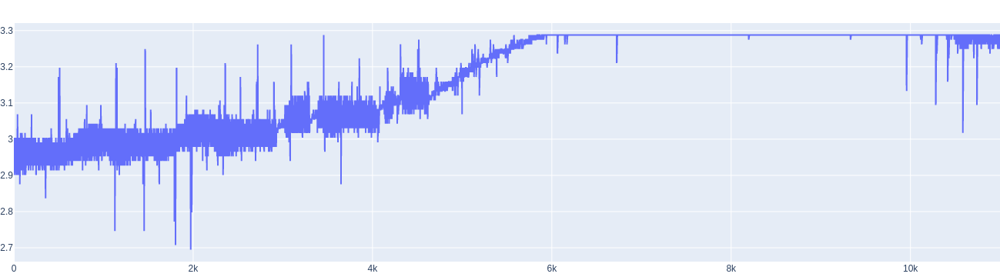

In [51]:
plotter(res)

In [34]:
res = np.array([1.7148, 1.70191, 1.67612, 1.65034, 1.67612, 1.65034, 1.68901, 1.68901, 1.65034, 1.68901, 1.70191, 1.67612, 1.70191, 1.70191, 1.66323, 1.68901, 1.70191, 1.67612, 1.68901, 1.72769, 1.72769, 1.80505, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.4755, 2.44972, 2.37236, 2.295, 2.25632, 2.20474, 2.12739, 2.07581, 2.03713, 1.93399, 1.88241, 1.85663, 1.81795, 1.79216, 1.75348, 1.7148, 1.68901, 1.67612, 1.63744, 1.68901, 1.66323, 1.63744, 1.70191, 1.68901, 1.65034, 1.70191, 1.68901, 1.65034, 1.67612, 1.67612, 1.66323, 1.70191, 1.68901, 1.68901, 1.74059, 1.80505, 1.86952, 1.94688, 1.98556, 2.03713, 2.08871, 1.99845, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.39814, 2.43682, 2.4755, 2.50129, 2.43682, 2.35946, 2.26921, 2.21764, 2.14028, 2.1016, 2.06292, 1.98556, 1.94688, 1.93399, 1.85663, 1.85663, 1.80505, 1.74059, 1.72769, 1.67612, 1.63744, 1.68901, 1.67612, 1.65034, 1.68901, 1.65034, 1.65034, 1.7148, 1.67612, 1.65034, 1.7148, 1.70191, 1.67612, 1.70191, 1.68901, 1.65034, 1.70191, 1.76637, 1.83084, 1.88241, 1.95977, 2.01135, 2.06292, 2.1016, 2.15317, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.42393, 2.44972, 2.4755, 2.43682, 2.37236, 2.32078, 2.25632, 2.17896, 2.16606, 2.08871, 2.05003, 2.03713, 1.95977, 1.89531, 1.86952, 1.83084, 1.77927, 1.7148, 1.66323, 1.62455, 1.66323, 1.63744, 1.66323, 1.70191, 1.65034, 1.65034, 1.7148, 1.68901, 1.59876, 1.7148, 1.67612, 1.67612, 1.7148, 1.66323, 1.66323, 1.7148, 1.72769, 1.79216, 1.85663, 1.89531, 1.97267, 2.02424, 2.06292, 2.12739, 2.16606, 2.20474, 2.25632, 2.30789, 2.34657, 2.39814, 2.42393, 2.46261, 2.4884, 2.43682, 2.38525, 2.295, 2.24342, 2.19185, 2.15317, 2.34657, 2.05003, 1.95977, 1.92109, 1.89531, 1.81795, 1.77927, 1.75348, 1.70191, 1.65034, 1.67612, 1.65034, 1.67612, 1.7148, 1.66323, 1.66323, 1.70191, 1.67612, 1.67612, 1.7148, 1.65034, 1.66323, 1.68901, 1.62455, 1.68901, 1.74059, 1.67612, 1.75348, 1.80505, 1.86952, 1.92109, 2.01135, 2.05003, 2.08871, 2.14028, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.39814, 2.43682, 2.4884, 2.50129, 2.42393, 2.34657, 2.295, 2.19185, 2.14028, 2.11449, 2.06292, 1.98556, 1.93399, 1.89531, 1.86952, 1.81795, 1.79216, 1.72769, 1.68901, 1.68901, 1.63744, 1.66323, 1.67612, 1.62455, 1.66323, 1.67612, 1.63744, 1.67612, 1.68901, 1.63744, 1.66323, 1.70191, 1.67612, 1.70191, 1.7148, 1.67612, 1.68901, 1.74059, 1.80505, 1.85663, 1.93399, 1.99845, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.46261, 2.4884, 2.43682, 2.33368, 2.295, 2.21764, 2.15317, 2.12739, 2.07581, 1.99845, 1.97267, 1.89531, 1.86952, 1.85663, 1.79216, 1.77927, 1.68901, 1.68901, 1.67612, 1.67612, 1.63744, 1.68901, 1.67612, 1.65034, 1.68901, 1.67612, 1.66323, 1.7148, 1.7148, 1.67612, 1.7148, 1.68901, 1.65034, 1.7148, 1.70191, 1.75348, 1.83084, 1.88241, 1.93399, 2.01135, 2.05003, 2.1016, 2.16606, 2.20474, 2.24342, 2.26921, 2.4755, 2.37236, 2.42393, 2.44972, 2.4755, 2.46261, 2.39814, 2.34657, 2.24342, 2.19185, 2.15317, 2.1016, 2.03713, 1.98556, 1.93399, 1.89531, 1.88241, 1.84373, 1.77927, 1.72769, 1.67612, 1.67612, 1.65034, 1.63744, 1.70191, 1.67612, 1.66323, 1.7148, 1.68901, 1.67612, 1.70191, 1.67612, 1.67612, 1.7148, 1.70191, 1.66323, 1.70191, 1.70191, 1.7148, 1.79216, 1.84373, 1.9082, 1.97267, 2.02424, 2.08871, 2.14028, 2.16606, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.44972, 2.38525, 2.32078, 2.26921, 2.20474, 2.14028, 2.1016, 2.01135, 1.98556, 1.92109, 1.86952, 1.81795, 1.80505, 1.75348, 1.68901, 1.70191, 1.65034, 1.66323, 1.70191, 1.65034, 1.65034, 1.70191, 1.67612, 1.67612, 1.70191, 1.66323, 1.65034, 1.68901, 1.68901, 1.68901, 1.72769, 1.68901, 1.68901, 1.74059, 1.79216, 1.86952, 1.92109, 1.98556, 2.05003, 2.08871, 2.12739, 2.17896, 2.23053, 2.26921, 2.30789, 2.295, 2.39814, 2.44972, 2.46261, 2.51418, 2.43682, 2.38525, 2.43682, 2.21764, 2.16606, 2.11449, 2.07581, 2.01135, 1.98556, 1.92109, 1.88241, 1.85663, 1.79216, 1.75348, 1.74059, 1.68901, 1.68901, 1.68901, 1.68901, 1.68901, 1.68901, 1.65034, 1.68901, 1.68901, 1.65034, 1.67612, 1.70191, 1.67612, 1.68901, 1.72769, 1.68901, 1.70191, 1.68901, 1.75348, 1.81795, 1.88241, 1.94688, 1.99845, 2.06292, 2.11449, 2.15317, 2.20474, 2.25632, 2.295, 2.33368, 2.37236, 2.42393, 2.44972, 2.4884, 2.50129, 2.41104, 2.37236, 2.26921, 2.19185, 2.17896, 2.1016, 2.05003, 2.01135, 1.95977, 1.9082, 1.88241, 1.84373, 1.77927, 1.74059, 1.72769, 1.66323, 1.67612, 1.63744, 1.68901, 1.68901, 1.65034, 1.67612, 1.70191, 1.65034, 1.7148, 1.70191, 1.67612, 1.68901, 1.70191, 1.65034, 1.70191, 1.7148, 1.70191, 1.76637, 1.81795, 1.89531, 1.95977, 2.01135, 2.06292, 2.1016, 2.16606, 2.20474, 2.25632, 2.295, 2.32078, 2.38525, 2.43682, 2.46261, 2.50129, 2.4884, 2.43682, 2.33368, 2.26921, 2.24342, 2.16606, 2.11449, 2.08871, 2.02424, 1.95977, 1.92109, 1.9082, 1.81795, 1.79216, 1.75348, 1.68901, 1.68901, 1.63744, 1.7148, 1.67612, 1.66323, 1.70191, 1.67612, 1.67612, 1.72769, 1.70191, 1.67612, 1.70191, 1.70191, 1.67612, 1.70191, 1.70191, 1.67612, 1.7148, 1.77927, 1.84373, 1.89531, 1.97267, 2.02424, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.295, 2.33368, 2.38525, 2.42393, 2.44972, 2.50129, 2.4755, 2.39814, 2.32078, 2.295, 2.21764, 2.17896, 2.14028, 2.05003, 1.98556, 1.97267, 1.9082, 1.85663, 1.83084, 1.75348, 1.75348, 1.70191, 1.67612, 1.68901, 1.59876, 1.67612, 1.70191, 1.66323, 1.66323, 1.70191, 1.70191, 1.68901, 1.68901, 1.70191, 1.67612, 1.74059, 1.68901, 1.67612, 1.72769, 1.72769, 1.79216, 1.85663, 1.9082, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.25632, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.51418, 2.46261, 2.39814, 2.34657, 2.25632, 2.20474, 2.15317, 2.07581, 2.02424, 1.98556, 1.92109, 1.89531, 1.86952, 1.80505, 1.75348, 1.74059, 1.70191, 1.70191, 1.63744, 1.66323, 1.68901, 1.63744, 1.67612, 1.68901, 1.65034, 1.66323, 1.7148, 1.67612, 1.68901, 1.72769, 1.68901, 1.70191, 1.7148, 1.68901, 1.74059, 1.79216, 1.85663, 1.92109, 1.99845, 2.03713, 2.08871, 2.12739, 2.17896, 2.23053, 2.26921, 2.32078, 2.39814, 2.41104, 2.44972, 2.4755, 2.50129, 2.42393, 2.39814, 2.295, 2.24342, 2.17896, 2.14028, 2.06292, 2.03713, 1.98556, 1.93399, 1.89531, 1.85663, 1.81795, 1.77927, 1.7148, 1.70191, 1.63744, 1.66323, 1.68901, 1.63744, 1.65034, 1.68901, 1.65034, 1.70191, 1.7148, 1.67612, 1.68901, 1.72769, 1.68901, 1.54719, 1.7148, 1.66323, 1.68901, 1.76637, 1.83084, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.16606, 2.23053, 2.2821, 2.32078, 2.37236, 2.42393, 2.44972, 2.4755, 2.4884, 2.39814, 2.33368, 2.295, 2.23053, 2.19185, 2.12739, 2.06292, 2.03713, 1.98556, 1.93399, 1.86952, 1.80505, 1.76637, 1.74059, 1.7148, 1.67612, 1.67612, 1.67612, 1.63744, 1.7148, 1.70191, 1.61166, 1.70191, 1.70191, 1.65034, 1.70191, 1.7148, 1.67612, 1.70191, 1.70191, 1.67612, 1.70191, 1.70191, 1.79216, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.46261, 2.37236, 2.30789, 2.26921, 2.17896, 2.14028, 2.11449, 2.03713, 1.97267, 1.93399, 1.89531, 1.85663, 1.80505, 1.79216, 1.72769, 1.7148, 1.68901, 1.66323, 1.65034, 1.68901, 1.70191, 1.67612, 1.70191, 1.66323, 1.66323, 1.70191, 1.70191, 1.65034, 1.70191, 1.68901, 1.67612, 1.72769, 1.72769, 1.75348, 1.80505, 1.85663, 1.92109, 1.93399, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.32078, 2.37236, 2.39814, 2.43682, 2.46261, 2.51418, 2.44972, 2.34657, 2.30789, 2.23053, 2.20474, 2.12739, 2.07581, 2.03713, 1.98556, 1.95977, 1.88241, 1.84373, 1.79216, 1.74059, 1.72769, 1.70191, 1.66323, 1.66323, 1.63744, 1.63744, 1.65034, 1.68901, 1.66323, 1.67612, 1.7148, 1.67612, 1.67612, 1.7148, 1.7148, 1.68901, 1.72769, 1.70191, 1.67612, 1.75348, 1.81795, 1.88241, 1.93399, 2.01135, 2.05003, 2.1016, 2.15317, 2.20474, 2.24342, 2.2821, 2.32078, 2.38525, 2.42393, 2.46261, 2.4755, 2.4884, 2.42393, 2.34657, 2.26921, 2.21764, 2.17896, 2.12739, 2.06292, 2.01135, 1.98556, 1.93399, 1.86952, 1.83084, 1.75348, 1.72769, 1.72769, 1.68901, 1.65034, 1.67612, 1.66323, 1.68901, 1.70191, 1.66323, 1.70191, 1.7148, 1.68901, 1.70191, 1.7148, 1.66323, 1.68901, 1.7148, 1.67612, 1.68901, 1.7148, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.06292, 2.11449, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.41104, 2.43682, 2.46261, 2.50129, 2.46261, 2.43682, 2.37236, 2.295, 2.25632, 2.19185, 2.11449, 2.08871, 2.02424, 1.99845, 1.9082, 1.88241, 1.84373, 1.79216, 1.75348, 1.7148, 1.68901, 1.67612, 1.65034, 1.68901, 1.70191, 1.67612, 1.70191, 1.72769, 1.67612, 1.66323, 1.70191, 1.66323, 1.70191, 1.7148, 1.67612, 1.67612, 1.70191, 1.72769, 1.77927, 1.85663, 1.9082, 1.95977, 2.02424, 2.07581, 2.12739, 2.16606, 2.23053, 2.25632, 2.30789, 2.34657, 2.38525, 2.43682, 2.46261, 2.50129, 2.4755, 2.37236, 2.295, 2.03713, 2.23053, 2.14028, 2.08871, 2.02424, 1.97267, 1.93399, 1.9082, 1.85663, 1.79216, 1.75348, 1.75348, 1.67612, 1.65034, 1.63744, 1.70191, 1.68901, 1.66323, 1.68901, 1.68901, 1.65034, 1.68901, 1.68901, 1.66323, 1.72769, 1.68901, 1.67612, 1.72769, 1.7148, 1.68901, 1.74059, 1.80505, 1.86952, 1.92109, 1.99845, 2.03713, 2.1016, 2.14028, 2.20474, 2.23053, 2.2821, 2.30789, 2.37236, 2.39814, 2.44972, 2.4884, 2.51418, 2.4755, 2.39814, 2.30789, 2.26921, 2.20474, 2.14028, 2.1016, 1.95977, 1.99845, 1.95977, 1.9082, 1.84373, 1.79216, 1.74059, 1.74059, 1.7148, 1.66323, 1.70191, 1.65034, 1.65034, 1.70191, 1.70191, 1.67612, 1.7148, 1.67612, 1.67612, 1.72769, 1.72769, 1.68901, 1.7148, 1.70191, 1.67612, 1.72769, 1.70191, 1.72769, 1.79216, 1.85663, 1.95977, 1.97267, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.41104, 2.43682, 2.4755, 2.50129, 2.51418, 2.43682, 2.37236, 2.295, 2.24342, 2.16606, 2.12739, 2.1016, 2.05003, 1.98556, 1.93399, 1.88241, 1.83084, 1.77927, 1.74059, 1.7148, 1.68901, 1.65034, 1.68901, 1.66323, 1.67612, 1.67612, 1.66323, 1.66323, 1.70191, 1.70191, 1.65034, 1.7148, 1.67612, 1.67612, 1.7148, 1.68901, 1.68901, 1.72769, 1.75348, 1.81795, 1.85663, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.26921, 2.33368, 2.37236, 2.41104, 2.44972, 2.4755, 2.4884, 2.46261, 2.38525, 2.2821, 2.25632, 2.11449, 2.11449, 2.06292, 2.02424, 1.97267, 1.89531, 1.89531, 1.83084, 1.80505, 1.79216, 1.7148, 1.67612, 1.68901, 1.66323, 1.66323, 1.68901, 1.65034, 1.68901, 1.70191, 1.66323, 1.66323, 1.7148, 1.66323, 1.67612, 1.72769, 1.70191, 1.72769, 1.72769, 1.68901, 1.74059, 1.81795, 1.86952, 1.93399, 1.99845, 2.05003, 2.08871, 2.15317, 2.19185, 2.23053, 2.2821, 2.32078, 2.37236, 2.33368, 2.44972, 2.4755, 2.4884, 2.44972, 2.38525, 2.2821, 2.23053, 2.16606, 2.1016, 2.08871, 2.02424, 1.97267, 1.92109, 1.88241, 1.84373, 1.72769, 1.76637, 1.70191, 1.67612, 1.63744, 1.66323, 1.67612, 1.65034, 1.66323, 1.67612, 1.66323, 1.67612, 1.72769, 1.67612, 1.7148, 1.7148, 1.68901, 1.7148, 1.70191, 1.67612, 1.7148, 1.76637, 1.83084, 1.88241, 1.93399, 1.99845, 2.05003, 2.11449, 2.15317, 2.20474, 2.24342, 2.2821, 2.33368, 2.37236, 2.42393, 2.46261, 2.4884, 2.50129, 2.42393, 2.33368, 2.2821, 2.20474, 2.15317, 2.14028, 2.08871, 2.02424, 1.97267, 1.92109, 1.85663, 1.84373, 1.79216, 1.72769, 1.7148, 1.67612, 1.67612, 1.65034, 1.63744, 1.66323, 1.67612, 1.67612, 1.70191, 1.67612, 1.63744, 1.70191, 1.70191, 1.67612, 1.7148, 1.68901, 1.67612, 1.72769, 1.7148, 1.76637, 1.83084, 1.89531, 1.95977, 2.02424, 2.06292, 2.11449, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.38525, 2.41104, 2.46261, 2.50129, 2.46261, 2.43682, 2.32078, 2.2821, 2.20474, 2.15317, 2.11449, 2.06292, 1.99845, 1.92109, 1.89531, 1.84373, 1.80505, 1.77927, 1.72769, 1.67612, 1.68901, 1.67612, 1.66323, 1.70191, 1.67612, 1.63744, 1.7148, 1.68901, 1.65034, 1.7148, 1.68901, 1.67612, 1.70191, 1.67612, 1.66323, 1.7148, 1.7148, 1.72769, 1.80505, 1.74059, 1.9082, 1.98556, 2.02424, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.32078, 2.34657, 2.39814, 2.44972, 2.4755, 2.50129, 2.44972, 2.37236, 2.32078, 2.24342, 2.17896, 2.15317, 2.1016, 2.03713, 1.99845, 1.95977, 1.88241, 1.85663, 1.84373, 1.76637, 1.74059, 1.70191, 1.67612, 1.67612, 1.7148, 1.65034, 1.66323, 1.7148, 1.66323, 1.67612, 1.75348, 1.67612, 1.67612, 1.7148, 1.66323, 1.70191, 1.7148, 1.70191, 1.70191, 1.75348, 1.80505, 1.85663, 1.92109, 1.98556, 2.05003, 2.08871, 2.14028, 2.19185, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.43682, 2.4755, 2.52708, 2.44972, 2.34657, 2.30789, 2.23053, 2.15317, 2.12739, 2.06292, 2.01135, 1.97267, 1.93399, 1.88241, 1.84373, 1.81795, 1.75348, 1.70191, 1.67612, 1.66323, 1.67612, 1.65034, 1.66323, 1.68901, 1.65034, 1.66323, 1.70191, 1.67612, 1.7148, 1.7148, 1.63744, 1.70191, 1.72769, 1.68901, 1.66323, 1.7148, 1.74059, 1.80505, 1.86952, 1.93399, 1.99845, 2.05003, 2.08871, 2.14028, 2.20474, 2.23053, 2.2821, 2.32078, 2.37236, 2.42393, 2.43682, 2.4755, 2.50129, 2.4755, 2.37236, 2.2821, 2.26921, 2.20474, 2.12739, 2.1016, 2.03713, 1.95977, 1.92109, 1.86952, 1.80505, 1.77927, 1.74059, 1.7148, 1.67612, 1.65034, 1.63744, 1.67612, 1.68901, 1.66323, 1.7148, 1.7148, 1.65034, 1.70191, 1.7148, 1.66323, 1.7148, 1.7148, 1.67612, 1.68901, 1.74059, 1.70191, 1.76637, 1.83084, 1.89531, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.39814, 2.44972, 2.50129, 2.51418, 2.43682, 2.34657, 2.30789, 2.25632, 2.17896, 2.11449, 2.05003, 1.98556, 1.95977, 1.89531, 1.86952, 1.81795, 1.79216, 1.74059, 1.74059, 1.68901, 1.63744, 1.70191, 1.67612, 1.66323, 1.7148, 1.68901, 1.65034, 1.7148, 1.68901, 1.66323, 1.70191, 1.48272, 1.66323, 1.70191, 1.70191, 1.67612, 1.72769, 1.79216, 1.84373, 1.92109, 1.98556, 2.02424, 2.07581, 2.14028, 2.16606, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.4755, 2.39814, 2.30789, 2.24342, 2.17896, 2.14028, 2.11449, 2.02424, 1.98556, 1.93399, 1.88241, 1.88241, 1.81795, 1.75348, 1.7148, 1.7148, 1.65034, 1.70191, 1.67612, 1.65034, 1.68901, 1.65034, 1.66323, 1.70191, 1.67612, 1.67612, 1.7148, 1.70191, 1.67612, 1.72769, 1.70191, 1.68901, 1.7148, 1.7148, 1.67612, 1.7148, 1.68901, 1.67612, 1.7148, 1.72769, 1.68901, 1.70191, 1.7148, 1.62455, 1.74059, 1.74059, 1.66323, 1.72769, 1.7148, 1.68901, 1.74059, 1.72769, 1.68901, 1.7148, 1.74059, 1.70191, 1.74059, 1.75348, 1.70191, 1.74059, 1.74059, 1.7148, 1.74059, 1.75348, 1.70191, 1.7148, 1.74059, 1.80505, 1.86952, 1.92109, 1.99845, 2.03713, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.32078, 2.34657, 2.39814, 2.41104, 2.46261, 2.51418, 2.55286, 2.4755, 2.42393, 2.33368, 2.26921, 2.24342, 2.16606, 2.14028, 2.05003, 1.99845, 1.98556, 1.92109, 1.84373, 1.80505, 1.77927, 1.75348, 1.7148, 1.68901, 1.63744, 1.68901, 1.70191, 1.66323, 1.68901, 1.68901, 1.65034, 1.7148, 1.70191, 1.67612, 1.68901, 1.68901, 1.67612, 1.68901, 1.72769, 1.67612, 1.70191, 1.76637, 1.81795, 1.89531, 1.95977, 1.99845, 2.05003, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.41104, 2.46261, 2.4884, 2.51418, 2.4755, 2.41104, 2.30789, 2.26921, 2.20474, 2.16606, 2.08871, 2.03713, 2.01135, 1.93399, 1.88241, 1.84373, 1.80505, 1.76637, 1.72769, 1.70191, 1.68901, 1.66323, 1.62455, 1.70191, 1.68901, 1.65034, 1.68901, 1.66323, 1.65034, 1.7148, 1.70191, 1.67612, 1.7148, 1.70191, 1.67612, 1.7148, 1.70191, 1.7148, 1.76637, 1.83084, 1.89531, 1.95977, 2.01135, 2.06292, 2.11449, 2.16606, 2.20474, 2.24342, 2.30789, 2.33368, 2.34657, 2.42393, 2.46261, 2.50129, 2.52708, 2.56575, 2.4755, 2.42393, 2.37236, 2.26921, 2.20474, 2.16606, 2.12739, 2.1016, 2.01135, 1.98556, 1.92109, 1.88241, 1.83084, 1.80505, 1.72769, 1.68901, 1.67612, 1.67612, 1.66323, 1.7148, 1.68901, 1.68901, 1.7148, 1.66323, 1.68901, 1.72769, 1.68901, 1.68901, 1.70191, 1.70191, 1.66323, 1.72769, 1.70191, 1.67612, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.17896, 2.15317, 2.19185, 2.24342, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.51418, 2.46261, 2.41104, 2.30789, 2.26921, 2.19185, 2.16606, 2.11449, 2.05003, 1.99845, 1.9082, 1.86952, 1.84373, 1.80505, 1.74059, 1.74059, 1.68901, 1.66323, 1.70191, 1.65034, 1.63744, 1.68901, 1.66323, 1.68901, 1.70191, 1.62455, 1.67612, 1.70191, 1.67612, 1.66323, 1.72769, 1.68901, 1.68901, 1.72769, 1.70191, 1.72769, 1.79216, 1.84373, 1.9082, 1.95977, 2.02424, 2.07581, 2.11449, 2.16606, 2.20474, 2.25632, 2.30789, 2.33368, 2.39814, 2.42393, 2.46261, 2.50129, 2.52708, 2.4755, 2.42393, 2.34657, 2.2821, 2.21764, 2.17896, 2.12739, 2.07581, 2.03713, 1.97267, 1.92109, 1.85663, 1.85663, 1.79216, 1.74059, 1.72769, 1.67612, 1.68901, 1.63744, 1.66323, 1.68901, 1.66323, 1.68901, 1.7148, 1.65034, 1.68901, 1.70191, 1.67612, 1.70191, 1.72769, 1.65034, 1.68901, 1.72769, 1.67612, 1.72769, 1.79216, 1.85663, 1.9082, 1.98556, 2.02424, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.38525, 2.44972, 2.46261, 2.50129, 2.50129, 2.42393, 2.37236, 2.295, 2.23053, 2.20474, 2.14028, 2.08871, 2.03713, 1.95977, 1.93399, 1.86952, 1.84373, 1.80505, 1.74059, 1.70191, 1.68901, 1.66323, 1.65034, 1.63744, 1.68901, 1.68901, 1.66323, 1.68901, 1.70191, 1.63744, 1.67612, 1.70191, 1.65034, 1.70191, 1.68901, 1.66323, 1.68901, 1.7148, 1.72769, 1.79216, 1.89531, 1.9082, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.39814, 2.42393, 2.46261, 2.51418, 2.4755, 2.43682, 2.34657, 2.26921, 2.24342, 2.17896, 2.12739, 2.07581, 1.97267, 1.95977, 1.9082, 1.85663, 1.83084, 1.79216, 1.74059, 1.74059, 1.70191, 1.65034, 1.67612, 1.66323, 1.63744, 1.70191, 1.67612, 1.63744, 1.70191, 1.68901, 1.65034, 1.70191, 1.68901, 1.66323, 1.7148, 1.7148, 1.67612, 1.70191, 1.74059, 1.79216, 1.86952, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.30789, 2.35946, 2.39814, 2.43682, 2.4755, 2.51418, 2.4755, 2.39814, 2.32078, 2.2821, 2.20474, 2.14028, 2.11449, 2.06292, 2.01135, 1.97267, 1.93399, 1.84373, 1.81795, 1.76637, 1.75348, 1.72769, 1.65034, 1.65034, 1.65034, 1.67612, 1.63744, 1.63744, 1.76637, 1.66323, 1.65034, 1.7148, 1.68901, 1.66323, 1.70191, 1.7148, 1.65034, 1.7148, 1.70191, 1.66323, 1.72769, 1.77927, 1.85663, 1.9082, 1.97267, 2.02424, 2.07581, 2.12739, 2.17896, 2.21764, 2.25632, 2.30789, 2.33368, 2.39814, 2.43682, 2.46261, 2.51418, 2.4755, 2.38525, 2.37236, 2.2821, 2.24342, 2.16606, 2.1016, 2.07581, 2.02424, 1.76637, 1.9082, 1.85663, 1.81795, 1.79216, 1.74059, 1.7148, 1.63744, 1.70191, 1.63744, 1.65034, 1.68901, 1.65034, 1.67612, 1.7148, 1.67612, 1.66323, 1.7148, 1.65034, 1.58587, 1.7148, 1.70191, 1.68901, 1.74059, 1.67612, 1.74059, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.21764, 2.26921, 2.32078, 2.37236, 2.42393, 2.43682, 2.46261, 2.51418, 2.4884, 2.42393, 2.34657, 2.2821, 2.23053, 2.15317, 2.11449, 2.07581, 1.98556, 1.94688, 1.89531, 1.83084, 1.80505, 1.77927, 1.72769, 1.68901, 1.65034, 1.67612, 1.70191, 1.62455, 1.66323, 1.70191, 1.65034, 1.70191, 1.70191, 1.65034, 1.66323, 1.70191, 1.67612, 1.68901, 1.72769, 1.67612, 1.70191, 1.7148, 1.72769, 1.76637, 1.84373, 1.9082, 1.97267, 2.03713, 2.07581, 2.14028, 2.12739, 2.21764, 2.26921, 2.32078, 2.34657, 2.38525, 2.43682, 2.46261, 2.51418, 2.4884, 2.42393, 2.33368, 2.26921, 2.23053, 2.17896, 2.14028, 2.07581, 2.01135, 2.01135, 1.95977, 1.86952, 1.85663, 1.77927, 1.74059, 1.7148, 1.68901, 1.62455, 1.66323, 1.67612, 1.63744, 1.65034, 1.66323, 1.63744, 1.68901, 1.70191, 1.66323, 1.67612, 1.68901, 1.65034, 1.68901, 1.70191, 1.67612, 1.7148, 1.7148, 1.79216, 1.84373, 1.9082, 1.95977, 2.01135, 2.06292, 2.12739, 2.17896, 2.21764, 2.25632, 2.15317, 2.33368, 2.39814, 2.43682, 2.44972, 2.50129, 2.46261, 2.42393, 2.35946, 2.295, 2.26921, 2.19185, 2.11449, 2.06292, 2.03713, 1.98556, 1.9082, 1.88241, 1.80505, 1.77927, 1.76637, 1.7148, 1.66323, 1.66323, 1.65034, 1.68901, 1.68901, 1.66323, 1.70191, 1.68901, 1.65034, 1.68901, 1.68901, 1.66323, 1.70191, 1.72769, 1.66323, 1.68901, 1.70191, 1.67612, 1.72769, 1.79216, 1.85663, 1.9082, 1.97267, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.295, 2.35946, 2.39814, 2.43682, 2.4755, 2.50129, 2.4884, 2.43682, 2.34657, 2.26921, 2.23053, 2.16606, 2.11449, 2.06292, 2.02424, 1.98556, 1.92109, 1.9082, 1.84373, 1.80505, 1.76637, 1.70191, 1.66323, 1.68901, 1.67612, 1.65034, 1.70191, 1.67612, 1.66323, 1.66323, 1.66323, 1.65034, 1.72769, 1.72769, 1.66323, 1.7148, 1.67612, 1.68901, 1.7148, 1.7148, 1.72769, 1.79216, 1.84373, 1.9082, 1.97267, 2.03713, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.43682, 2.42393, 2.4755, 2.50129, 2.50129, 2.44972, 2.32078, 2.2821, 2.21764, 2.15317, 2.14028, 2.15317, 2.03713, 1.95977, 1.93399, 1.86952, 1.83084, 1.80505, 1.72769, 1.68901, 1.68901, 1.65034, 1.67612, 1.62455, 1.63744, 1.70191, 1.65034, 1.67612, 1.70191, 1.66323, 1.65034, 1.7148, 1.70191, 1.67612, 1.80505, 1.67612, 1.67612, 1.7148, 1.72769, 1.77927, 1.84373, 1.9082, 1.98556, 2.03713, 2.08871, 2.12739, 2.19185, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.43682, 2.46261, 2.50129, 2.52708, 2.44972, 2.38525, 2.30789, 2.24342, 2.19185, 2.16606, 2.07581, 2.03713, 1.98556, 1.94688, 1.92109, 1.84373, 1.81795, 1.77927, 1.74059, 1.7148, 1.63744, 1.66323, 1.68901, 1.67612, 1.68901, 1.7148, 1.67612, 1.70191, 1.7148, 1.66323, 1.66323, 1.7148, 1.68901, 1.68901, 1.72769, 1.66323, 1.67612, 1.7148, 1.79216, 1.84373, 1.9082, 1.95977, 2.02424, 2.06292, 2.12739, 2.17896, 2.21764, 2.25632, 2.30789, 2.33368, 2.39814, 2.42393, 2.46261, 2.50129, 2.51418, 2.44972, 2.38525, 2.33368, 2.24342, 2.19185, 2.16606, 2.1016, 2.05003, 2.01135, 1.95977, 1.88241, 1.83084, 1.83084, 1.75348, 1.72769, 1.7148, 1.63744, 1.62455, 1.66323, 1.67612, 1.63744, 1.65034, 1.68901, 1.63744, 1.66323, 1.67612, 1.66323, 1.68901, 1.7148, 1.67612, 1.68901, 1.7148, 1.68901, 1.70191, 1.74059, 1.79216, 1.85663, 1.9082, 1.97267, 2.03713, 2.07581, 2.14028, 2.19185, 2.23053, 2.26921, 2.30789, 2.35946, 2.39814, 2.43682, 2.46261, 2.52708, 2.46261, 2.39814, 2.34657, 2.25632, 2.19185, 2.16606, 2.11449, 2.08871, 2.02424, 1.95977, 1.94688, 1.85663, 1.84373, 1.76637, 1.74059, 1.67612, 1.63744, 1.63744, 1.63744, 1.70191, 1.67612, 1.65034, 1.67612, 1.70191, 1.65034, 1.68901, 1.70191, 1.65034, 1.68901, 1.70191, 1.67612, 1.70191, 1.68901, 1.67612, 1.75348, 1.81795, 1.86952, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.51418, 2.4755, 2.41104, 2.30789, 2.24342, 2.20474, 2.14028, 2.07581, 2.06292, 1.99845, 1.92109, 1.89531, 1.84373, 1.81795, 1.75348, 1.74059, 1.67612, 1.65034, 1.68901, 1.65034, 1.65034, 1.70191, 1.68901, 1.66323, 1.68901, 1.65034, 1.65034, 1.68901, 1.67612, 1.65034, 1.74059, 1.7148, 1.67612, 1.7148, 1.7148, 1.76637, 1.83084, 1.88241, 1.94688, 2.02424, 2.06292, 2.1016, 2.15317, 2.19185, 2.24342, 2.295, 2.33368, 2.38525, 2.39814, 2.44972, 2.4884, 2.51418, 2.46261, 2.39814, 2.32078, 2.26921, 2.23053, 2.15317, 2.08871, 2.06292, 2.01135, 1.98556, 1.89531, 1.86952, 1.79216, 1.79216, 1.74059, 1.68901, 1.65034, 1.65034, 1.67612, 1.65034, 1.66323, 1.68901, 1.66323, 1.83084, 1.70191, 1.66323, 1.66323, 1.70191, 1.7148, 1.68901, 1.72769, 1.70191, 1.66323, 1.70191, 1.74059, 1.80505, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.25632, 2.23053, 2.2821, 2.32078, 2.34657, 2.39814, 2.42393, 2.4755, 2.51418, 2.46261, 2.42393, 2.33368, 2.2821, 2.24342, 2.16606, 2.1016, 2.07581, 2.03713, 1.98556, 1.93399, 1.84373, 1.80505, 1.79216, 1.75348, 1.70191, 1.66323, 1.63744, 1.63744, 1.70191, 1.66323, 1.68901, 1.70191, 1.66323, 1.67612, 1.7148, 1.67612, 1.66323, 1.70191, 1.67612, 1.67612, 1.7148, 1.67612, 1.66323, 1.75348, 1.80505, 1.86952, 1.9082, 1.98556, 2.03713, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.30789, 2.37236, 2.39814, 2.44972, 2.41104, 2.51418, 2.4755, 2.43682, 2.37236, 2.25632, 2.23053, 2.17896, 2.1016, 2.05003, 2.01135, 1.94688, 1.88241, 1.86952, 1.81795, 1.76637, 1.76637, 1.70191, 1.66323, 1.68901, 1.65034, 1.67612, 1.70191, 1.66323, 1.66323, 1.68901, 1.65034, 1.68901, 1.70191, 1.65034, 1.67612, 1.72769, 1.67612, 1.68901, 1.72769, 1.68901, 1.75348, 1.81795, 1.88241, 1.93399, 1.98556, 2.05003, 2.1016, 2.15317, 2.19185, 2.23053, 2.2821, 2.33368, 2.35946, 2.42393, 2.44972, 2.4884, 2.51418, 2.4884, 2.42393, 2.32078, 2.26921, 2.20474, 2.15317, 2.1016, 2.06292, 2.06292, 1.95977, 1.92109, 1.84373, 1.80505, 1.75348, 1.72769, 1.68901, 1.68901, 1.68901, 1.67612, 1.65034, 1.68901, 1.67612, 1.65034, 1.67612, 1.68901, 1.66323, 1.72769, 1.7148, 1.66323, 1.7148, 1.7148, 1.67612, 1.70191, 1.7148, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.11449, 2.1016, 2.15317, 2.19185, 2.24342, 2.295, 2.32078, 2.38525, 2.41104, 2.46261, 2.4755, 2.50129, 2.44972, 2.38525, 2.295, 2.26921, 2.20474, 2.15317, 2.08871, 2.03713, 1.95977, 1.97267, 1.89531, 1.83084, 1.79216, 1.75348, 1.72769, 1.67612, 1.66323, 1.65034, 1.68901, 1.66323, 1.65034, 1.70191, 1.70191, 1.67612, 1.68901, 1.68901, 1.66323, 1.7148, 1.68901, 1.66323, 1.68901, 1.68901, 1.66323, 1.70191, 1.79216, 1.81795, 1.89531, 1.95977, 2.02424, 2.07581, 2.11449, 2.15317, 2.20474, 2.25632, 2.295, 2.32078, 2.38525, 2.42393, 2.46261, 2.4884, 2.50129, 2.43682, 2.37236, 2.32078, 2.25632, 2.17896, 2.15317, 2.08871, 2.03713, 1.98556, 1.89531, 1.88241, 1.83084, 1.79216, 1.79216, 1.74059, 1.70191, 1.68901, 1.65034, 1.65034, 1.70191, 1.67612, 1.68901, 1.70191, 1.66323, 1.66323, 1.70191, 1.67612, 1.67612, 1.70191, 1.67612, 1.67612, 1.70191, 1.72769, 1.7148, 1.77927, 1.83084, 1.9082, 1.95977, 2.01135, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.295, 2.34657, 2.38525, 2.43682, 2.46261, 2.4884, 2.51418, 2.46261, 2.42393, 2.32078, 2.26921, 2.17896, 2.14028, 2.08871, 2.05003, 2.11449, 1.93399, 1.89531, 1.84373, 1.83084, 1.79216, 1.72769, 1.68901, 1.66323, 1.68901, 1.65034, 1.65034, 1.7148, 1.65034, 1.66323, 1.7148, 1.59876, 1.67612, 1.7148, 1.70191, 1.68901, 1.72769, 1.66323, 1.68901, 1.7148, 1.67612, 1.67612, 1.72769, 1.70191, 1.68901, 1.72769, 1.7148, 1.68901, 1.72769, 1.74059, 1.70191, 1.72769, 1.7148, 1.68901, 1.75348, 1.72769, 1.70191, 1.7148, 1.70191, 1.70191, 1.74059, 1.72769, 1.70191, 1.74059, 1.7148, 1.7148, 1.74059, 1.74059, 1.70191, 1.7148, 1.72769, 1.70191, 1.74059, 1.76637, 1.70191, 1.72769, 1.75348, 1.68901, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.14028, 2.17896, 2.20474, 2.26921, 2.30789, 2.33368, 2.39814, 2.43682, 2.46261, 2.50129, 2.52708, 2.4884, 2.41104, 2.33368, 2.295, 2.19185, 2.15317, 2.11449, 2.06292, 2.01135, 1.97267, 1.89531, 1.85663, 1.83084, 1.79216, 1.76637, 1.70191, 1.63744, 1.70191, 1.70191, 1.66323, 1.7148, 1.68901, 1.66323, 1.70191, 1.72769, 1.66323, 1.70191, 1.68901, 1.68901, 1.72769, 1.72769, 1.66323, 1.7148, 1.75348, 1.80505, 1.86952, 1.92109, 1.99845, 2.03713, 2.05003, 2.14028, 2.19185, 2.23053, 2.2821, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.52708, 2.39814, 2.38525, 2.30789, 2.24342, 2.19185, 2.12739, 2.08871, 2.05003, 1.95977, 1.95977, 1.85663, 1.81795, 1.80505, 1.74059, 1.72769, 1.67612, 1.68901, 1.65034, 1.65034, 1.7148, 1.67612, 1.67612, 1.70191, 1.65034, 1.65034, 1.7148, 1.68901, 1.68901, 1.72769, 1.70191, 1.66323, 1.74059, 1.7148, 1.76637, 1.83084, 1.89531, 1.95977, 2.01135, 2.07581, 2.11449, 2.16606, 2.20474, 2.24342, 2.30789, 2.34657, 2.39814, 2.42393, 2.44972, 2.4884, 2.52708, 2.4884, 2.41104, 2.34657, 2.26921, 2.21764, 2.16606, 2.1016, 2.08871, 2.01135, 1.94688, 1.92109, 1.85663, 1.83084, 1.79216, 1.7148, 1.68901, 1.65034, 1.68901, 1.7148, 1.66323, 1.66323, 1.7148, 1.70191, 1.7148, 1.72769, 1.67612, 1.67612, 1.56008, 1.70191, 1.70191, 1.74059, 1.7148, 1.70191, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.11449, 2.15317, 2.20474, 2.24342, 2.32078, 2.33368, 2.37236, 2.42393, 2.46261, 2.4884, 2.4884, 2.43682, 2.38525, 2.2821, 2.20474, 2.17896, 2.1016, 2.07581, 2.01135, 1.98556, 1.92109, 1.84373, 1.84373, 1.77927, 1.74059, 1.70191, 1.67612, 1.65034, 1.70191, 1.68901, 1.68901, 1.7148, 1.66323, 1.68901, 1.7148, 1.66323, 1.67612, 1.7148, 1.67612, 1.70191, 1.72769, 1.68901, 1.68901, 1.72769, 1.77927, 1.84373, 1.9082, 1.97267, 2.03713, 2.07581, 2.14028, 2.16606, 2.21764, 2.26921, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.4755, 2.39814, 2.32078, 2.23053, 2.17896, 2.14028, 2.08871, 2.03713, 1.99845, 1.92109, 1.88241, 1.84373, 1.81795, 1.80505, 1.7148, 1.67612, 1.68901, 1.68901, 1.65034, 1.66323, 1.66323, 1.65034, 1.68901, 1.68901, 1.65034, 1.67612, 1.70191, 1.67612, 1.7148, 1.72769, 1.65034, 1.70191, 1.7148, 1.74059, 1.81795, 1.86952, 1.92109, 1.98556, 2.05003, 2.08871, 2.15317, 2.17896, 2.21764, 2.2821, 2.32078, 2.37236, 2.39814, 2.44972, 2.4755, 2.4884, 2.43682, 2.34657, 2.26921, 2.21764, 2.17896, 2.11449, 2.1016, 2.03713, 1.97267, 1.95977, 1.88241, 1.84373, 1.77927, 1.74059, 1.68901, 1.67612, 1.66323, 1.65034, 1.68901, 1.67612, 1.66323, 1.7148, 1.68901, 1.67612, 1.7148, 1.7148, 1.67612, 1.72769, 1.68901, 1.67612, 1.70191, 1.7148, 1.72769, 1.77927, 1.84373, 1.89531, 1.97267, 2.02424, 2.06292, 2.12739, 2.16606, 2.21764, 2.25632, 2.295, 2.33368, 2.38525, 2.43682, 2.46261, 2.4884, 2.44972, 2.39814, 2.33368, 2.25632, 2.17896, 2.15317, 2.07581, 2.02424, 2.01135, 1.93399, 1.86952, 1.85663, 1.80505, 1.88241, 1.74059, 1.67612, 1.65034, 1.65034, 1.7148, 1.68901, 1.70191, 1.7148, 1.67612, 1.67612, 1.7148, 1.70191, 1.67612, 1.7148, 1.68901, 1.65034, 1.7148, 1.67612, 1.66323, 1.74059, 1.81795, 1.86952, 1.92109, 1.98556, 2.05003, 2.1016, 2.15317, 2.19185, 2.23053, 2.2821, 2.32078, 2.38525, 2.41104, 2.44972, 2.50129, 2.51418, 2.43682, 2.38525, 2.30789, 2.20474, 2.17896, 2.1016, 2.05003, 1.99845, 1.97267, 1.9082, 1.84373, 1.83084, 1.77927, 1.74059, 1.74059, 1.67612, 1.67612, 1.70191, 1.66323, 1.67612, 1.70191, 1.66323, 1.67612, 1.70191, 1.66323, 1.66323, 1.70191, 1.67612, 1.72769, 1.72769, 1.68901, 1.72769, 1.72769, 1.77927, 1.84373, 1.89531, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.20474, 2.25632, 2.30789, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.43682, 2.38525, 2.33368, 2.24342, 2.17896, 2.14028, 2.08871, 2.05003, 1.99845, 1.93399, 1.98556, 1.85663, 1.83084, 1.79216, 1.74059, 1.67612, 1.67612, 1.67612, 1.63744, 1.70191, 1.68901, 1.66323, 1.68901, 1.70191, 1.66323, 1.68901, 1.7148, 1.67612, 1.72769, 1.72769, 1.66323, 1.68901, 1.7148, 1.74059, 1.81795, 1.86952, 1.93399, 2.01135, 2.05003, 2.1016, 2.14028, 2.17896, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.4755, 2.42393, 2.37236, 2.295, 2.20474, 2.16606, 2.1016, 2.05003, 2.01135, 1.98556, 1.9082, 1.86952, 1.84373, 1.76637, 1.75348, 1.72769, 1.67612, 1.66323, 1.65034, 1.68901, 1.67612, 1.65034, 1.68901, 1.70191, 1.67612, 1.7148, 1.72769, 1.68901, 1.70191, 1.70191, 1.66323, 1.7148, 1.7148, 1.7148, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.295, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.44972, 2.39814, 2.32078, 2.25632, 2.19185, 2.15317, 2.08871, 2.06292, 2.02424, 1.93399, 1.9082, 1.84373, 1.80505, 1.77927, 1.72769, 1.68901, 1.66323, 1.67612, 1.70191, 1.66323, 1.66323, 1.7148, 1.68901, 1.67612, 1.7148, 1.66323, 1.66323, 1.70191, 1.70191, 1.66323, 1.72769, 1.70191, 1.67612, 1.75348, 1.80505, 1.86952, 1.92109, 1.99845, 2.05003, 2.1016, 2.14028, 2.19185, 2.24342, 2.295, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.51418, 2.41104, 2.37236, 2.295, 2.20474, 2.16606, 2.1016, 2.05003, 2.01135, 1.95977, 1.9082, 1.84373, 1.84373, 1.79216, 1.75348, 1.74059, 1.68901, 1.67612, 1.70191, 1.62455, 1.67612, 1.70191, 1.66323, 1.65034, 1.68901, 1.68901, 1.68901, 1.74059, 1.68901, 1.68901, 1.74059, 1.70191, 1.68901, 1.72769, 1.79216, 1.84373, 1.9082, 1.97267, 2.03713, 2.06292, 2.11449, 2.16606, 2.23053, 2.25632, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.38525, 2.32078, 2.26921, 2.16606, 2.14028, 2.08871, 2.05003, 2.01135, 1.93399, 1.85663, 1.84373, 1.81795, 1.77927, 1.72769, 1.7148, 1.68901, 1.68901, 1.65034, 1.67612, 1.68901, 1.66323, 1.70191, 1.72769, 1.65034, 1.70191, 1.7148, 1.67612, 1.70191, 1.72769, 1.66323, 1.68901, 1.72769, 1.75348, 1.81795, 1.88241, 1.94688, 2.01135, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.46261, 2.41104, 2.37236, 2.2821, 2.21764, 2.16606, 2.12739, 2.05003, 2.11449, 1.99845, 1.93399, 1.85663, 1.80505, 1.77927, 1.74059, 1.68901, 1.65034, 1.67612, 1.63744, 1.68901, 1.70191, 1.67612, 1.67612, 1.7148, 1.67612, 1.68901, 1.68901, 1.66323, 1.68901, 1.7148, 1.66323, 1.70191, 1.70191, 1.7148, 1.79216, 1.84373, 1.9082, 1.97267, 2.02424, 2.06292, 2.12739, 2.16606, 2.21764, 2.25632, 2.30789, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.44972, 2.39814, 2.30789, 2.24342, 2.20474, 2.14028, 2.07581, 2.06292, 2.02424, 1.92109, 1.89531, 1.84373, 1.80505, 1.76637, 1.74059, 1.67612, 1.63744, 1.65034, 1.70191, 1.66323, 1.66323, 1.7148, 1.68901, 1.67612, 1.70191, 1.70191, 1.67612, 1.7148, 1.68901, 1.67612, 1.70191, 1.72769, 1.67612, 1.76637, 1.81795, 1.88241, 1.94688, 1.99845, 2.06292, 2.11449, 2.15317, 2.19185, 2.24342, 2.295, 2.32078, 2.37236, 2.42393, 2.46261, 2.4884, 2.4755, 2.39814, 2.37236, 2.25632, 2.20474, 2.16606, 2.1016, 2.03713, 2.01135, 1.95977, 1.9082, 1.85663, 1.83084, 1.77927, 1.75348, 1.74059, 1.65034, 1.63744, 1.70191, 1.67612, 1.66323, 1.70191, 1.65034, 1.65034, 1.7148, 1.67612, 1.67612, 1.68901, 1.68901, 1.67612, 1.72769, 1.7148, 1.67612, 1.72769, 1.76637, 1.81795, 1.81795, 1.95977, 2.01135, 2.06292, 2.11449, 2.15317, 2.20474, 2.24342, 2.295, 2.32078, 2.38525, 2.21764, 2.44972, 2.4755, 2.51418, 2.44972, 2.38525, 2.33368, 2.26921, 2.20474, 2.15317, 2.07581, 2.05003, 2.03713, 1.93399, 1.88241, 1.86952, 1.81795, 1.77927, 1.74059, 1.70191, 1.70191, 1.66323, 1.66323, 1.68901, 1.66323, 1.67612, 1.72769, 1.66323, 1.68901, 1.7148, 1.68901, 1.70191, 1.72769, 1.70191, 1.70191, 1.70191, 1.7148, 1.75348, 1.81795, 1.89531, 1.93399, 2.01135, 2.01135, 2.1016, 2.15317, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.41104, 2.44972, 2.4755, 2.4755, 2.43682, 2.37236, 2.26921, 2.23053, 2.14028, 2.1016, 2.1016, 2.02424, 1.99845, 1.93399, 1.88241, 1.83084, 1.79216, 1.76637, 1.70191, 1.67612, 1.63744, 1.66323, 1.67612, 1.63744, 1.70191, 1.70191, 1.67612, 1.68901, 1.7148, 1.70191, 1.70191, 1.7148, 1.66323, 1.67612, 1.70191, 1.68901, 1.7148, 1.77927, 1.77927, 1.89531, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.20474, 2.26921, 2.295, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.4755, 2.41104, 2.37236, 2.30789, 2.24342, 2.17896, 2.12739, 2.07581, 1.99845, 1.97267, 1.88241, 1.83084, 1.83084, 1.77927, 1.72769, 1.70191, 1.66323, 1.68901, 1.68901, 1.66323, 1.7148, 1.7148, 1.66323, 1.68901, 1.70191, 1.65034, 1.70191, 1.70191, 1.67612, 1.68901, 1.68901, 1.67612, 1.7148, 1.75348, 1.80505, 1.85663, 1.92109, 1.98556, 2.03713, 2.16606, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.37236, 2.39814, 2.43682, 2.4755, 2.4884, 2.44972, 2.37236, 2.32078, 2.24342, 2.16606, 2.11449, 2.06292, 2.02424, 1.99845, 1.9082, 1.86952, 1.84373, 1.80505, 1.77927, 1.74059, 1.68901, 1.68901, 1.67612, 1.65034, 1.70191, 1.67612, 1.65034, 1.68901, 1.67612, 1.65034, 1.74059, 1.68901, 1.67612, 1.70191, 1.72769, 1.68901, 1.72769, 1.70191, 1.77927, 1.83084, 1.89531, 1.94688, 2.01135, 2.05003, 2.11449, 2.15317, 2.20474, 2.24342, 2.30789, 2.34657, 2.38525, 2.42393, 2.46261, 2.50129, 2.46261, 2.50129, 2.34657, 2.26921, 2.20474, 2.15317, 2.08871, 2.07581, 2.02424, 1.95977, 1.93399, 1.88241, 1.83084, 1.79216, 1.76637, 1.68901, 1.68901, 1.65034, 1.65034, 1.68901, 1.66323, 1.65034, 1.70191, 1.67612, 1.68901, 1.7148, 1.67612, 1.65034, 1.72769, 1.70191, 1.67612, 1.72769, 1.67612, 1.72769, 1.80505, 1.85663, 1.92109, 1.97267, 2.03713, 2.07581, 2.12739, 2.19185, 2.23053, 2.26921, 2.30789, 2.34657, 2.41104, 2.43682, 2.46261, 2.50129, 2.44972, 2.37236, 2.295, 2.26921, 2.19185, 2.12739, 2.06292, 2.03713, 1.99845, 1.92109, 1.86952, 1.85663, 1.79216, 1.77927, 1.72769, 1.68901, 1.65034, 1.66323, 1.70191, 1.65034, 1.67612, 1.7148, 1.67612, 1.70191, 1.72769, 1.65034, 1.67612, 1.70191, 1.68901, 1.67612, 1.7148, 1.67612, 1.67612, 1.76637, 1.83084, 1.88241, 1.95977, 2.01135, 2.05003, 2.11449, 2.15317, 2.20474, 2.25632, 2.295, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.4884, 2.41104, 2.37236, 2.295, 2.19185, 2.17896, 2.12739, 2.05003, 1.99845, 1.95977, 1.92109, 1.86952, 1.83084, 1.79216, 1.74059, 1.70191, 1.66323, 1.70191, 1.68901, 1.66323, 1.68901, 1.7148, 1.66323, 1.66323, 1.68901, 1.66323, 1.70191, 1.72769, 1.67612, 1.68901, 1.70191, 1.68901, 1.7148, 1.74059, 1.79216, 1.84373, 1.92109, 1.97267, 2.02424, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.37236, 2.32078, 2.26921, 2.19185, 2.14028, 2.07581, 2.03713, 1.98556, 1.93399, 1.88241, 1.84373, 1.79216, 1.77927, 1.74059, 1.66323, 1.67612, 1.67612, 1.65034, 1.70191, 1.67612, 1.65034, 1.68901, 1.68901, 1.66323, 1.68901, 1.68901, 1.66323, 1.7148, 1.72769, 1.66323, 1.70191, 1.7148, 1.76637, 1.80505, 1.86952, 1.92109, 1.98556, 2.05003, 2.08871, 2.15317, 2.19185, 2.23053, 2.26921, 2.37236, 2.38525, 2.41104, 2.44972, 2.4884, 2.4884, 2.42393, 2.32078, 2.2821, 2.21764, 2.17896, 2.1016, 2.05003, 2.02424, 1.98556, 1.9082, 1.86952, 1.83084, 1.77927, 1.76637, 1.68901, 1.65034, 1.65034, 1.84373, 1.68901, 1.70191, 1.67612, 1.70191, 1.67612, 1.66323, 1.7148, 1.7148, 1.63744, 1.72769, 1.7148, 1.67612, 1.70191, 1.67612, 1.72769, 1.77927, 1.84373, 1.9082, 1.95977, 2.01135, 2.07581, 2.11449, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.38525, 2.33368, 2.26921, 2.19185, 2.16606, 2.11449, 2.05003, 2.01135, 1.95977, 1.88241, 1.83084, 1.81795, 1.74059, 1.70191, 1.68901, 1.65034, 1.65034, 1.68901, 1.63744, 1.67612, 1.68901, 1.66323, 1.67612, 1.7148, 1.65034, 1.66323, 1.7148, 1.66323, 1.67612, 1.72769, 1.67612, 1.68901, 1.7148, 1.77927, 1.83084, 1.89531, 1.95977, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.44972, 2.42393, 2.33368, 2.23053, 2.21764, 2.12739, 2.1016, 2.03713, 1.99845, 1.92109, 1.86952, 1.86952, 1.79216, 1.76637, 1.75348, 1.70191, 1.65034, 1.68901, 1.66323, 1.65034, 1.67612, 1.65034, 1.68901, 1.68901, 1.65034, 1.67612, 1.70191, 1.67612, 1.68901, 1.7148, 1.67612, 1.68901, 1.7148, 1.70191, 1.79216, 1.84373, 1.9082, 1.98556, 2.02424, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.32078, 2.34657, 2.39814, 2.42393, 2.46261, 2.51418, 2.43682, 2.39814, 2.30789, 2.21764, 2.17896, 2.12739, 2.05003, 2.03713, 1.98556, 1.9082, 1.86952, 1.84373, 1.79216, 1.75348, 1.74059, 1.67612, 1.66323, 1.65034, 1.66323, 1.67612, 1.63744, 1.67612, 1.70191, 1.66323, 1.70191, 1.7148, 1.66323, 1.7148, 1.72769, 1.70191, 1.7148, 1.72769, 1.70191, 1.76637, 1.83084, 1.89531, 1.95977, 2.01135, 2.07581, 2.11449, 2.15317, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.4755, 2.38525, 2.33368, 2.26921, 2.20474, 2.15317, 2.12739, 2.06292, 2.01135, 1.98556, 1.88241, 1.84373, 1.80505, 1.76637, 1.74059, 1.68901, 1.63744, 1.65034, 1.68901, 1.68901, 1.66323, 1.68901, 1.68901, 1.67612, 1.7148, 1.7148, 1.65034, 1.72769, 1.7148, 1.68901, 1.70191, 1.7148, 1.67612, 1.72769, 1.79216, 1.84373, 1.92109, 1.97267, 2.03713, 2.08871, 2.14028, 2.24342, 2.23053, 2.25632, 2.32078, 2.37236, 2.39814, 2.42393, 2.4755, 2.51418, 2.43682, 2.34657, 2.33368, 2.24342, 2.20474, 2.14028, 2.06292, 2.05003, 1.98556, 1.93399, 1.86952, 1.83084, 1.79216, 1.76637, 1.7148, 1.70191, 1.63744, 1.70191, 1.67612, 1.67612, 1.7148, 1.67612, 1.63744, 1.7148, 1.68901, 1.66323, 1.7148, 1.70191, 1.68901, 1.70191, 1.70191, 1.67612, 1.72769, 1.75348, 1.84373, 1.88241, 1.93399, 2.01135, 2.06292, 2.1016, 2.16606, 2.19185, 2.25632, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.50129, 2.51418, 2.4884, 2.43682, 2.37236, 2.295, 2.23053, 2.20474, 2.11449, 2.1016, 2.03713, 1.93399, 1.9082, 1.86952, 1.81795, 1.77927, 1.75348, 1.70191, 1.66323, 1.66323, 1.66323, 1.7148, 1.68901, 1.67612, 1.70191, 1.65034, 1.66323, 1.72769, 1.68901, 1.67612, 1.72769, 1.67612, 1.7148, 1.72769, 1.68901, 1.67612, 1.75348, 1.81795, 1.88241, 1.92109, 1.99845, 2.03713, 2.08871, 2.14028, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.51418, 2.51418, 2.43682, 2.32078, 2.295, 2.24342, 2.19185, 2.12739, 2.06292, 2.02424, 1.98556, 1.92109, 1.89531, 1.85663, 1.77927, 1.75348, 1.72769, 1.67612, 1.68901, 1.66323, 1.67612, 1.7148, 1.65034, 1.67612, 1.70191, 1.67612, 1.7148, 1.72769, 1.68901, 1.68901, 1.7148, 1.70191, 1.68901, 1.72769, 1.72769, 1.77927, 1.84373, 1.92109, 1.97267, 2.05003, 2.08871, 2.14028, 2.17896, 2.21764, 2.25632, 2.32078, 2.34657, 2.38525, 2.43682, 2.4755, 2.50129, 2.44972, 2.41104, 2.32078, 2.2821, 2.19185, 2.16606, 2.12739, 2.02424, 1.97267, 1.93399, 1.88241, 1.83084, 1.81795, 1.56008, 1.7148, 1.70191, 1.68901, 1.65034, 1.67612, 1.67612, 1.66323, 1.68901, 1.70191, 1.65034, 1.70191, 1.7148, 1.67612, 1.7148, 1.7148, 1.66323, 1.7148, 1.7148, 1.68901, 1.75348, 1.80505, 1.86952, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.17896, 2.23053, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.52708, 2.46261, 2.295, 2.32078, 2.25632, 2.20474, 2.12739, 2.08871, 2.01135, 1.97267, 1.93399, 1.86952, 1.84373, 1.79216, 1.74059, 1.7148, 1.70191, 1.65034, 1.70191, 1.70191, 1.66323, 1.68901, 1.67612, 1.65034, 1.70191, 1.68901, 1.67612, 1.68901, 1.68901, 1.66323, 1.72769, 1.7148, 1.67612, 1.7148, 1.76637, 1.83084, 1.88241, 1.94688, 2.01135, 2.06292, 2.11449, 2.14028, 2.20474, 2.24342, 2.295, 2.32078, 2.39814, 2.42393, 2.44972, 2.4884, 2.50129, 2.44972, 2.34657, 2.2821, 2.19185, 2.16606, 2.14028, 2.05003, 2.01135, 1.98556, 1.9082, 1.9082, 1.84373, 1.79216, 1.74059, 1.74059, 1.68901, 1.68901, 1.68901, 1.65034, 1.68901, 1.65034, 1.66323, 1.7148, 1.67612, 1.66323, 1.72769, 1.68901, 1.67612, 1.67612, 1.68901, 1.68901, 1.72769, 1.70191, 1.76637, 1.83084, 1.88241, 1.95977, 2.02424, 2.06292, 2.1016, 2.16606, 2.19185, 2.25632, 2.295, 2.34657, 2.38525, 2.42393, 2.46261, 2.4884, 2.44972, 2.39814, 2.34657, 2.295, 2.21764, 2.15317, 2.1016, 2.05003, 1.99845, 1.97267, 1.89531, 1.83084, 1.83084, 1.76637, 1.7148, 1.70191, 1.66323, 1.67612, 1.65034, 1.67612, 1.66323, 1.67612, 1.7148, 1.66323, 1.68901, 1.7148, 1.70191, 1.68901, 1.7148, 1.70191, 1.67612, 1.7148, 1.68901, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.02424, 2.08871, 2.16606, 2.16606, 2.23053, 2.26921, 2.32078, 2.35946, 2.39814, 2.44972, 2.46261, 2.51418, 2.43682, 2.37236, 2.295, 2.24342, 2.21764, 2.15317, 2.11449, 2.01135, 2.01135, 1.95977, 1.9082, 1.83084, 1.80505, 1.76637, 1.68901, 1.68901, 1.63744, 1.68901, 1.67612, 1.63744, 1.70191, 1.70191, 1.63744, 1.67612, 1.70191, 1.65034, 1.68901, 1.7148, 1.66323, 1.66323, 1.70191, 1.67612, 1.68901, 1.74059, 1.79216, 1.85663, 1.86952, 1.98556, 2.05003, 2.08871, 2.14028, 2.16606, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.44972, 2.46261, 2.50129, 2.46261, 2.37236, 2.295, 2.25632, 2.19185, 2.15317, 2.08871, 2.01135, 1.98556, 1.93399, 1.88241, 1.85663, 1.77927, 1.74059, 1.74059, 1.70191, 1.68901, 1.68901, 1.67612, 1.67612, 1.68901, 1.65034, 1.70191, 1.68901, 1.65034, 1.68901, 1.67612, 1.66323, 1.7148, 1.70191, 1.68901, 1.7148, 1.72769, 1.75348, 1.83084, 1.88241, 1.93399, 2.01135, 2.06292, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.4884, 2.41104, 2.32078, 2.25632, 2.23053, 2.15317, 2.1016, 2.05003, 2.02424, 1.94688, 1.94688, 1.89531, 1.83084, 1.76637, 1.72769, 1.7148, 1.66323, 1.63744, 1.63744, 1.68901, 1.67612, 1.65034, 1.68901, 1.68901, 1.66323, 1.70191, 1.7148, 1.68901, 1.7148, 1.70191, 1.66323, 1.72769, 1.7148, 1.74059, 1.79216, 1.84373, 1.92109, 1.97267, 2.03713, 2.08871, 2.12739, 2.19185, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.44972, 2.39814, 2.33368, 2.24342, 2.20474, 2.15317, 2.08871, 2.03713, 1.99845, 1.93399, 1.92109, 1.86952, 1.79216, 1.75348, 1.72769, 1.70191, 1.65034, 1.63744, 1.7148, 1.67612, 1.67612, 1.72769, 1.66323, 1.67612, 1.72769, 1.68901, 1.68901, 1.7148, 1.67612, 1.67612, 1.7148, 1.70191, 1.68901, 1.65034, 1.74059, 1.79216, 1.84373, 1.9082, 1.98556, 2.03713, 2.07581, 2.14028, 2.17896, 2.21764, 2.25632, 2.30789, 2.34657, 2.38525, 2.43682, 2.46261, 2.50129, 2.53997, 2.50129, 2.46261, 2.37236, 2.295, 2.4755, 2.17896, 2.11449, 2.1016, 2.02424, 1.98556, 1.93399, 1.89531, 1.83084, 1.80505, 1.76637, 1.75348, 1.68901, 1.70191, 1.70191, 1.67612, 1.68901, 1.7148, 1.66323, 1.66323, 1.70191, 1.68901, 1.67612, 1.74059, 1.68901, 1.68901, 1.74059, 1.7148, 1.72769, 1.74059, 1.79216, 1.84373, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.19185, 2.26921, 2.30789, 2.37236, 2.39814, 2.43682, 2.4755, 2.50129, 2.4755, 2.38525, 2.33368, 2.2821, 2.17896, 2.15317, 2.08871, 2.05003, 2.02424, 1.93399, 1.92109, 1.86952, 1.83084, 1.80505, 1.74059, 1.67612, 1.68901, 1.70191, 1.65034, 1.66323, 1.68901, 1.66323, 1.70191, 1.70191, 1.66323, 1.68901, 1.7148, 1.67612, 1.70191, 1.72769, 1.68901, 1.67612, 1.74059, 1.74059, 1.80505, 1.86952, 1.92109, 1.99845, 2.03713, 2.1016, 2.14028, 2.17896, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.43682, 2.4755, 2.50129, 2.46261, 2.42393, 2.33368, 2.26921, 2.23053, 2.15317, 2.14028, 2.06292, 2.02424, 1.98556, 1.89531, 1.84373, 1.81795, 1.79216, 1.72769, 1.7148, 1.67612, 1.63744, 1.68901, 1.66323, 1.66323, 1.68901, 1.70191, 1.68901, 1.68901, 1.68901, 1.63744, 1.7148, 1.7148, 1.66323, 1.70191, 1.7148, 1.68901, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 1.97267, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.41104, 2.43682, 2.46261, 2.50129, 2.50129, 2.42393, 2.38525, 2.2821, 2.23053, 2.17896, 2.1016, 2.08871, 1.99845, 1.98556, 1.9082, 1.86952, 1.83084, 1.77927, 1.74059, 1.70191, 1.65034, 1.68901, 1.66323, 1.66323, 1.7148, 1.68901, 1.63744, 1.7148, 1.70191, 1.67612, 1.7148, 1.68901, 1.67612, 1.74059, 1.72769, 1.68901, 1.72769, 1.74059, 1.79216, 1.85663, 1.92109, 1.99845, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.37236, 2.41104, 2.43682, 2.4755, 2.51418, 2.4755, 2.41104, 2.33368, 2.25632, 2.19185, 2.16606, 2.1016, 2.03713, 2.01135, 1.93399, 1.88241, 1.85663, 1.81795, 1.80505, 1.72769, 1.70191, 1.70191, 1.66323, 1.70191, 1.70191, 1.66323, 1.65034, 1.7148, 1.68901, 1.67612, 1.74059, 1.67612, 1.68901, 1.72769, 1.7148, 1.67612, 1.7148, 1.68901, 1.74059, 1.80505, 1.85663, 1.9082, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.24342, 2.26921, 2.32078, 2.37236, 2.39814, 2.44972, 2.4884, 2.51418, 2.44972, 2.39814, 2.295, 2.30789, 2.19185, 2.11449, 2.07581, 2.03713, 1.98556, 1.93399, 1.89531, 1.85663, 1.81795, 1.75348, 1.72769, 1.67612, 1.63744, 1.68901, 1.70191, 1.63744, 1.67612, 1.7148, 1.66323, 1.67612, 1.72769, 1.67612, 1.70191, 1.72769, 1.68901, 1.68901, 1.7148, 1.67612, 1.70191, 1.75348, 1.81795, 1.86952, 1.93399, 1.98556, 2.05003, 2.1016, 2.14028, 2.24342, 2.24342, 2.2821, 2.32078, 2.37236, 2.42393, 2.44972, 2.4884, 2.4884, 2.42393, 2.33368, 2.295, 2.21764, 2.20474, 2.14028, 2.06292, 2.05003, 1.95977, 1.89531, 1.86952, 1.81795, 1.76637, 1.74059, 1.68901, 1.67612, 1.65034, 1.66323, 1.63744, 1.70191, 1.70191, 1.66323, 1.68901, 1.68901, 1.70191, 1.7148, 1.7148, 1.66323, 1.7148, 1.70191, 1.7148, 1.68901, 1.7148, 1.77927, 1.83084, 1.88241, 1.95977, 2.01135, 2.06292, 2.12739, 2.16606, 2.20474, 2.25632, 2.295, 2.33368, 2.38525, 2.43682, 2.46261, 2.50129, 2.4884, 2.44972, 2.34657, 2.26921, 2.20474, 2.17896, 2.12739, 2.05003, 1.99845, 1.93399, 1.9082, 1.86952, 1.83084, 1.77927, 1.74059, 1.72769, 1.70191, 1.68901, 1.66323, 1.7148, 1.67612, 1.66323, 1.70191, 1.68901, 1.65034, 1.70191, 1.70191, 1.67612, 1.70191, 1.67612, 1.66323, 1.66323, 1.72769, 1.72769, 1.79216, 1.85663, 1.9082, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.35946, 2.39814, 2.43682, 2.4755, 2.50129, 2.44972, 2.41104, 2.30789, 2.24342, 2.20474, 2.11449, 2.08871, 2.03713, 1.95977, 1.92109, 1.89531, 1.76637, 1.79216, 1.77927, 1.72769, 1.67612, 1.66323, 1.65034, 1.70191, 1.67612, 1.65034, 1.70191, 1.68901, 1.65034, 1.68901, 1.67612, 1.67612, 1.74059, 1.70191, 1.67612, 1.72769, 1.70191, 1.67612, 1.75348, 1.81795, 1.86952, 1.93399, 1.99845, 2.06292, 2.08871, 2.15317, 2.19185, 2.24342, 2.2821, 2.32078, 2.37236, 2.39814, 2.44972, 2.4755, 2.4884, 2.44972, 2.35946, 2.295, 2.24342, 2.17896, 2.14028, 2.07581, 2.03713, 1.95977, 1.9082, 1.86952, 1.81795, 1.76637, 1.75348, 1.70191, 1.66323, 1.63744, 1.63744, 1.59876, 1.57298, 1.65034, 1.63744, 1.63744, 1.67612, 1.63744, 1.66323, 1.66323, 1.66323, 1.65034, 1.68901, 1.67612, 1.66323, 1.70191, 1.66323, 1.7148, 1.79216, 1.84373, 1.9082, 1.97267, 2.03713, 2.07581, 2.14028, 2.16606, 2.21764, 2.26921, 2.30789, 2.34657, 2.41104, 2.43682, 2.46261, 2.4884, 2.42393, 2.34657, 2.26921, 2.21764, 2.17896, 2.14028, 2.07581, 1.99845, 1.95977, 1.9082, 1.88241, 1.80505, 1.77927, 1.74059, 1.7148, 1.68901, 1.63744, 1.65034, 1.68901, 1.66323, 1.68901, 1.70191, 1.68901, 1.70191, 1.70191, 1.66323, 1.67612, 1.70191, 1.66323, 1.61166, 1.7148, 1.68901, 1.68901, 1.75348, 1.80505, 1.88241, 1.93399, 1.99845, 2.05003, 2.08871, 2.14028, 2.17896, 2.24342, 2.26921, 2.32078, 2.38525, 2.41104, 2.44972, 2.4755, 2.50129, 2.43682, 2.38525, 2.30789, 2.24342, 2.15317, 2.12739, 2.05003, 1.99845, 1.97267, 1.92109, 1.85663, 1.83084, 1.77927, 1.74059, 1.72769, 1.68901, 1.68901, 1.70191, 1.66323, 1.70191, 1.68901, 1.66323, 1.68901, 1.7148, 1.66323, 1.67612, 1.68901, 1.67612, 1.68901, 1.7148, 1.68901, 1.7148, 1.74059, 1.7148, 1.80505, 1.86952, 1.93399, 1.99845, 2.05003, 2.1016, 2.14028, 2.19185, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.50129, 2.41104, 2.34657, 2.2821, 2.24342, 2.19185, 2.1016, 2.03713, 2.03713, 1.97267, 1.95977, 1.9082, 1.85663, 1.81795, 1.77927, 1.72769, 1.66323, 1.67612, 1.63744, 1.68901, 1.66323, 1.65034, 1.72769, 1.68901, 1.67612, 1.70191, 1.70191, 1.67612, 1.72769, 1.72769, 1.66323, 1.7148, 1.7148, 1.66323, 1.72769, 1.79216, 1.84373, 1.9082, 1.97267, 2.03713, 2.08871, 2.12739, 2.16606, 2.21764, 2.25632, 2.34657, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.46261, 2.37236, 2.34657, 2.25632, 2.21764, 2.14028, 2.08871, 2.06292, 1.99845, 1.97267, 1.88241, 1.83084, 1.79216, 1.75348, 1.7148, 1.70191, 1.66323, 1.70191, 1.66323, 1.66323, 1.70191, 1.70191, 1.68901, 1.7148, 1.68901, 1.65034, 1.72769, 1.70191, 1.66323, 1.68901, 1.68901, 1.67612, 1.75348, 1.74059, 1.80505, 1.86952, 1.93399, 1.98556, 2.05003, 2.08871, 2.14028, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.39814, 2.44972, 2.46261, 2.50129, 2.44972, 2.39814, 2.30789, 2.25632, 2.19185, 2.11449, 2.05003, 2.03713, 1.98556, 1.92109, 1.86952, 1.83084, 1.80505, 1.76637, 1.7148, 1.68901, 1.68901, 1.67612, 1.66323, 1.68901, 1.63744, 1.63744, 1.70191, 1.66323, 1.67612, 1.70191, 1.66323, 1.65034, 1.72769, 1.68901, 1.70191, 1.7148, 1.70191, 1.75348, 1.83084, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.41104, 2.38525, 2.43682, 2.46261, 2.4884, 2.4884, 2.39814, 2.30789, 2.26921, 2.21764, 2.14028, 2.07581, 2.06292, 1.99845, 1.97267, 1.92109, 1.85663, 1.80505, 1.79216, 1.76637, 1.72769, 1.66323, 1.65034, 1.65034, 1.68901, 1.63744, 1.67612, 1.7148, 1.65034, 1.70191, 1.7148, 1.68901, 1.70191, 1.7148, 1.68901, 1.67612, 1.74059, 1.70191, 1.75348, 1.79216, 1.85663, 1.9082, 1.98556, 2.03713, 2.06292, 2.12739, 2.24342, 2.23053, 2.25632, 2.32078, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.42393, 2.34657, 2.37236, 2.25632, 2.19185, 2.12739, 2.07581, 2.03713, 1.98556, 1.92109, 1.86952, 1.83084, 1.79216, 1.77927, 1.68901, 1.68901, 1.63744, 1.68901, 1.68901, 1.63744, 1.68901, 1.70191, 1.66323, 1.70191, 1.70191, 1.66323, 1.70191, 1.72769, 1.66323, 1.7148, 1.7148, 1.66323, 1.70191, 1.76637, 1.83084, 1.9082, 1.95977, 1.98556, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.295, 2.30789, 2.38525, 2.41104, 2.46261, 2.4884, 2.4755, 2.38525, 2.32078, 2.26921, 2.21764, 2.14028, 2.1016, 2.06292, 1.99845, 1.97267, 1.92109, 1.83084, 1.83084, 1.76637, 1.74059, 1.7148, 1.66323, 1.70191, 1.66323, 1.66323, 1.70191, 1.66323, 1.66323, 1.7148, 1.70191, 1.66323, 1.68901, 1.67612, 1.66323, 1.72769, 1.7148, 1.67612, 1.70191, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.11449, 2.39814, 2.43682, 2.4755, 2.50129, 2.43682, 2.37236, 2.32078, 2.26921, 2.19185, 2.15317, 2.07581, 1.98556, 1.97267, 1.9082, 1.89531, 1.83084, 1.79216, 1.77927, 1.72769, 1.70191, 1.70191, 1.66323, 1.63744, 1.70191, 1.67612, 1.67612, 1.70191, 1.67612, 1.65034, 1.7148, 1.7148, 1.67612, 1.72769, 1.68901, 1.7148, 1.72769, 1.68901, 1.75348, 1.81795, 1.88241, 1.93399, 2.01135, 2.06292, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.50129, 2.4884, 2.39814, 2.32078, 2.2821, 2.24342, 2.14028, 2.07581, 2.05003, 2.01135, 1.93399, 1.9082, 1.84373, 1.80505, 1.76637, 1.76637, 1.7148, 1.66323, 1.67612, 1.67612, 1.70191, 1.65034, 1.66323, 1.7148, 1.66323, 1.67612, 1.7148, 1.66323, 1.68901, 1.7148, 1.70191, 1.68901, 1.72769, 1.67612, 1.72769, 1.79216, 1.84373, 1.9082, 1.97267, 2.03713, 2.07581, 2.12739, 2.19185, 2.21764, 2.26921, 2.30789, 2.34657, 2.41104, 2.43682, 2.46261, 2.51418, 2.44972, 2.38525, 2.295, 2.25632, 2.19185, 2.12739, 2.08871, 2.05003, 1.98556, 1.97267, 1.9082, 1.84373, 1.80505, 1.75348, 1.7148, 1.68901, 1.63744, 1.67612, 1.68901, 1.65034, 1.67612, 1.7148, 1.66323, 1.68901, 1.70191, 1.67612, 1.67612, 1.70191, 1.67612, 1.7148, 1.7148, 1.66323, 1.68901, 1.75348, 1.80505, 1.86952, 1.93399, 1.98556, 2.05003, 2.08871, 2.15317, 2.19185, 2.24342, 2.2821, 2.30789, 2.37236, 2.39814, 2.44972, 2.4884, 2.51418, 2.44972, 2.37236, 2.33368, 2.24342, 2.17896, 2.15317, 2.1016, 2.02424, 2.01135, 1.95977, 1.88241, 1.85663, 1.80505, 1.74059, 1.74059, 1.68901, 1.67612, 1.67612, 1.65034, 1.70191, 1.70191, 1.66323, 1.7148, 1.70191, 1.67612, 1.72769, 1.70191, 1.66323, 1.68901, 1.7148, 1.67612, 1.70191, 1.72769, 1.76637, 1.83084, 1.88241, 1.95977, 2.02424, 2.06292, 2.1016, 2.16606, 2.21764, 2.24342, 2.295, 2.33368, 2.34657, 2.42393, 2.46261, 2.4884, 2.46261, 2.39814, 2.37236, 2.2821, 2.21764, 2.16606, 2.08871, 2.06292, 1.99845, 1.97267, 1.9082, 1.85663, 1.80505, 1.80505, 1.75348, 1.7148, 1.68901, 1.66323, 1.63744, 1.7148, 1.68901, 1.66323, 1.7148, 1.66323, 1.66323, 1.70191, 1.70191, 1.68901, 1.70191, 1.70191, 1.68901, 1.74059, 1.72769, 1.72769, 1.77927, 1.86952, 1.9082, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.42393, 2.4755, 2.50129, 2.46261, 2.41104, 2.295, 2.25632, 2.21764, 2.11449, 2.07581, 2.03713, 2.01135, 1.97267, 1.89531, 1.85663, 1.81795, 1.74059, 1.75348, 1.68901, 1.63744, 1.65034, 1.68901, 1.66323, 1.66323, 1.70191, 1.67612, 1.7148, 1.72769, 1.67612, 1.67612, 1.7148, 1.68901, 1.67612, 1.72769, 1.70191, 1.67612, 1.75348, 1.81795, 1.92109, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.295, 2.32078, 2.37236, 2.41104, 2.44972, 2.4884, 2.4755, 2.43682, 2.34657, 2.2821, 2.21764, 2.17896, 2.1016, 2.06292, 2.05003, 1.94688, 1.92109, 1.88241, 1.83084, 1.80505, 1.74059, 1.7148, 1.68901, 1.66323, 1.70191, 1.65034, 1.66323, 1.68901, 1.66323, 1.67612, 1.7148, 1.68901, 1.70191, 1.72769, 1.66323, 1.67612, 1.7148, 1.68901, 1.70191, 1.72769, 1.79216, 1.89531, 1.9082, 1.97267, 2.03713, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.32078, 2.34657, 2.38525, 2.43682, 2.4755, 2.50129, 2.44972, 2.37236, 2.33368, 2.25632, 2.21764, 2.15317, 2.1016, 2.05003, 1.99845, 1.95977, 1.86952, 1.84373, 1.80505, 1.74059, 1.74059, 1.68901, 1.66323, 1.67612, 1.65034, 1.70191, 1.70191, 1.63744, 1.68901, 1.70191, 1.66323, 1.68901, 1.67612, 1.67612, 1.68901, 1.74059, 1.67612, 1.68901, 1.7148, 1.74059, 1.81795, 1.68901, 1.93399, 1.99845, 2.05003, 2.08871, 2.15317, 2.19185, 2.24342, 2.26921, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.50129, 2.44972, 2.39814, 2.295, 2.21764, 2.19185, 2.08871, 2.05003, 2.01135, 1.97267, 1.9082, 1.86952, 1.81795, 1.76637, 1.76637, 1.7148, 1.70191, 1.65034, 1.62455, 1.70191, 1.68901, 1.66323, 1.68901, 1.66323, 1.65034, 1.70191, 1.7148, 1.66323, 1.68901, 1.72769, 1.67612, 1.72769, 1.72769, 1.72769, 1.77927, 1.83084, 1.9082, 1.98556, 2.02424, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.44972, 2.37236, 2.32078, 2.25632, 2.21764, 2.14028, 2.07581, 2.05003, 2.01135, 1.98556, 1.88241, 1.85663, 1.79216, 1.75348, 1.74059, 1.68901, 1.65034, 1.66323, 1.70191, 1.66323, 1.65034, 1.68901, 1.67612, 1.67612, 1.7148, 1.70191, 1.67612, 1.72769, 1.72769, 1.68901, 1.72769, 1.7148, 1.67612, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.20474, 2.23053, 2.2821, 2.33368, 2.37236, 2.41104, 2.37236, 2.4755, 2.4884, 2.44972, 2.37236, 2.26921, 2.23053, 2.19185, 2.11449, 2.06292, 2.02424, 1.99845, 1.95977, 1.88241, 1.81795, 1.77927, 1.74059, 1.7148, 1.68901, 1.65034, 1.62455, 1.61166, 1.62455, 1.65034, 1.63744, 1.65034, 1.66323, 1.63744, 1.63744, 1.66323, 1.66323, 1.63744, 1.66323, 1.63744, 1.66323, 1.70191, 1.65034, 1.67612, 1.75348, 1.80505, 1.86952, 1.92109, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.4884, 2.37236, 2.39814, 2.34657, 2.25632, 2.16606, 2.14028, 2.08871, 2.02424, 1.97267, 1.92109, 1.89531, 1.81795, 1.81795, 1.76637, 1.7148, 1.7148, 1.63744, 1.67612, 1.67612, 1.66323, 1.67612, 1.70191, 1.63744, 1.66323, 1.70191, 1.66323, 1.66323, 1.70191, 1.66323, 1.68901, 1.72769, 1.67612, 1.70191, 1.74059, 1.80505, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.35946, 2.41104, 2.43682, 2.46261, 2.50129, 2.50129, 2.41104, 2.37236, 2.30789, 2.17896, 2.16606, 2.12739, 2.06292, 2.02424, 1.97267, 1.9082, 1.85663, 1.84373, 1.79216, 1.72769, 1.68901, 1.65034, 1.70191, 1.65034, 1.68901, 1.66323, 1.66323, 1.70191, 1.70191, 1.66323, 1.68901, 1.7148, 1.70191, 1.7148, 1.72769, 1.68901, 1.70191, 1.72769, 1.72769, 1.80505, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.38525, 2.44972, 2.4755, 2.50129, 2.41104, 2.39814, 2.32078, 2.24342, 2.19185, 2.14028, 2.08871, 2.05003, 1.99845, 1.93399, 1.88241, 1.85663, 1.79216, 1.76637, 1.70191, 1.66323, 1.66323, 1.65034, 1.68901, 1.67612, 1.65034, 1.70191, 1.70191, 1.66323, 1.7148, 1.68901, 1.65034, 1.68901, 1.70191, 1.65034, 1.7148, 1.70191, 1.66323, 1.75348, 1.81795, 1.86952, 1.93399, 1.99845, 2.05003, 2.08871, 2.15317, 2.20474, 2.24342, 2.2821, 2.33368, 2.38525, 2.41104, 2.46261, 2.4884, 2.50129, 2.42393, 2.37236, 2.32078, 2.23053, 2.19185, 2.12739, 2.08871, 2.03713, 1.95977, 1.89531, 1.84373, 1.83084, 1.77927, 1.72769, 1.70191, 1.67612, 1.65034, 1.68901, 1.65034, 1.67612, 1.70191, 1.68901, 1.68901, 1.70191, 1.66323, 1.66323, 1.70191, 1.68901, 1.67612, 1.70191, 1.68901, 1.67612, 1.7148, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.05003, 2.11449, 2.16606, 2.21764, 2.25632, 2.295, 2.33368, 2.39814, 2.43682, 2.46261, 2.50129, 2.4884, 2.44972, 2.38525, 2.26921, 2.24342, 2.17896, 2.11449, 2.07581, 2.02424, 1.97267, 1.89531, 1.88241, 1.84373, 1.79216, 1.79216, 1.77927, 1.68901, 1.7148, 1.66323, 1.67612, 1.7148, 1.66323, 1.65034, 1.70191, 1.68901, 1.68901, 1.72769, 1.67612, 1.67612, 1.74059, 1.7148, 1.72769, 1.7148, 1.7148, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.30789, 2.33368, 2.39814, 2.42393, 2.46261, 2.50129, 2.46261, 2.39814, 2.295, 2.24342, 2.20474, 2.15317, 2.1016, 2.07581, 2.01135, 1.93399, 1.89531, 1.86952, 1.81795, 1.76637, 1.76637, 1.68901, 1.67612, 1.65034, 1.66323, 1.66323, 1.66323, 1.68901, 1.70191, 1.67612, 1.68901, 1.72769, 1.67612, 1.7148, 1.7148, 1.65034, 1.68901, 1.74059, 1.67612, 1.75348, 1.81795, 1.86952, 1.92109, 1.99845, 2.05003, 2.1016, 2.14028, 2.19185, 2.24342, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.50129, 2.43682, 2.37236, 2.295, 2.24342, 2.17896, 2.15317, 2.1016, 2.03713, 1.99845, 1.9082, 1.88241, 1.81795, 1.80505, 1.77927, 1.70191, 1.67612, 1.62455, 1.65034, 1.65034, 1.63744, 1.70191, 1.68901, 1.66323, 1.68901, 1.67612, 1.63744, 1.7148, 1.7148, 1.65034, 1.68901, 1.68901, 1.67612, 1.7148, 1.74059, 1.79216, 1.84373, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.32078, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.44972, 2.39814, 2.295, 2.21764, 2.17896, 2.12739, 2.08871, 2.02424, 1.97267, 1.9082, 1.88241, 1.83084, 1.80505, 1.76637, 1.72769, 1.67612, 1.70191, 1.67612, 1.65034, 1.68901, 1.68901, 1.65034, 1.70191, 1.68901, 1.65034, 1.70191, 1.68901, 1.66323, 1.70191, 1.68901, 1.65034, 1.7148, 1.7148, 1.75348, 2.05003, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.50129, 2.44972, 2.39814, 2.295, 2.21764, 2.19185, 2.12739, 2.06292, 2.05003, 1.95977, 1.9082, 1.88241, 1.83084, 1.77927, 1.75348, 1.7148, 1.65034, 1.67612, 1.66323, 1.70191, 1.68901, 1.67612, 1.70191, 1.65034, 1.65034, 1.72769, 1.68901, 1.67612, 1.7148, 1.68901, 1.7148, 1.7148, 1.68901, 1.70191, 1.76637, 1.83084, 1.89531, 1.95977, 2.01135, 2.05003, 2.11449, 2.15317, 2.20474, 2.23053, 2.2821, 2.33368, 2.38525, 2.43682, 2.46261, 2.4884, 2.4755, 2.46261, 2.38525, 2.295, 2.25632, 2.20474, 2.15317, 2.07581, 2.05003, 1.97267, 1.95977, 1.89531, 1.85663, 1.81795, 1.75348, 1.7148, 1.70191, 1.67612, 1.67612, 1.66323, 1.67612, 1.72769, 1.65034, 1.66323, 1.7148, 1.67612, 1.70191, 1.72769, 1.68901, 1.68901, 1.7148, 1.7148, 1.68901, 1.7148, 1.76637, 1.84373, 1.89531, 1.95977, 2.01135, 2.06292, 2.11449, 2.16606, 2.21764, 2.24342, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.50129, 2.50129, 2.44972, 2.37236, 2.295, 2.26921, 2.16606, 2.14028, 2.08871, 2.01135, 1.94688, 1.9082, 1.89531, 1.84373, 1.76637, 1.75348, 1.7148, 1.65034, 1.67612, 1.65034, 1.66323, 1.7148, 1.67612, 1.7148, 1.72769, 1.65034, 1.67612, 1.70191, 1.67612, 1.70191, 1.70191, 1.67612, 1.68901, 1.72769, 1.7148, 1.79216, 1.84373, 1.9082, 1.97267, 2.12739, 2.06292, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.52708, 2.38525, 2.32078, 2.24342, 2.19185, 2.16606, 2.08871, 2.01135, 1.97267, 1.93399, 1.89531, 1.85663, 1.81795, 1.75348, 1.74059, 1.72769, 1.67612, 1.65034, 1.67612, 1.68901, 1.63744, 1.68901, 1.70191, 1.65034, 1.68901, 1.68901, 1.66323, 1.67612, 1.68901, 1.66323, 1.74059, 1.74059, 1.68901, 1.70191, 1.7148, 1.76637, 1.81795, 1.89531, 1.95977, 2.01135, 2.06292, 2.1016, 2.15317, 2.19185, 2.25632, 2.2821, 2.33368, 2.39814, 2.42393, 2.39814, 2.4884, 2.52708, 2.55286, 2.4755, 2.43682, 2.37236, 2.30789, 2.23053, 2.19185, 2.12739, 2.08871, 2.06292, 1.97267, 1.93399, 1.86952, 1.84373, 1.80505, 1.74059, 1.74059, 1.66323, 1.70191, 1.67612, 1.48272, 1.74059, 1.70191, 1.67612, 1.72769, 1.7148, 1.68901, 1.74059, 1.7148, 1.68901, 1.72769, 1.7148, 1.67612, 1.72769, 1.74059, 1.80505, 1.93399, 1.92109, 1.99845, 2.05003, 2.08871, 2.14028, 2.20474, 2.24342, 2.26921, 2.32078, 2.34657, 2.41104, 2.44972, 2.4755, 2.50129, 2.41104, 2.39814, 2.30789, 2.26921, 2.19185, 2.11449, 2.08871, 2.03713, 1.98556, 1.93399, 1.88241, 1.83084, 1.80505, 1.75348, 1.74059, 1.68901, 1.68901, 1.65034, 1.66323, 1.70191, 1.65034, 1.65034, 1.7148, 1.70191, 1.67612, 1.7148, 1.68901, 1.66323, 1.70191, 1.68901, 1.65034, 1.72769, 1.68901, 1.68901, 1.74059, 1.79216, 1.86952, 1.93399, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.37236, 2.41104, 2.43682, 2.4755, 2.50129, 2.51418, 2.46261, 2.34657, 2.32078, 2.24342, 2.19185, 2.15317, 2.07581, 2.05003, 2.01135, 1.93399, 1.9082, 1.84373, 1.81795, 1.75348, 1.74059, 1.68901, 1.70191, 1.67612, 1.67612, 1.7148, 1.65034, 1.67612, 1.70191, 1.67612, 1.66323, 1.7148, 1.68901, 1.70191, 1.72769, 1.68901, 1.70191, 1.72769, 1.68901, 1.75348, 1.81795, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.16606, 2.19185, 2.24342, 2.26921, 2.32078, 2.38525, 2.41104, 2.46261, 2.4884, 2.4755, 2.43682, 2.32078, 2.26921, 2.24342, 2.16606, 2.12739, 2.1016, 2.02424, 1.95977, 1.98556, 1.89531, 1.85663, 1.79216, 1.76637, 1.7148, 1.68901, 1.63744, 1.68901, 1.68901, 1.65034, 1.66323, 1.67612, 1.66323, 1.70191, 1.7148, 1.67612, 1.68901, 1.72769, 1.70191, 1.72769, 1.72769, 1.66323, 1.83084, 1.77927, 1.84373, 1.89531, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.30789, 2.33368, 2.38525, 2.43682, 2.46261, 2.50129, 2.46261, 2.37236, 2.30789, 2.2821, 2.20474, 2.17896, 2.11449, 2.05003, 1.98556, 1.93399, 1.92109, 1.85663, 1.79216, 1.80505, 1.72769, 1.68901, 1.66323, 1.66323, 1.65034, 1.63744, 1.68901, 1.68901, 1.65034, 1.68901, 1.70191, 1.65034, 1.70191, 1.70191, 1.66323, 1.66323, 1.68901, 1.67612, 1.70191, 1.72769, 1.77927, 1.83084, 1.89531, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.20474, 2.25632, 2.295, 2.33368, 2.39814, 2.42393, 2.46261, 2.4884, 2.46261, 2.42393, 2.33368, 2.24342, 2.20474, 2.15317, 2.08871, 2.02424, 1.95977, 1.92109, 1.89531, 1.85663, 1.80505, 1.75348, 1.72769, 1.70191, 1.68901, 1.70191, 1.63744, 1.68901, 1.68901, 1.65034, 1.70191, 1.68901, 1.65034, 1.70191, 1.68901, 1.66323, 1.68901, 1.70191, 1.67612, 1.74059, 1.72769, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.07581, 2.14028, 2.17896, 2.23053, 2.26921, 2.295, 2.37236, 2.41104, 2.44972, 2.4755, 2.50129, 2.43682, 2.39814, 2.30789, 2.24342, 2.19185, 2.12739, 2.07581, 2.03713, 1.98556, 1.9082, 1.88241, 1.85663, 1.81795, 1.76637, 1.72769, 1.68901, 1.67612, 1.67612, 1.70191, 1.66323, 1.65034, 1.70191, 1.66323, 1.66323, 1.74059, 1.70191, 1.68901, 1.72769, 1.68901, 1.66323, 1.72769, 1.7148, 1.70191, 1.76637, 1.83084, 1.89531, 1.97267, 2.01135, 2.06292, 2.11449, 2.15317, 2.20474, 2.24342, 2.2821, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.4755, 2.38525, 2.30789, 2.26921, 2.21764, 2.16606, 2.11449, 2.05003, 2.01135, 1.93399, 1.92109, 1.88241, 1.80505, 1.76637, 1.75348, 1.70191, 1.63744, 1.67612, 1.70191, 1.65034, 1.66323, 1.70191, 1.68901, 1.70191, 1.7148, 1.67612, 1.68901, 1.7148, 1.66323, 1.67612, 1.7148, 1.66323, 1.67612, 1.72769, 1.79216, 1.85663, 1.93399, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.60443, 2.50129, 2.53997, 2.50129, 2.43682, 2.35946, 2.2821, 2.24342, 2.15317, 2.15317, 2.05003, 2.01135, 1.95977, 1.92109, 1.84373, 1.80505, 1.77927, 1.74059, 1.7148, 1.68901, 1.66323, 1.7148, 1.70191, 1.68901, 1.7148, 1.72769, 1.67612, 1.67612, 1.70191, 1.67612, 1.70191, 1.7148, 1.67612, 1.70191, 1.72769, 1.7148, 1.75348, 1.81795, 1.88241, 1.93399, 2.01135, 2.06292, 2.1016, 2.15317, 2.20474, 2.25632, 2.295, 2.32078, 2.38525, 2.41104, 2.46261, 2.4755, 2.4884, 2.42393, 2.37236, 2.295, 2.24342, 2.19185, 2.11449, 2.06292, 2.02424, 1.97267, 1.95977, 1.86952, 1.81795, 1.77927, 1.74059, 1.7148, 1.67612, 1.63744, 1.70191, 1.68901, 1.65034, 1.7148, 1.68901, 1.65034, 1.68901, 1.70191, 1.66323, 1.72769, 1.7148, 1.67612, 1.72769, 1.72769, 1.68901, 1.70191, 1.79216, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.11449, 2.17896, 2.21764, 2.26921, 2.30789, 2.35946, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.38525, 2.32078, 2.26921, 2.19185, 2.15317, 2.06292, 2.03713, 2.01135, 1.94688, 1.89531, 1.83084, 1.79216, 1.77927, 1.7148, 1.7148, 1.67612, 1.68901, 1.67612, 1.65034, 1.67612, 1.65034, 1.63744, 1.70191, 1.66323, 1.65034, 1.70191, 1.70191, 1.63744, 1.68901, 1.68901, 1.67612, 1.7148, 1.70191, 1.76637, 1.84373, 1.89531, 1.97267, 2.02424, 2.06292, 2.11449, 2.16606, 2.20474, 2.26921, 2.30789, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.42393, 2.37236, 2.30789, 2.23053, 2.19185, 2.14028, 2.08871, 2.03713, 2.02424, 1.94688, 1.89531, 1.83084, 1.79216, 1.66323, 1.7148, 1.66323, 1.67612, 1.62455, 1.66323, 1.70191, 1.67612, 1.67612, 1.7148, 1.67612, 1.67612, 1.70191, 1.67612, 1.67612, 1.7148, 1.67612, 1.68901, 1.7148, 1.68901, 1.75348, 1.81795, 1.86952, 1.97267, 1.99845, 2.03713, 2.1016, 2.14028, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.42393, 2.44972, 2.4884, 2.4755, 2.42393, 2.33368, 2.30789, 2.23053, 2.15317, 2.12739, 2.06292, 1.99845, 1.95977, 1.9082, 1.84373, 1.80505, 1.79216, 1.74059, 1.72769, 1.70191, 1.63744, 1.68901, 1.70191, 1.67612, 1.68901, 1.7148, 1.65034, 1.68901, 1.74059, 1.66323, 1.67612, 1.7148, 1.67612, 1.67612, 1.72769, 1.68901, 1.7148, 1.79216, 1.84373, 1.89531, 1.97267, 2.02424, 2.08871, 2.11449, 2.17896, 2.21764, 2.25632, 2.30789, 2.34657, 2.39814, 2.43682, 2.50129, 2.4884, 2.46261, 2.39814, 2.30789, 2.26921, 2.21764, 2.12739, 2.1016, 2.03713, 1.98556, 1.95977, 1.89531, 1.84373, 1.79216, 1.76637, 1.7148, 1.70191, 1.66323, 1.76637, 1.68901, 1.66323, 1.70191, 1.68901, 1.66323, 1.68901, 1.7148, 1.65034, 1.70191, 1.70191, 1.67612, 1.7148, 1.72769, 1.68901, 1.7148, 1.72769, 1.77927, 1.85663, 1.92109, 1.98556, 2.02424, 2.07581, 2.12739, 2.15317, 2.21764, 2.25632, 2.295, 2.34657, 2.39814, 2.43682, 2.52708, 2.51418, 2.44972, 2.38525, 2.33368, 2.25632, 2.20474, 2.15317, 2.07581, 2.03713, 2.01135, 1.95977, 1.89531, 1.86952, 1.81795, 1.76637, 1.75348, 1.7148, 1.67612, 1.65034, 1.63744, 1.68901, 1.68901, 1.65034, 1.68901, 1.68901, 1.66323, 1.72769, 1.7148, 1.65034, 1.70191, 1.7148, 1.67612, 1.72769, 1.70191, 1.74059, 1.80505, 1.86952, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.32078, 2.34657, 2.39814, 2.43682, 2.4755, 2.51418, 2.43682, 2.38525, 2.32078, 2.2821, 2.20474, 2.14028, 2.07581, 2.05003, 1.99845, 1.93399, 1.89531, 1.81795, 1.79216, 1.76637, 1.7148, 1.67612, 1.65034, 1.65034, 1.70191, 1.67612, 1.66323, 1.70191, 1.67612, 1.63744, 1.7148, 1.68901, 1.66323, 1.70191, 1.70191, 1.67612, 1.7148, 1.68901, 1.65034, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.08871, 2.16606, 2.19185, 2.24342, 2.2821, 2.33368, 2.38525, 2.42393, 2.44972, 2.4755, 2.4755, 2.42393, 2.34657, 2.26921, 2.24342, 2.19185, 2.11449, 2.08871, 1.99845, 1.95977, 1.92109, 1.85663, 1.84373, 1.79216, 1.75348, 1.74059, 1.66323, 1.66323, 1.7148, 1.67612, 1.68901, 1.70191, 1.65034, 1.66323, 1.70191, 1.67612, 1.67612, 1.7148, 1.68901, 1.67612, 1.7148, 1.67612, 1.68901, 1.72769, 1.77927, 1.85663, 1.89531, 1.97267, 2.02424, 2.07581, 2.14028, 2.16606, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.43682, 2.46261, 2.50129, 2.43682, 2.37236, 2.30789, 2.2821, 2.20474, 2.12739, 2.1016, 2.05003, 1.99845, 1.93399, 1.89531, 1.84373, 1.79216, 1.76637, 1.74059, 1.70191, 1.67612, 1.70191, 1.65034, 1.67612, 1.68901, 1.66323, 1.68901, 1.72769, 1.67612, 1.67612, 1.68901, 1.67612, 1.7148, 1.7148, 1.68901, 1.68901, 1.74059, 1.75348, 1.81795, 1.89531, 1.93399, 2.01135, 2.05003, 2.1016, 2.14028, 2.19185, 2.24342, 2.2821, 2.33368, 2.38525, 2.42393, 2.44972, 2.46261, 2.50129, 2.42393, 2.33368, 2.2821, 2.23053, 2.17896, 2.1016, 2.05003, 2.03713, 1.98556, 1.94688, 1.84373, 1.84373, 1.79216, 1.76637, 1.74059, 1.66323, 1.66323, 1.63744, 1.67612, 1.66323, 1.65034, 1.7148, 1.68901, 1.67612, 1.70191, 1.7148, 1.67612, 1.7148, 1.72769, 1.67612, 1.7148, 1.7148, 1.66323, 1.67612, 1.7148, 1.68901, 1.70191, 1.74059, 1.80505, 1.85663, 1.92109, 1.97267, 2.03713, 2.08871, 2.1016, 2.19185, 2.23053, 2.2821, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.53997, 2.43682, 2.37236, 2.32078, 2.25632, 2.19185, 2.15317, 2.06292, 2.03713, 1.99845, 1.93399, 1.88241, 1.85663, 1.83084, 1.75348, 1.74059, 1.70191, 1.7148, 1.63744, 1.7148, 1.70191, 1.67612, 1.70191, 1.67612, 1.65034, 1.70191, 1.7148, 1.67612, 1.72769, 1.7148, 1.67612, 1.72769, 1.72769, 1.7148, 1.77927, 1.84373, 1.93399, 1.95977, 2.01135, 2.06292, 2.11449, 2.15317, 2.20474, 2.25632, 2.295, 2.34657, 2.38525, 2.42393, 2.46261, 2.4884, 2.4755, 2.39814, 2.30789, 2.2821, 2.20474, 2.14028, 2.08871, 2.05003, 2.01135, 1.98556, 1.9082, 1.88241, 1.80505, 1.76637, 1.75348, 1.70191, 1.66323, 1.65034, 1.70191, 1.66323, 1.65034, 1.65034, 1.66323, 1.65034, 1.72769, 1.70191, 1.70191, 1.7148, 1.68901, 1.63744, 1.72769, 1.7148, 1.68901, 1.72769, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.12739, 2.16606, 2.21764, 2.26921, 2.30789, 2.33368, 2.39814, 2.44972, 2.46261, 2.50129, 2.4755, 2.41104, 2.34657, 2.2821, 2.23053, 2.19185, 2.12739, 2.06292, 2.01135, 1.93399, 1.93399, 1.85663, 1.81795, 1.77927, 1.74059, 1.72769, 1.63744, 1.7148, 1.66323, 1.67612, 1.7148, 1.66323, 1.68901, 1.72769, 1.68901, 1.7148, 1.72769, 1.67612, 1.66323, 1.7148, 1.68901, 1.67612, 1.7148, 1.72769, 1.77927, 1.85663, 1.9082, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.50129, 2.46261, 2.41104, 2.32078, 2.26921, 2.20474, 2.07581, 2.1016, 2.06292, 1.97267, 1.93399, 1.88241, 1.85663, 1.80505, 1.70191, 1.72769, 1.68901, 1.68901, 1.65034, 1.70191, 1.70191, 1.63744, 1.68901, 1.7148, 1.66323, 1.67612, 1.7148, 1.67612, 1.68901, 1.74059, 1.67612, 1.67612, 1.7148, 1.7148, 1.75348, 1.81795, 1.88241, 1.92109, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.26921, 2.33368, 2.38525, 2.41104, 2.44972, 2.4884, 2.50129, 2.42393, 2.32078, 2.295, 2.23053, 2.19185, 2.1016, 2.05003, 2.03713, 1.97267, 1.97267, 1.85663, 1.81795, 1.77927, 1.77927, 1.7148, 1.67612, 1.61166, 1.67612, 1.67612, 1.63744, 1.65034, 1.63744, 1.65034, 1.68901, 1.68901, 1.65034, 1.68901, 1.70191, 1.66323, 1.7148, 1.72769, 1.65034, 1.70191, 1.74059, 1.80505, 1.86952, 1.93399, 1.99845, 2.03713, 2.03713, 2.12739, 2.19185, 2.23053, 2.26921, 2.32078, 2.34657, 2.41104, 2.43682, 2.4755, 2.50129, 2.42393, 2.34657, 2.2821, 2.20474, 2.16606, 2.12739, 2.06292, 2.06292, 1.99845, 1.93399, 1.9082, 1.85663, 1.80505, 1.75348, 1.72769, 1.65034, 1.67612, 1.66323, 1.63744, 1.7148, 1.67612, 1.66323, 1.70191, 1.68901, 1.67612, 1.7148, 1.7148, 1.65034, 1.7148, 1.70191, 1.66323, 1.72769, 1.7148, 1.77927, 1.83084, 1.89531, 1.95977, 1.99845, 2.06292, 2.11449, 2.16606, 2.20474, 2.24342, 2.295, 2.33368, 2.39814, 2.41104, 2.46261, 2.50129, 2.43682, 2.39814, 2.32078, 2.25632, 2.19185, 2.14028, 2.1016, 2.05003, 2.03713, 1.99845, 1.89531, 1.85663, 1.80505, 1.77927, 1.75348, 1.70191, 1.7148, 1.66323, 1.66323, 1.68901, 1.66323, 1.67612, 1.70191, 1.68901, 1.67612, 1.7148, 1.66323, 1.66323, 1.7148, 1.68901, 1.67612, 1.7148, 1.68901, 1.74059, 1.80505, 1.86952, 1.92109, 1.98556, 2.05003, 2.08871, 2.14028, 2.19185, 2.23053, 2.26921, 2.32078, 2.37236, 2.39814, 2.44972, 2.4755, 2.51418, 2.53997, 2.44972, 2.41104, 2.33368, 2.26921, 2.19185, 2.14028, 2.07581, 2.03713, 1.98556, 1.95977, 1.85663, 1.84373, 1.80505, 1.77927, 1.72769, 1.68901, 1.70191, 1.7148, 1.68901, 1.68901, 1.7148, 1.66323, 1.70191, 1.7148, 1.67612, 1.67612, 1.74059, 1.67612, 1.70191, 1.74059, 1.67612, 1.70191, 1.7148, 1.77927, 1.84373, 1.9082, 1.95977, 2.02424, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.34657, 2.33368, 2.39814, 2.42393, 2.46261, 2.50129, 2.44972, 2.41104, 2.32078, 2.25632, 2.20474, 2.15317, 2.1016, 2.05003, 2.02424, 1.95977, 1.88241, 1.84373, 1.83084, 1.77927, 1.72769, 1.72769, 1.70191, 1.68901, 1.66323, 1.67612, 1.68901, 1.66323, 1.67612, 1.70191, 1.67612, 1.68901, 1.72769, 1.67612, 1.70191, 1.72769, 1.70191, 1.68901, 1.74059, 1.72769, 1.80505, 1.85663, 1.9082, 1.98556, 2.03713, 2.08871, 2.12739, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.44972, 2.46261, 2.51418, 2.42393, 2.39814, 2.30789, 2.23053, 2.19185, 2.12739, 2.08871, 2.06292, 1.99845, 1.92109, 1.88241, 1.85663, 1.79216, 1.77927, 1.74059, 1.66323, 1.66323, 1.65034, 1.68901, 1.67612, 1.68901, 1.70191, 1.70191, 1.67612, 1.68901, 1.72769, 1.65034, 1.68901, 1.70191, 1.66323, 1.7148, 1.70191, 1.67612, 1.74059, 1.80505, 1.86952, 1.93399, 1.99845, 2.05003, 1.99845, 2.14028, 2.19185, 2.23053, 2.2821, 2.32078, 2.37236, 2.41104, 2.43682, 2.4755, 2.4884, 2.43682, 2.34657, 2.33368, 2.21764, 2.17896, 2.16606, 2.06292, 2.03713, 1.98556, 1.9082, 1.85663, 1.83084, 1.89531, 1.75348, 1.70191, 1.67612, 1.63744, 1.61166, 1.59876, 1.59876, 1.65034, 1.62455, 1.61166, 1.65034, 1.65034, 1.61166, 1.63744, 1.63744, 1.61166, 1.66323, 1.65034, 1.63744, 1.68901, 1.67612, 1.66323, 1.72769, 1.80505, 1.86952, 1.9082, 1.81795, 2.03713, 2.07581, 2.12739, 2.17896, 2.21764, 2.25632, 2.30789, 2.34657, 2.37236, 2.43682, 2.4755, 2.46261, 2.37236, 2.34657, 2.25632, 2.17896, 2.15317, 2.1016, 2.14028, 1.98556, 1.93399, 1.9082, 1.85663, 1.79216, 1.76637, 1.74059, 1.7148, 1.65034, 1.65034, 1.68901, 1.65034, 1.65034, 1.70191, 1.67612, 1.67612, 1.68901, 1.66323, 1.66323, 1.72769, 1.70191, 1.68901, 1.7148, 1.68901, 1.68901, 1.7148, 1.77927, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.11449, 2.17896, 2.24342, 2.25632, 2.30789, 2.34657, 2.38525, 2.43682, 2.46261, 2.50129, 2.46261, 2.38525, 2.30789, 2.25632, 2.19185, 2.16606, 2.08871, 2.05003, 1.98556, 1.93399, 1.9082, 1.85663, 1.79216, 1.76637, 1.72769, 1.66323, 1.66323, 1.67612, 1.63744, 1.66323, 1.68901, 1.66323, 1.67612, 1.72769, 1.66323, 1.66323, 1.72769, 1.68901, 1.70191, 1.7148, 1.66323, 1.68901, 1.7148, 1.74059, 1.81795, 1.86952, 1.92109, 1.99845, 2.03713, 2.1016, 2.14028, 2.19185, 2.24342, 2.26921, 2.30789, 2.46261, 2.39814, 2.46261, 2.4755, 2.50129, 2.43682, 2.37236, 2.295, 2.26921, 2.16606, 2.14028, 2.1016, 2.03713, 1.98556, 1.92109, 1.89531, 1.84373, 1.77927, 1.74059, 1.7148, 1.66323, 1.67612, 1.65034, 1.68901, 1.70191, 1.66323, 1.67612, 1.7148, 1.65034, 1.67612, 1.70191, 1.66323, 1.70191, 1.7148, 1.66323, 1.67612, 1.7148, 1.7148, 1.76637, 1.84373, 1.89531, 1.95977, 2.02424, 2.06292, 2.12739, 2.16606, 2.21764, 2.25632, 2.295, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.50129, 2.38525, 2.33368, 2.24342, 2.23053, 2.17896, 2.08871, 2.06292, 1.97267, 1.92109, 1.9082, 1.84373, 1.81795, 1.76637, 1.72769, 1.72769, 1.67612, 1.66323, 1.70191, 1.68901, 1.63744, 1.68901, 1.70191, 1.67612, 1.68901, 1.70191, 1.66323, 1.68901, 1.68901, 1.67612, 1.72769, 1.7148, 1.68901, 1.74059, 1.85663, 1.86952, 1.93399, 1.98556, 2.03713, 2.1016, 2.14028, 2.19185, 2.23053, 2.2821, 2.32078, 2.34657, 2.41104, 2.44972, 2.4755, 2.4884, 2.44972, 2.38525, 2.295, 2.21764, 2.19185, 2.12739, 2.1016, 2.02424, 1.98556, 1.92109, 1.89531, 1.86952, 1.79216, 1.75348, 1.7148, 1.70191, 1.65034, 1.70191, 1.68901, 1.65034, 1.67612, 1.66323, 1.65034, 1.72769, 1.67612, 1.66323, 1.7148, 1.70191, 1.67612, 1.7148, 1.70191, 1.67612, 1.70191, 1.76637, 1.85663, 1.88241, 1.95977, 2.01135, 2.06292, 2.11449, 2.16606, 2.20474, 2.24342, 2.295, 2.33368, 2.38525, 2.43682, 2.46261, 2.4884, 2.4755, 2.41104, 2.32078, 2.26921, 2.19185, 2.16606, 2.1016, 2.05003, 2.02424, 1.97267, 1.9082, 1.86952, 1.83084, 1.77927, 1.7148, 1.7148, 1.66323, 1.68901, 1.65034, 1.63744, 1.68901, 1.67612, 1.67612, 1.7148, 1.67612, 1.67612, 1.72769, 1.70191, 1.70191, 1.7148, 1.7148, 1.70191, 1.7148, 1.74059, 1.80505, 1.85663, 1.9082, 1.98556, 2.03713, 2.03713, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.44972, 2.4755, 2.50129, 2.43682, 2.39814, 2.295, 2.23053, 2.20474, 2.14028, 2.1016, 2.05003, 1.95977, 1.93399, 1.89531, 1.85663, 1.79216, 1.74059, 1.7148, 1.66323, 1.68901, 1.66323, 1.70191, 1.70191, 1.66323, 1.68901, 1.7148, 1.67612, 1.68901, 1.7148, 1.65034, 1.68901, 1.7148, 1.68901, 1.68901, 1.74059, 1.68901, 1.76637, 1.83084, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.20474, 2.24342, 2.295, 2.32078, 2.38525, 2.42393, 2.44972, 2.4884, 2.46261, 2.41104, 2.34657, 2.26921, 2.20474, 2.19185, 2.1016, 2.06292, 1.99845, 1.95977, 1.9082, 1.86952, 1.83084, 1.77927, 1.74059, 1.70191, 1.66323, 1.65034, 1.67612, 1.67612, 1.48272, 1.70191, 1.70191, 1.63744, 1.68901, 1.68901, 1.65034, 1.67612, 1.68901, 1.68901, 1.7148, 1.72769, 1.68901, 1.72769, 1.79216, 1.85663, 1.92109, 1.97267, 2.02424, 2.07581, 2.11449, 2.17896, 2.21764, 2.43682, 2.30789, 2.34657, 2.39814, 2.43682, 2.4755, 2.51418, 2.46261, 2.41104, 2.30789, 2.25632, 2.19185, 2.14028, 2.1016, 2.03713, 1.98556, 1.93399, 1.89531, 1.88241, 1.81795, 1.76637, 1.7148, 1.68901, 1.65034, 1.67612, 1.63744, 1.65034, 1.68901, 1.68901, 1.65034, 1.68901, 1.67612, 1.66323, 1.7148, 1.72769, 1.66323, 1.7148, 1.70191, 1.66323, 1.7148, 1.75348, 1.83084, 1.89531, 1.95977, 2.01135, 2.05003, 2.1016, 2.16606, 2.20474, 2.25632, 2.295, 2.32078, 2.39814, 2.42393, 2.43682, 2.4755, 2.46261, 2.42393, 2.34657, 2.295, 2.19185, 2.19185, 2.12739, 2.07581, 2.03713, 1.98556, 1.9082, 1.89531, 1.84373, 1.79216, 1.72769, 1.68901, 1.65034, 1.67612, 1.67612, 1.66323, 1.7148, 1.72769, 1.65034, 1.7148, 1.68901, 1.70191, 1.70191, 1.68901, 1.67612, 1.7148, 1.66323, 1.66323, 1.7148, 1.7148, 1.77927, 1.84373, 1.89531, 1.95977, 2.02424, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.30789, 2.33368, 2.38525, 2.42393, 2.46261, 2.50129, 2.46261, 2.42393, 2.35946, 2.2821, 2.25632, 2.17896, 2.14028, 2.08871, 1.99845, 1.95977, 1.92109, 1.85663, 1.81795, 1.76637, 1.75348, 1.68901, 1.70191, 1.65034, 1.66323, 1.70191, 1.66323, 1.67612, 1.70191, 1.67612, 1.67612, 1.70191, 1.66323, 1.67612, 1.63744, 1.67612, 1.68901, 1.74059, 1.68901, 1.70191, 1.77927, 1.83084, 1.9082, 1.94688, 2.08871, 2.06292, 2.11449, 2.15317, 2.20474, 2.25632, 2.2821, 2.33368, 2.38525, 2.41104, 2.46261, 2.4884, 2.4884, 2.42393, 2.32078, 2.26921, 2.23053, 2.15317, 2.11449, 2.07581, 1.98556, 1.95977, 1.89531, 1.86952, 1.80505, 1.76637, 1.72769, 1.68901, 1.65034, 1.66323, 1.67612, 1.63744, 1.66323, 1.68901, 1.66323, 1.66323, 1.70191, 1.67612, 1.70191, 1.7148, 1.66323, 1.68901, 1.72769, 1.68901, 1.7148, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.295, 2.30789, 2.35946, 2.41104, 2.44972, 2.4755, 2.51418, 2.46261, 2.37236, 2.30789, 2.25632, 2.16606, 2.12739, 2.08871, 2.02424, 1.98556, 1.93399, 1.9082, 1.85663, 1.76637, 1.77927, 1.72769, 1.70191, 1.67612, 1.67612, 1.63744, 1.68901, 1.70191, 1.65034, 1.67612, 1.72769, 1.66323, 1.70191, 1.70191, 1.67612, 1.68901, 1.70191, 1.66323, 1.72769, 1.7148, 1.75348, 1.83084, 1.88241, 1.94688, 1.99845, 2.06292, 2.1016, 2.15317, 2.21764, 2.24342, 2.26921, 2.32078, 2.38525, 2.42393, 2.46261, 2.4884, 2.4755, 2.39814, 2.37236, 2.25632, 2.20474, 2.16606, 2.11449, 2.05003, 1.99845, 1.97267, 1.89531, 1.88241, 1.81795, 1.77927, 1.72769, 1.70191, 1.66323, 1.66323, 1.66323, 1.67612, 1.66323, 1.66323, 1.7148, 1.7148, 1.67612, 1.72769, 1.70191, 1.66323, 1.7148, 1.70191, 1.66323, 1.70191, 1.70191, 1.72769, 1.80505, 1.85663, 1.9082, 1.97267, 2.03713, 2.07581, 2.14028, 2.16606, 2.21764, 2.26921, 2.37236, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.37236, 2.295, 2.23053, 2.19185, 2.15317, 2.1016, 2.05003, 1.97267, 1.92109, 1.88241, 1.83084, 1.80505, 1.75348, 1.70191, 1.70191, 1.66323, 1.66323, 1.70191, 1.66323, 1.67612, 1.70191, 1.67612, 1.67612, 1.7148, 1.65034, 1.66323, 1.7148, 1.67612, 1.66323, 1.74059, 1.70191, 1.70191, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.11449, 2.16606, 2.19185, 2.24342, 2.2821, 2.33368, 2.37236, 2.42393, 2.46261, 2.4755, 2.50129, 2.42393, 2.37236, 2.2821, 2.24342, 2.16606, 2.1016, 2.03713, 2.01135, 1.97267, 1.92109, 1.86952, 1.85663, 1.77927, 1.75348, 1.7148, 1.65034, 1.68901, 1.70191, 1.68901, 1.70191, 1.68901, 1.63744, 1.67612, 1.68901, 1.74059, 1.67612, 1.7148, 1.67612, 1.70191, 1.72769, 1.70191, 1.70191, 1.72769, 1.79216, 1.84373, 1.9082, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.46261, 2.37236, 2.295, 2.23053, 2.20474, 2.14028, 2.08871, 2.03713, 1.98556, 1.92109, 1.88241, 1.85663, 1.79216, 1.77927, 1.7148, 1.67612, 1.67612, 1.68901, 1.65034, 1.68901, 1.67612, 1.66323, 1.68901, 1.7148, 1.66323, 1.70191, 1.7148, 1.67612, 1.7148, 1.74059, 1.67612, 1.70191, 1.72769, 1.76637, 1.81795, 1.88241, 1.94688, 2.01135, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.295, 2.32078, 2.38525, 2.41104, 2.44972, 2.4755, 2.4755, 2.41104, 2.34657, 2.295, 2.24342, 2.16606, 2.12739, 2.08871, 2.01135, 1.92109, 1.89531, 1.85663, 1.84373, 1.77927, 1.74059, 1.68901, 1.63744, 1.65034, 1.65034, 1.7148, 1.68901, 1.66323, 1.70191, 1.70191, 1.67612, 1.70191, 1.72769, 1.66323, 1.7148, 1.7148, 1.66323, 1.70191, 1.7148, 1.63744, 1.77927, 1.85663, 1.89531, 1.97267, 2.02424, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.51418, 2.4755, 2.39814, 2.33368, 2.25632, 2.17896, 2.15317, 2.08871, 2.02424, 1.98556, 1.93399, 1.7148, 1.84373, 1.80505, 1.76637, 1.7148, 1.68901, 1.66323, 1.65034, 1.70191, 1.68901, 1.67612, 1.7148, 1.70191, 1.66323, 1.7148, 1.68901, 1.66323, 1.70191, 1.70191, 1.66323, 1.70191, 1.68901, 1.68901, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.23053, 2.2821, 2.32078, 2.38525, 2.41104, 2.44972, 2.4884, 2.51418, 2.43682, 2.38525, 2.295, 2.21764, 2.14028, 2.11449, 2.07581, 1.99845, 1.95977, 1.9082, 1.85663, 1.85663, 1.80505, 1.74059, 1.68901, 1.68901, 1.66323, 1.70191, 1.63744, 1.65034, 1.68901, 1.66323, 1.66323, 1.68901, 1.67612, 1.66323, 1.74059, 1.68901, 1.67612, 1.7148, 1.70191, 1.66323, 1.68901, 1.76637, 1.83084, 1.89531, 1.95977, 2.05003, 2.06292, 2.11449, 2.15317, 2.20474, 2.25632, 2.2821, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.52708, 2.56575, 2.55286, 2.46261, 2.38525, 2.34657, 2.26921, 2.23053, 2.16606, 2.11449, 2.06292, 1.98556, 1.93399, 1.93399, 1.85663, 1.80505, 1.77927, 1.74059, 1.7148, 1.66323, 1.68901, 1.66323, 1.65034, 1.72769, 1.66323, 1.68901, 1.7148, 1.68901, 1.72769, 1.72769, 1.67612, 1.68901, 1.72769, 1.70191, 1.70191, 1.72769, 1.75348, 1.81795, 1.88241, 1.95977, 2.01135, 2.06292, 2.11449, 2.16606, 2.20474, 2.24342, 2.2821, 2.32078, 2.37236, 2.42393, 2.44972, 2.4755, 2.4755, 2.42393, 2.38525, 2.295, 2.25632, 2.17896, 2.1016, 2.08871, 2.05003, 1.99845, 1.92109, 1.88241, 1.81795, 1.76637, 1.75348, 1.7148, 1.67612, 1.67612, 1.65034, 1.7148, 1.70191, 1.65034, 1.70191, 1.68901, 1.66323, 1.70191, 1.70191, 1.66323, 1.67612, 1.7148, 1.67612, 1.70191, 1.72769, 1.7148, 1.77927, 1.84373, 1.9082, 1.95977, 2.02424, 2.06292, 2.12739, 2.17896, 2.21764, 2.25632, 2.295, 2.34657, 2.38525, 2.42393, 2.46261, 2.4884, 2.44972, 2.38525, 2.33368, 2.25632, 2.23053, 2.17896, 2.1016, 2.03713, 1.88241, 1.97267, 1.9082, 1.84373, 1.80505, 1.80505, 1.74059, 1.7148, 1.68901, 1.65034, 1.66323, 1.65034, 1.63744, 1.68901, 1.63744, 1.63744, 1.67612, 1.67612, 1.63744, 1.61166, 1.70191, 1.66323, 1.70191, 1.70191, 1.65034, 1.68901, 1.76637, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.11449, 2.15317, 2.20474, 2.23053, 2.295, 2.33368, 2.38525, 2.41104, 2.44972, 2.4884, 2.4755, 2.38525, 2.32078, 2.26921, 2.19185, 2.14028, 2.08871, 2.03713, 2.02424, 1.97267, 1.9082, 1.84373, 1.80505, 1.77927, 1.7148, 1.7148, 1.62455, 1.67612, 1.63744, 1.63744, 1.70191, 1.66323, 1.66323, 1.72769, 1.67612, 1.66323, 1.72769, 1.7148, 1.67612, 1.7148, 1.70191, 1.66323, 1.7148, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.07581, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.37236, 2.39814, 2.43682, 2.46261, 2.50129, 2.42393, 2.35946, 2.295, 2.25632, 2.19185, 2.14028, 2.07581, 2.03713, 2.01135, 1.95977, 1.86952, 1.83084, 1.77927, 1.75348, 1.74059, 1.67612, 1.63744, 1.62455, 1.63744, 1.67612, 1.62455, 1.65034, 1.67612, 1.65034, 1.65034, 1.68901, 1.65034, 1.66323, 1.68901, 1.67612, 1.66323, 1.68901, 1.66323, 1.65034, 1.74059, 1.80505, 1.85663, 1.92109, 1.97267, 2.03713, 2.07581, 2.12739, 2.17896, 2.23053, 2.26921, 2.30789, 2.37236, 2.41104, 2.44972, 2.4755, 2.50129, 2.44972, 2.38525, 2.32078, 2.25632, 2.17896, 2.12739, 2.06292, 2.01135, 1.97267, 1.92109, 1.92109, 1.84373, 1.80505, 1.76637, 1.75348, 1.68901, 1.68901, 1.68901, 1.65034, 1.68901, 1.7148, 1.65034, 1.66323, 1.67612, 1.66323, 1.68901, 1.72769, 1.66323, 1.67612, 1.74059, 1.67612, 1.68901, 1.72769, 1.75348, 1.81795, 1.88241, 1.93399, 1.99845, 2.05003, 2.1016, 2.14028, 2.20474, 2.24342, 2.295, 2.33368, 2.37236, 2.41104, 2.44972, 2.4884, 2.56575, 2.42393, 2.38525, 2.30789, 2.21764, 2.15317, 2.11449, 2.07581, 2.02424, 1.98556, 1.9082, 1.86952, 1.83084, 1.77927, 1.74059, 1.70191, 1.66323, 1.68901, 1.65034, 1.67612, 1.68901, 1.65034, 1.7148, 1.70191, 1.66323, 1.68901, 1.70191, 1.66323, 1.7148, 1.72769, 1.70191, 1.7148, 1.72769, 1.7148, 1.79216, 1.84373, 1.9082, 1.95977, 2.02424, 2.07581, 2.11449, 2.16606, 2.20474, 2.26921, 2.295, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.46261, 2.39814, 2.32078, 2.2821, 2.21764, 2.15317, 2.14028, 2.07581, 2.03713, 1.99845, 1.89531, 1.83084, 1.83084, 1.79216, 1.72769, 1.70191, 1.65034, 1.65034, 1.70191, 1.68901, 1.66323, 1.7148, 1.7148, 1.68901, 1.70191, 1.67612, 1.65034, 1.72769, 1.70191, 1.66323, 1.70191, 1.67612, 1.68901, 1.72769, 1.79216, 1.85663, 1.92109, 1.98556, 2.03713, 2.07581, 2.12739, 2.17896, 2.23053, 2.25632, 2.30789, 2.34657, 2.39814, 2.44972, 2.46261, 2.51418, 2.46261, 2.39814, 2.34657, 2.24342, 2.21764, 2.15317, 2.07581, 2.06292, 1.98556, 1.92109, 1.88241, 1.85663, 1.83084, 1.77927, 1.7148, 1.68901, 1.66323, 1.68901, 1.63744, 1.67612, 1.70191, 1.68901, 1.67612, 1.7148, 1.68901, 1.66323, 1.67612, 1.68901, 1.66323, 1.72769, 1.7148, 1.68901, 1.7148, 1.75348, 1.83084, 1.88241, 1.93399, 1.99845, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.295, 2.33368, 2.37236, 2.41104, 2.46261, 2.4755, 2.4755, 2.44972, 2.37236, 2.25632, 2.23053, 2.15317, 2.1016, 2.06292, 1.98556, 1.95977, 1.89531, 1.88241, 1.81795, 1.79216, 1.76637, 1.70191, 1.68901, 1.68901, 1.66323, 1.67612, 1.70191, 1.65034, 1.66323, 1.7148, 1.67612, 1.67612, 1.72769, 1.68901, 1.67612, 1.72769, 1.70191, 1.67612, 1.7148, 1.72769, 1.77927, 1.85663, 1.9082, 1.97267, 2.02424, 2.06292, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.42393, 2.46261, 2.50129, 2.44972, 2.39814, 2.34657, 2.25632, 2.16606, 2.14028, 2.06292, 2.05003, 1.98556, 1.93399, 1.88241, 1.84373, 1.80505, 1.77927, 1.74059, 1.67612, 1.68901, 1.63744, 1.68901, 1.68901, 1.65034, 1.67612, 1.72769, 1.66323, 1.68901, 1.70191, 1.66323, 1.7148, 1.72769, 1.70191, 1.67612, 1.7148, 1.67612, 1.74059, 1.81795, 1.86952, 1.93399, 1.98556, 2.05003, 2.1016, 2.14028, 2.17896, 2.23053, 2.26921, 2.33368, 2.35946, 2.41104, 2.44972, 2.4755, 2.4755, 2.44972, 2.37236, 2.2821, 2.24342, 2.16606, 2.16606, 2.08871, 2.05003, 1.99845, 1.9082, 1.85663, 1.79216, 1.79216, 1.72769, 1.68901, 1.67612, 1.63744, 1.67612, 1.66323, 1.66323, 1.67612, 1.68901, 1.67612, 1.7148, 1.7148, 1.65034, 1.68901, 1.7148, 1.67612, 1.7148, 1.61166, 1.67612, 1.7148, 1.77927, 1.83084, 1.9082, 1.95977, 2.01135, 2.07581, 2.12739, 2.16606, 2.21764, 2.25632, 2.295, 2.34657, 2.38525, 2.42393, 2.46261, 2.50129, 2.46261, 2.42393, 2.35946, 2.26921, 2.21764, 2.16606, 2.12739, 2.07581, 2.01135, 1.93399, 1.88241, 1.84373, 1.83084, 1.76637, 1.72769, 1.70191, 1.65034, 1.70191, 1.67612, 1.66323, 1.70191, 1.67612, 1.63744, 1.68901, 1.68901, 1.63744, 1.70191, 1.68901, 1.67612, 1.70191, 1.68901, 1.67612, 1.72769, 1.75348, 1.81795, 1.85663, 1.92109, 1.99845, 2.03713, 2.07581, 2.14028, 2.19185, 2.23053, 2.26921, 2.30789, 2.37236, 2.42393, 2.44972, 2.4755, 2.51418, 2.43682, 2.38525, 2.32078, 2.25632, 2.17896, 2.14028, 2.05003, 2.03713, 1.99845, 1.89531, 1.86952, 1.84373, 1.79216, 1.79216, 1.7148, 1.70191, 1.68901, 1.67612, 1.67612, 1.7148, 1.65034, 1.65034, 1.70191, 1.68901, 1.66323, 1.70191, 1.67612, 1.67612, 1.67612, 1.70191, 1.68901, 1.72769, 1.70191, 1.76637, 1.83084, 1.88241, 1.93399, 1.99845, 2.06292, 2.11449, 2.16606, 2.20474, 2.25632, 2.295, 2.33368, 2.38525, 2.41104, 2.46261, 2.50129, 2.4755, 2.39814, 2.34657, 2.2821, 2.20474, 2.16606, 2.11449, 2.06292, 1.99845, 1.95977, 1.89531, 1.84373, 1.84373, 1.76637, 1.7148, 1.72769, 1.67612, 1.63744, 1.67612, 1.68901, 1.63744, 1.65034, 1.68901, 1.67612, 1.67612, 1.72769, 1.67612, 1.7148, 1.72769, 1.70191, 1.7148, 1.72769, 1.68901, 1.74059, 1.80505, 1.86952, 1.92109, 1.98556, 2.03713, 2.08871, 2.14028, 2.17896, 2.24342, 2.26921, 2.30789, 2.35946, 2.39814, 2.44972, 2.4755, 2.50129, 2.42393, 2.37236, 2.295, 2.25632, 2.19185, 2.11449, 2.07581, 2.05003, 1.99845, 1.9082, 1.85663, 1.83084, 1.81795, 1.77927, 1.7148, 1.67612, 1.63744, 1.66323, 1.66323, 1.66323, 1.70191, 1.70191, 1.67612, 1.70191, 1.72769, 1.65034, 1.68901, 1.7148, 1.67612, 1.70191, 1.70191, 1.67612, 1.68901, 1.76637, 1.83084, 1.88241, 1.95977, 2.01135, 2.05003, 2.1016, 2.15317, 2.19185, 2.24342, 2.2821, 2.33368, 2.38525, 2.41104, 2.46261, 2.4884, 2.4884, 2.43682, 2.39814, 2.30789, 2.23053, 2.19185, 2.15317, 2.08871, 2.02424, 1.95977, 1.93399, 1.86952, 1.81795, 1.79216, 1.75348, 1.7148, 1.67612, 1.68901, 1.67612, 1.66323, 1.68901, 1.70191, 1.66323, 1.70191, 1.67612, 1.65034, 1.68901, 1.68901, 1.66323, 1.68901, 1.67612, 1.66323, 1.7148, 1.7148, 1.74059, 1.81795, 1.83084, 1.93399, 1.99845, 2.05003, 2.08871, 2.15317, 2.19185, 2.23053, 2.26921, 2.33368, 2.37236, 2.41104, 2.43682, 2.4884, 2.51418, 2.42393, 2.41104, 2.30789, 2.24342, 2.23053, 2.12739, 2.08871, 2.05003, 1.98556, 1.92109, 1.88241, 1.83084, 1.83084, 1.77927, 1.72769, 1.70191, 1.63744, 1.65034, 1.68901, 1.67612, 1.65034, 1.67612, 1.67612, 1.65034, 1.68901, 1.66323, 1.66323, 1.7148, 1.70191, 1.67612, 1.72769, 1.72769, 1.68901, 1.74059, 1.80505, 1.85663, 1.92109, 1.98556, 2.05003, 2.08871, 2.15317, 2.17896, 2.23053, 2.2821, 2.30789, 2.34657, 2.41104, 2.44972, 2.46261, 2.4884, 2.44972, 2.35946, 2.295, 2.23053, 2.17896, 2.1016, 2.06292, 2.03713, 1.97267, 1.92109, 1.88241, 1.84373, 1.80505, 1.75348, 1.70191, 1.66323, 1.63744, 1.67612, 1.65034, 1.68901, 1.7148, 1.66323, 1.66323, 1.7148, 1.66323, 1.67612, 1.7148, 1.68901, 1.67612, 1.7148, 1.70191, 1.67612, 1.68901, 1.75348, 1.83084, 1.89531, 1.95977, 1.99845, 2.06292, 2.11449, 2.15317, 2.19185, 2.25632, 2.295, 2.33368, 2.37236, 2.42393, 2.44972, 2.4884, 2.4755, 2.42393, 2.34657, 2.26921, 2.23053, 2.17896, 2.12739, 2.07581, 2.02424, 1.97267, 1.92109, 1.88241, 1.80505, 1.76637, 1.74059, 1.70191, 1.65034, 1.68901, 1.66323, 1.68901, 1.72769, 1.66323, 1.68901, 1.70191, 1.67612, 1.68901, 1.72769, 1.67612, 1.68901, 1.70191, 1.67612, 1.66323, 1.7148, 1.72769, 1.79216, 1.84373, 1.92109, 1.97267, 2.03713, 2.03713, 2.14028, 2.17896, 2.21764, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.4755, 2.39814, 2.32078, 2.26921, 2.16606, 2.1016, 2.07581, 2.05003, 1.97267, 1.92109, 1.88241, 1.83084, 1.80505, 1.77927, 1.70191, 1.67612, 1.67612, 1.65034, 1.67612, 1.67612, 1.63744, 1.70191, 1.70191, 1.65034, 1.66323, 1.70191, 1.66323, 1.68901, 1.70191, 1.68901, 1.68901, 1.7148, 1.68901, 1.75348, 1.81795, 1.88241, 1.94688, 2.01135, 2.06292, 2.11449, 2.15317, 2.19185, 2.23053, 2.2821, 2.34657, 2.37236, 2.41104, 2.44972, 2.4884, 2.50129, 2.41104, 2.34657, 2.2821, 2.20474, 2.12739, 2.11449, 2.06292, 2.02424, 1.95977, 1.9082, 1.86952, 1.85663, 1.80505, 1.76637, 1.7148, 1.68901, 1.62455, 1.70191, 1.68901, 1.65034, 1.68901, 1.67612, 1.65034, 1.68901, 1.67612, 1.66323, 1.70191, 1.72769, 1.68901, 1.7148, 1.70191, 1.66323, 1.72769, 1.79216, 1.85663, 1.99845, 1.97267, 2.02424, 2.06292, 2.12739, 2.17896, 2.21764, 2.26921, 2.30789, 2.33368, 2.41104, 2.43682, 2.46261, 2.50129, 2.46261, 2.38525, 2.32078, 2.26921, 2.16606, 2.14028, 2.08871, 2.05003, 1.98556, 1.93399, 1.89531, 1.84373, 1.83084, 1.77927, 1.72769, 1.68901, 1.66323, 1.67612, 1.66323, 1.65034, 1.72769, 1.66323, 1.66323, 1.7148, 1.70191, 1.67612, 1.7148, 1.68901, 1.67612, 1.7148, 1.7148, 1.67612, 1.7148, 1.75348, 1.81795, 1.88241, 1.92109, 1.99845, 2.05003, 2.1016, 2.07581, 2.19185, 2.24342, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4755, 2.50129, 2.41104, 2.37236, 2.295, 2.21764, 2.16606, 2.14028, 2.07581, 2.03713, 1.99845, 1.9082, 1.86952, 1.84373, 1.77927, 1.74059, 1.7148, 1.65034, 1.67612, 1.65034, 1.67612, 1.70191, 1.66323, 1.67612, 1.70191, 1.68901, 1.68901, 1.7148, 1.66323, 1.66323, 1.70191, 1.70191, 1.68901, 1.75348, 1.7148, 1.77927, 1.84373, 1.89531, 1.97267, 2.02424, 2.06292, 2.11449, 2.16606, 2.21764, 2.24342, 2.30789, 2.33368, 2.39814, 2.42393, 2.46261, 2.50129, 2.50129, 2.42393, 2.33368, 2.2821, 2.20474, 2.14028, 2.11449, 2.05003, 1.98556, 1.94688, 1.9082, 1.84373, 1.81795, 1.79216, 1.74059, 1.67612, 1.68901, 1.65034, 1.70191, 1.70191, 1.63744, 1.77927, 1.70191, 1.67612, 1.70191, 1.68901, 1.66323, 1.68901, 1.72769, 1.67612, 1.68901, 1.72769, 1.67612, 1.74059, 1.79216, 1.86952, 1.92109, 1.98556, 2.03713, 2.07581, 2.14028, 2.17896, 2.23053, 2.26921, 2.32078, 2.37236, 2.39814, 2.44972, 2.4755, 2.50129, 2.46261, 2.39814, 2.295, 2.24342, 2.15317, 2.11449, 2.08871, 2.03713, 1.97267, 1.92109, 1.86952, 1.83084, 1.83084, 1.77927, 1.70191, 1.67612, 1.65034, 1.68901, 1.68901, 1.65034, 1.68901, 1.67612, 1.65034, 1.68901, 1.70191, 1.67612, 1.68901, 1.70191, 1.67612, 1.7148, 1.72769, 1.65034, 1.68901, 1.75348, 1.83084, 1.88241, 1.93399, 2.01135, 2.06292, 2.1016, 2.15317, 2.20474, 2.25632, 2.2821, 2.33368, 2.38525, 2.42393, 2.46261, 2.4884, 2.46261, 2.39814, 2.34657, 2.2821, 2.21764, 2.17896, 2.11449, 2.07581, 2.03713, 1.95977, 1.89531, 1.85663, 1.80505, 1.79216, 1.72769, 1.67612, 1.65034, 1.63744, 1.59876, 1.57298, 1.61166, 1.58587, 1.59876, 1.63744, 1.63744, 1.61166, 1.65034, 1.63744, 1.61166, 1.67612, 1.63744, 1.62455, 1.67612, 1.66323, 1.62455, 1.66323, 1.75348, 1.79216, 1.86952, 1.92109, 1.98556, 2.02424, 2.07581, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.41104, 2.44972, 2.4755, 2.43682, 2.39814, 2.295, 2.24342, 2.21764, 2.12739, 2.06292, 2.03713, 1.95977, 1.9082, 1.89531, 1.84373, 1.79216, 1.76637, 1.74059, 1.68901, 1.65034, 1.68901, 1.63744, 1.65034, 1.70191, 1.66323, 1.66323, 1.70191, 1.65034, 1.65034, 1.70191, 1.70191, 1.67612, 1.70191, 1.67612, 1.67612, 1.72769, 1.74059, 1.79216, 1.86952, 1.9082, 1.97267, 2.03713, 2.06292, 2.14028, 2.17896, 2.23053, 2.26921, 2.30789, 2.34657, 2.39814, 2.43682, 2.46261, 2.50129, 2.44972, 2.37236, 2.2821, 2.21764, 2.17896, 2.14028, 2.07581, 2.02424, 1.97267, 1.92109, 1.89531, 1.83084, 1.77927, 1.72769, 1.70191, 1.70191, 1.68901, 1.67612, 1.68901, 1.70191, 1.66323, 1.66323, 1.68901, 1.66323, 1.67612, 1.72769, 1.65034, 1.67612, 1.7148, 1.68901, 1.70191, 1.72769, 1.70191, 1.76637, 1.80505, 1.9082, 1.92109, 1.98556, 2.05003, 2.1016, 2.15317, 2.19185, 2.25632, 2.26921, 2.32078, 2.37236, 2.41104, 2.44972, 2.4884, 2.51418, 2.44972, 2.41104, 2.32078, 2.25632, 2.19185, 2.15317, 2.08871, 2.05003, 2.01135, 1.93399, 1.89531, 1.88241, 1.80505, 1.75348, 1.72769, 1.68901, 1.65034, 1.66323, 1.68901, 1.48272, 1.68901, 1.70191, 1.66323, 1.68901, 1.70191, 1.68901, 1.68901, 1.72769, 1.66323, 1.68901, 1.7148, 1.68901, 1.7148, 1.75348, 1.81795, 1.88241, 1.92109, 1.99845, 2.05003, 2.11449, 2.15317, 2.19185, 2.24342, 2.2821, 2.32078, 2.37236, 2.41104, 2.44972, 2.4884, 2.50129, 2.41104, 2.34657, 2.295, 2.23053, 2.24342, 2.11449, 2.06292, 2.02424, 1.95977, 1.93399, 1.86952, 1.81795, 1.76637, 1.72769, 1.72769, 1.67612, 1.67612, 1.67612, 1.65034, 1.7148, 1.67612, 1.66323, 1.70191, 1.70191, 1.65034, 1.70191, 1.7148, 1.65034, 1.7148, 1.7148, 1.67612, 1.68901, 1.7148, 1.79216, 1.84373, 1.9082, 1.97267, 2.02424, 2.07581, 2.11449, 2.16606, 2.21764])


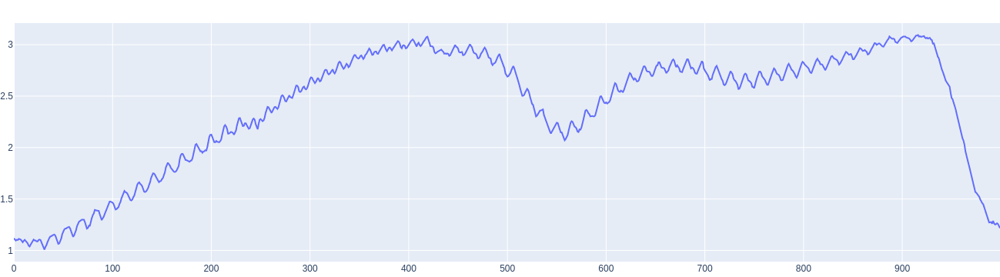

In [35]:
plotter(avg)

In [23]:
# testai

array = np.array([1,2,3,4,5,6,7,8,9,10,9,8,7,6,5,4,3,2,1])
array[5:] - array[:-5]

# res = array - (array[5:]+np.array([0]*5))
# res

array([ 5,  5,  5,  5,  5,  3,  1, -1, -3, -5, -5, -5, -5, -5])

In [24]:
array

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10,  9,  8,  7,  6,  5,  4,  3,
        2,  1])

In [25]:
np.argmin(diff)

NameError: name 'diff' is not defined

In [26]:
def test_wave_splitter(arr, wave_len, fall):
    '''
    variantas triukšmingam nuskaitymui
    suranda bangos pražią, grąžina bangos pradžių indeksus vėlesniam nuskaitymo suskirstymui į bangas:
    fall - tarp kiek narių ieškomas didžiausias perkritimas, laikomas bangos pabaiga
    '''
    # surandame tašką, kur didžiausias perkritimas žemyn
    max_diff_idx = np.argmin(arr[:wave_len][fall:]-arr[:wave_len][:-fall]) + fall
    # nuo to taško imame nedidelį submasyvą. Jo minimumas bus pirmos bangos pradžia.
    split_point = arr[max_diff_idx:max_diff_idx + 100].argmin() + max_diff_idx
    # surandama, kiek sveikų bangų masyve
    waves_count = len(arr[split_point:])//wave_len
    # surandamos likusių bangų pradžios
    split_points = [split_point,]
    last_point = split_point
    for i in range(waves_count):
        last_point += wave_len
        split_points.append(last_point)
    # grąžinamos masyve visos sveikų bangų pradžios (paskutinė nepilna)
    return split_points[:-1]

In [27]:
test_wave_splitter(res, 764, 10)

[125,
 889,
 1653,
 2417,
 3181,
 3945,
 4709,
 5473,
 6237,
 7001,
 7765,
 8529,
 9293,
 10057]

In [28]:
res

array([2.78494, 2.81073, 2.83651, ..., 3.08148, 3.0557 , 2.95255])

In [29]:
naujas = res[5:] - res[:-5]
naujas

array([ 0.10315,  0.10314,  0.09026, ...,  0.05157,  0.01289, -0.10315])

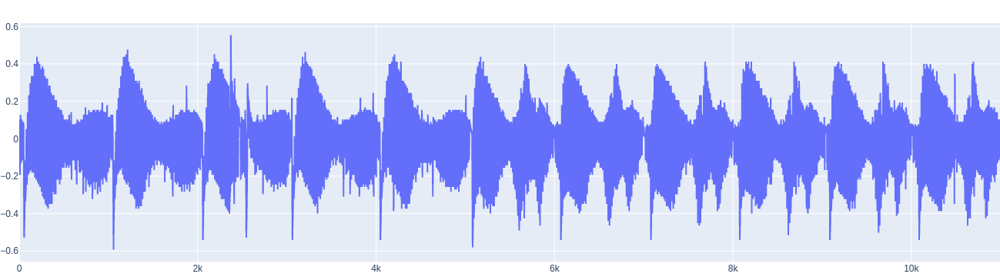

In [30]:
plotter(naujas)

In [31]:
peak = np.array([-0.0, 0.0373902, 0.0515728, 0.0567303, 0.0760698, 0.0966992, 0.0850952, 0.0670447, 0.0541515, 0.0412583, 0.0193396, 0.0154715, 0.0180504, 0.0167611, 0.00902534, 0.0206289, 0.05673, 0.0605984, 0.0670445, 0.0902526, 0.0992777, 0.0850949, 0.072202, 0.0528622, 0.0386798, 0.032233, 0.0257866, 0.0425475, 0.0232079, 0.0296545, 0.051573, 0.0799379, 0.0799379, 0.0966992, 0.119907, 0.117328, 0.11346, 0.0941205, 0.0773592, 0.0683341, 0.0670447, 0.064466, 0.0657556, 0.0593088, 0.0683341, 0.11475, 0.126354, 0.130222, 0.150851, 0.165034, 0.156008, 0.148272, 0.143115, 0.123775, 0.121197, 0.118618, 0.11346, 0.107014, 0.103146, 0.121196, 0.175348, 0.197267, 0.199845, 0.2295, 0.261733, 0.273337, 0.263022, 0.265601, 0.257865, 0.24755, 0.239814, 0.223053, 0.223053, 0.225631, 0.264312, 0.348117, 0.415162, 0.448684, 0.43837, 0.410005, 0.404848, 0.406137, 0.402269, 0.394533, 0.377772, 0.36359, 0.364879, 0.340381, 0.354564, 0.394533, 0.422898, 0.455131, 0.45771, 0.440949, 0.431924, 0.410005, 0.424188, 0.406137, 0.390665, 0.376483, 0.361011, 0.349406, 0.335224, 0.366168, 0.408716, 0.434502, 0.470603, 0.465446, 0.444817, 0.430634, 0.413873, 0.398401, 0.386797, 0.370036, 0.361011, 0.341671, 0.331356, 0.328778, 0.354564, 0.384218, 0.422898, 0.440949, 0.424188, 0.407426, 0.390665, 0.377772, 0.348117, 0.332646, 0.319752, 0.306859, 0.301702, 0.284941, 0.30428, 0.32362, 0.350696, 0.388086, 0.40098, 0.386797, 0.371325, 0.357143, 0.319752, 0.295255, 0.277205, 0.26689, 0.256576, 0.243682, 0.241103, 0.256575, 0.28494, 0.336514, 0.373904, 0.393244, 0.376482, 0.353275, 0.327488, 0.299123, 0.278494, 0.263022, 0.251418, 0.242393, 0.230789, 0.232078, 0.252708, 0.295255, 0.333935, 0.353275, 0.355853, 0.332645, 0.305569, 0.282362, 0.257864, 0.251418, 0.226921, 0.214028, 0.215317, 0.192109, 0.198556, 0.226921, 0.261733, 0.30557, 0.332646, 0.317174, 0.288808, 0.265601, 0.237236, 0.217896, 0.202424, 0.198556, 0.18953, 0.168901, 0.170191, 0.189531, 0.2295, 0.277204, 0.314595, 0.326199, 0.291387, 0.270758, 0.246261, 0.223053, 0.202424, 0.19082, 0.183084, 0.174059, 0.162455, 0.167612, 0.192109, 0.233367, 0.28623, 0.314595, 0.30428, 0.277205, 0.253997, 0.22821, 0.207581, 0.197267, 0.180505, 0.174059, 0.161165, 0.149561])


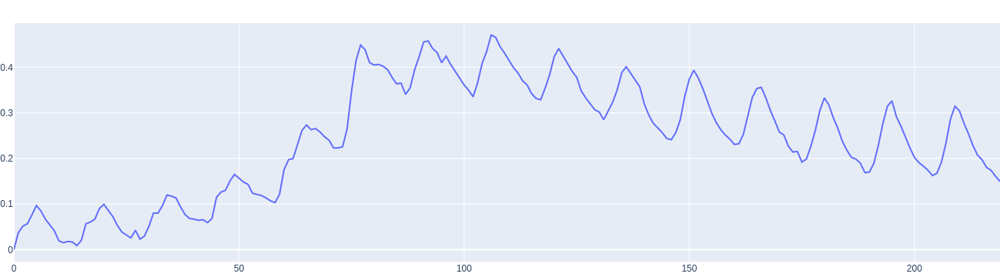

In [32]:
plotter(peak)

In [33]:
np.arange(0, 10)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])